<a href="https://colab.research.google.com/github/Evgenii1994/DLS/blob/main/week_06/Homework/hw_6_semantic_segmentation_ipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<center><image src="https://drive.google.com/uc?id=1n3G4TdK_u6PQHcLrxB_A0HijNdigXmUH">

<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Сегментация изображений</b></h3>


В этом задании вам предстоит решить задачу сегментации медицинских снимков. Домашнее задание можно разделить на следующие части:

* Построй свой первый бейзлайн! [6]
  * BCE Loss [2]
  * SegNet [2]
  * Train [1]
  * Test [1]
* Мир других лоссов! [2]
  * Dice Loss [1]
  * Focal Loss [1]
  * BONUS: лосс из статьи [5]
* Новая модель! [2]
  * UNet [2]


**Максимальный балл:** 10 баллов.

Также для студентов желающих еще более углубиться в задачу предлагается решить бонусное задание, которое даст дополнительные 5 баллов. BONUS задание необязательное.


# Загрузка данных

1. Для начала мы скачаем датасет: [ADDI project](https://www.fc.up.pt/addi/ph2%20database.html).

<table><tr><td>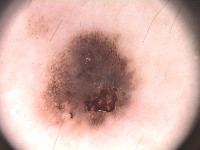</td><td>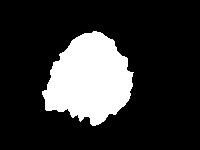</td></tr></table>

2. Разархивируем .rar файл.
3. Обратите внимание, что папка  `PH2 Dataset images` должна лежать там же где и ipynb notebook.

Это фотографии двух типов **поражений кожи:** меланома и родинки.
В данном задании мы не будем заниматься их классификацией, а будем **сегментировать** их.

In [1]:
!gdown 1T_RPkPP0jeWwK8L1UrmBw8V30eD7v6Ql

Downloading...
From (original): https://drive.google.com/uc?id=1T_RPkPP0jeWwK8L1UrmBw8V30eD7v6Ql
From (redirected): https://drive.google.com/uc?id=1T_RPkPP0jeWwK8L1UrmBw8V30eD7v6Ql&confirm=t&uuid=e2f70db9-2c0f-4df8-8db6-64aaece991c5
To: /content/PH2Dataset.rar
100% 162M/162M [00:01<00:00, 110MB/s]


In [2]:
get_ipython().system_raw("unrar x PH2Dataset.rar")

Стуктура датасета у нас следующая:

    IMD_002/
        IMD002_Dermoscopic_Image/
            IMD002.bmp
        IMD002_lesion/
            IMD002_lesion.bmp
        IMD002_roi/
            ...
    IMD_003/
        ...
        ...

 Здесь `X.bmp` — изображение, которое нужно сегментировать, `X_lesion.bmp` — результат сегментации.

Для загрузки датасета можно использовать skimage: [`skimage.io.imread()`](https://scikit-image.org/docs/dev/api/skimage.io.html)

In [3]:
images = []
lesions = []
from skimage.io import imread
import os
root = 'PH2Dataset'

for root, dirs, files in os.walk(os.path.join(root, 'PH2 Dataset images')):
    if root.endswith('_Dermoscopic_Image'):
        images.append(imread(os.path.join(root, files[0])))
    if root.endswith('_lesion'):
        lesions.append(imread(os.path.join(root, files[0])))

Изображения имеют разные размеры. Давайте изменим их размер на $256\times256 $ пикселей. Для изменения размера изображений можно использовать [`skimage.transform.resize()`](https://scikit-image.org/docs/dev/api/skimage.transform.html#skimage.transform.resize).
Эта функция также автоматически нормализует изображения в диапазоне $[0,1]$.


In [4]:
from skimage.transform import resize
size = (256, 256)
X = [resize(x, size, mode='constant', anti_aliasing=True,) for x in images]
Y = [resize(y, size, mode='constant', anti_aliasing=False) > 0.5 for y in lesions]

In [5]:
import numpy as np
X = np.array(X, np.float32)
Y = np.array(Y, np.float32)
print(f'Loaded {len(X)} images')

Loaded 200 images


Чтобы убедиться, что все корректно, мы нарисуем несколько изображений

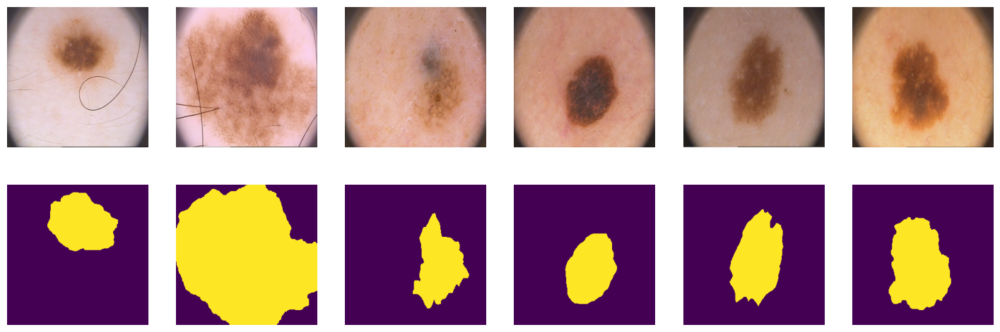

In [6]:
import matplotlib.pyplot as plt
from IPython.display import clear_output

plt.figure(figsize=(18, 6))
for i in range(6):
    plt.subplot(2, 6, i+1)
    plt.axis("off")
    plt.imshow(X[i])

    plt.subplot(2, 6, i+7)
    plt.axis("off")
    plt.imshow(Y[i])
plt.show();

Разделим наши 200 картинок на 100/50/50
 для обучения, валидации и теста соответственно

In [7]:
ix = np.random.choice(len(X), len(X), False)
tr, val, ts = np.split(ix, [100, 150])

In [8]:
print(len(tr), len(val), len(ts))

100 50 50


## PyTorch DataLoader

In [9]:
from torch.utils.data import DataLoader
batch_size = 32
train_dataloader = DataLoader(list(zip(np.rollaxis(X[tr], 3, 1), Y[tr, np.newaxis])),
                     batch_size=batch_size, shuffle=True)
valid_dataloader = DataLoader(list(zip(np.rollaxis(X[val], 3, 1), Y[val, np.newaxis])),
                      batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(list(zip(np.rollaxis(X[ts], 3, 1), Y[ts, np.newaxis])),
                     batch_size=batch_size, shuffle=True)

In [148]:
import torch
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2

import numpy as np
from tqdm import tqdm

class SegmentationDataset(Dataset):
    def __init__(self, images, masks, transform=None):
        self.images = images
        self.masks = masks
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
      image = self.images[idx]  # (H, W, C)
      mask = self.masks[idx]    # (H, W)  !!!

      if self.transform:
          augmented = self.transform(image=image, mask=mask)
          image = augmented['image']
          mask = augmented['mask']

      # Важно: добавить ось канала для маски
      if mask.ndim == 2:
          mask = mask.unsqueeze(0)  # (1, H, W)

      return image, mask


def compute_mean_std(images):
    """
    images: np.ndarray of shape (N, H, W, C)
    Returns: mean, std per channel
    """
    N, H, W, C = images.shape
    mean = np.zeros(C)
    std = np.zeros(C)

    print("Computing mean and std over dataset...")
    for img in tqdm(images):
        img = img / 255.0  # важно! приводим в диапазон [0, 1] если uint8
        mean += img.mean(axis=(0, 1))
        std += img.std(axis=(0, 1))

    mean /= N
    std /= N

    return mean.tolist(), std.tolist()

# Теперь посчитаем mean/std:
train_mean, train_std = compute_mean_std(X_train)

print(f"Mean: {train_mean}")
print(f"Std: {train_std}")


def make_transforms(image_size=(256, 256), mean=(0.5,), std=(0.5,), strong_aug=True):
    if strong_aug:
        train_transform = A.Compose([
            A.Resize(*image_size),
            A.HorizontalFlip(p=0.5),
            A.RandomRotate90(p=0.5),
            A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.1, rotate_limit=15, p=0.5),
            A.RandomBrightnessContrast(p=0.3),
            A.RandomGamma(p=0.3),
            A.GaussNoise(p=0.2),
            A.OneOf([
                A.MotionBlur(p=0.2),
                A.MedianBlur(blur_limit=3, p=0.1),
                A.Blur(blur_limit=3, p=0.1),
            ], p=0.2),
            A.Normalize(mean=mean, std=std),
            ToTensorV2()
        ])
    else:
        train_transform = A.Compose([
            A.Resize(*image_size),
            A.HorizontalFlip(p=0.5),
            A.RandomBrightnessContrast(p=0.3),
            A.Normalize(mean=mean, std=std),
            ToTensorV2()
        ])

    val_transform = A.Compose([
        A.Resize(*image_size),
        A.Normalize(mean=mean, std=std),
        ToTensorV2()
    ])

    test_transform = A.Compose([
        A.Resize(*image_size),
        A.Normalize(mean=mean, std=std),
        ToTensorV2()
    ])

    return train_transform, val_transform, test_transform

train_mean, train_std = compute_mean_std(X_train)

print(f"Mean: {train_mean}")
print(f"Std: {train_std}")

train_transform, val_transform, test_transform = make_transforms(
    image_size=(256, 256),
    mean=train_mean,
    std=train_std,
    strong_aug=True  # True = сильно аугментировать, False = мягкие аугментации
)

# Создание датасетов
train_dataset = SegmentationDataset(X_train, Y_train, transform=train_transform)
val_dataset = SegmentationDataset(X_val, Y_val, transform=val_transform)
test_dataset = SegmentationDataset(X_test, Y_test, transform=test_transform)

# Создание лоадеров
batch_size = 32

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

Computing mean and std over dataset...


100%|██████████| 100/100 [00:00<00:00, 261.95it/s]


Mean: [0.0029788361862301826, 0.002263399863149971, 0.0018864233733620495]
Std: [0.0006252144910104107, 0.0006038062158040703, 0.0006035679191700183]
Computing mean and std over dataset...


100%|██████████| 100/100 [00:00<00:00, 263.29it/s]

Mean: [0.0029788361862301826, 0.002263399863149971, 0.0018864233733620495]
Std: [0.0006252144910104107, 0.0006038062158040703, 0.0006035679191700183]


In [10]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


# Метрика

## IoU (intersection over union)

В данном разделе предлагается использовать следующую метрику для оценки качества:

$I o U=\frac{\text {target } \cap \text { prediction }}{\text {target } \cup{prediction }}$

Пересечение (A ∩ B) состоит из пикселей, найденных как в маске предсказания, так и в основной маске истины, тогда как объединение (A ∪ B) просто состоит из всех пикселей, найденных либо в маске предсказания, либо в целевой маске.


Что будет являться пересением и объединением в задаче сегментации?

Давайте разберем следующий пример:





<p style="align: center;"><img align=center src="https://drive.google.com/uc?export=view&id=1rBYFgli48AUUN9idiyq8j3J5DboB93yN" width=1000 height=800/></p>

In [11]:
!pip install torchmetrics

In [12]:
from torchmetrics import JaccardIndex

iou_score = JaccardIndex(threshold=0.5, task="binary", average='none').to(device)

# Построй свой первый бейзлайн!

Итак, загрузка файлов, код датасета и даталоадера написана за вас. Метрика IoU написана за вас! Вам остается написать лосс, модель и функции обучения и теста модели.

* Построй свой первый бейзлайн! [6]
  * BCE Loss [2]
  * SegNet [2]
  * Train [1]
  * Test [1]

## BCE Loss [2 балла]

Популярным лоссом для бинарной сегментации является *бинарная кросс-энтропия*, которая задается следующим образом:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right] \space [1]$$

где $y$ это  таргет желаемого результата и $\hat y$ является выходом модели. $\sigma$ - это [*логистическая* функция](https://en.wikipedia.org/wiki/Sigmoid_function), который преобразует действительное число $\mathbb R$ в вероятность $[0,1]$.

Однако эта потеря страдает от проблем численной нестабильности. Самое главное, что $\lim_{x\rightarrow0}\log(x)=\infty$ приводит к неустойчивости в процессе оптимизации. Рекомендуется посмотреть следующее [упрощение](https://www.tensorflow.org/api_docs/python/tf/nn/sigmoid_cross_entropy_with_logits). Эта функция эквивалентна первой и не так подвержена численной неустойчивости:

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right) \space [2]$$

### Вывод численно стабильной формулы BCE лосса [1 балл]



Выведите из формулы [1] формулу [2]:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right] \space [1]$$

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right) \space [2]$$

Не забываем, что здесь $\hat y_i$ - это логиты сети, не вероятности и не лейблы.

**Ответ:**

### Реализуйте в коде оба варианта лосса [1 балл]

Реализуйте следующие функции:

*   `bce_true()` - честная прямая реализация лосса с формулой $$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$
*   `bce_loss()` - реализация формулы, которую мы вывели $$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right).$$

И сравните результаты функций с реализацией Pytorch:
*   `bce_torch()`
*   `bce_torch_with_logits()`

In [13]:
import torch.nn.functional as F
import torch.nn as nn

In [14]:
bce_torch = nn.BCELoss(reduction='sum') # (sigmoid(y_pred), y_real)
bce_torch_with_logits = nn.BCEWithLogitsLoss(reduction='sum')

In [15]:
import numpy as np

def bce_true(y_pred: torch.Tensor, y_real: torch.Tensor) -> torch.Tensor:
    y_pred = y_pred.float()
    y_real = y_real.float()

    sigmoid = torch.sigmoid(y_pred)

    eps = 1e-12
    sigmoid = torch.clamp(sigmoid, min=eps, max=1. - eps)

    loss = - (y_real * torch.log(sigmoid) + (1 - y_real) * torch.log(1 - sigmoid))

    return loss.sum()

def bce_loss(y_pred: torch.Tensor, y_real: torch.Tensor) -> torch.Tensor:
    y_pred = y_pred.float()
    y_real = y_real.float()

    loss = y_pred - y_real * y_pred + torch.log1p(torch.exp(-y_pred))

    return loss.sum()

Проверим корректность работы на простом примере

In [16]:
y_pred = torch.randn(3, 2, requires_grad=False)
y_true = torch.rand(3, 2, requires_grad=False)

print(f'BCE loss from scratch bce_loss = {bce_loss(y_pred, y_true)}')
print(f'BCE loss честно посчитанный = {bce_true(y_pred, y_true)}')
print(f'BCE loss from torch bce_torch = {bce_torch(torch.sigmoid(y_pred), y_true)}')
print(f'BCE loss from torch with logits bce_torch = {bce_torch_with_logits(y_pred, y_true)}')
print("success")

BCE loss from scratch bce_loss = 5.375298500061035
BCE loss честно посчитанный = 5.375298500061035
BCE loss from torch bce_torch = 5.375298976898193
BCE loss from torch with logits bce_torch = 5.375298500061035
success


Инструкции `assert` в Python — это булевы выражения, которые проверяют, является ли условие истинным (`True`). Внизу в коде мы проверяем функция `bce_loss()` выдает тот же результат, что и функция из Pytorch или нет. Если равенства не будет, что будет означать, что результаты функций не совпадают, а значит вы неправильно реализовали фукнцию `bce_loss()`, `assert` возвратит ошибку.

Функция `numpy.isclose()` используется для сравнения двух чисел с учётом допустимой погрешности. Она особенно полезна при работе с числами с плавающей точкой, где точное сравнение может быть проблематичным из-за ограничений представления таких чисел в компьютере.

Как она работает?

`numpy.isclose(a, b, rtol=1e-05, atol=1e-08) `принимает два числа (`a` и `b`) и сравнивает их, учитывая относительную и абсолютную погрешность. Если разница между двумя числами меньше заданного порога, функция возвращает `True`, иначе — `False`.

Параметры:

    rtol: Относительная погрешность (по умолчанию 1e-05). Используется для определения разницы относительно большего значения.
    atol: Абсолютная погрешность (по умолчанию 1e-08). Определяет минимальную разницу, которую следует учитывать.

Мы будем использовать `assert` и `numpy.isclose()` для проверки корректности нашего кода.

In [17]:
assert np.isclose(bce_loss(y_pred, y_true), bce_torch(torch.sigmoid(y_pred), y_true))
assert np.isclose(bce_loss(y_pred, y_true), bce_torch_with_logits(y_pred, y_true))
assert np.isclose(bce_true(y_pred, y_true), bce_torch(torch.sigmoid(y_pred), y_true))
assert np.isclose(bce_true(y_pred, y_true), bce_torch_with_logits(y_pred, y_true))
print("success")

success


Давайте теперь посчитаем на простом примере, но с теми же размерностями, что и в датасете

In [18]:
y_pred = torch.randn((2, 1, 3, 3), requires_grad=False)
y_true = torch.randint(0, 2, (2, 1, 3, 3))

print(f'BCE loss from scratch bce_loss = {bce_loss(y_pred, y_true)}')
print(f'BCE loss честно посчитанный = {bce_true(y_pred, y_true)}')
print(f'BCE loss from torch bce_torch = {bce_torch(torch.sigmoid(y_pred), y_true.to(torch.float))}')
print(f'BCE loss from torch with logits bce_torch = {bce_torch_with_logits(y_pred, y_true.to(torch.float))}')
print("success")

BCE loss from scratch bce_loss = 16.31989860534668
BCE loss честно посчитанный = 16.319896697998047
BCE loss from torch bce_torch = 16.319896697998047
BCE loss from torch with logits bce_torch = 16.31989860534668
success


In [19]:
assert np.isclose(bce_loss(y_pred, y_true), bce_torch(torch.sigmoid(y_pred), y_true.to(torch.float)))
assert np.isclose(bce_loss(y_pred, y_true), bce_torch_with_logits(y_pred, y_true.to(torch.float)))
assert np.isclose(bce_true(y_pred, y_true), bce_torch(torch.sigmoid(y_pred), y_true.to(torch.float)))
assert np.isclose(bce_true(y_pred, y_true), bce_torch_with_logits(y_pred, y_true.to(torch.float)))
print("success")

success


Давайте посчитаем на реальных логитах и сегментационной маске:

In [20]:
!gdown --folder 1EX0RW1TRQVkLmR1h6miCQqyhYPFyg28M

Retrieving folder contents
Processing file 1-0A7_CS_vKiSCkgIDJ4joThCEcFedA3I logits.pt
Processing file 1--WxvBdpMn_NOmYPf3a4au8MHzfx5baC labels.pt
Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=1-0A7_CS_vKiSCkgIDJ4joThCEcFedA3I
To: /content/for_asserts/logits.pt
100% 1.18k/1.18k [00:00<00:00, 4.70MB/s]
Downloading...
From: https://drive.google.com/uc?id=1--WxvBdpMn_NOmYPf3a4au8MHzfx5baC
To: /content/for_asserts/labels.pt
100% 1.18k/1.18k [00:00<00:00, 4.58MB/s]
Download completed


In [21]:
path_to_dummy_samples = '/content/for_asserts'
dummpy_sample = {'logits': torch.load(f'{path_to_dummy_samples}/logits.pt'),
                 'labels': torch.load(f'{path_to_dummy_samples}/labels.pt')}
dummpy_sample['labels'] = dummpy_sample['labels'].to(device)
dummpy_sample['logits'] = dummpy_sample['logits'].to(device)

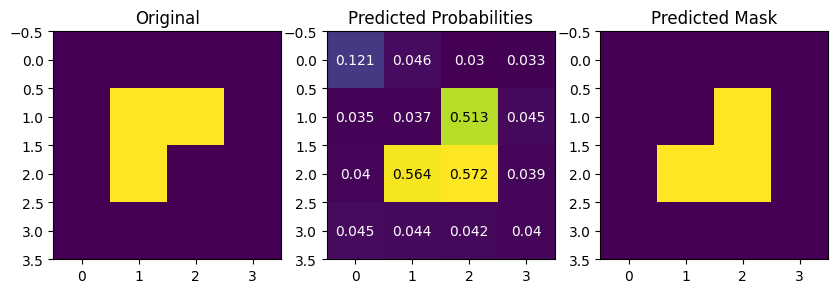

In [22]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize= (10,3*10))

ax1.imshow(dummpy_sample['labels'].squeeze(1)[0].cpu())
ax1.set_title("Original")

ax2.imshow(dummpy_sample['logits'].sigmoid().squeeze(1)[0].cpu())
for (j,i),label in np.ndenumerate(dummpy_sample['logits'].sigmoid().squeeze(1)[0].cpu()):
    if label < 0.5:
        color = 'white'
    else:
        color = 'black'
    ax2.text(i,j,round(label,3), color=color, ha='center',va='center')

ax2.set_title("Predicted Probabilities")

ax3.imshow((dummpy_sample['logits'].sigmoid() > 0.5).squeeze(1)[0].cpu())
ax3.set_title("Predicted Mask")
plt.show()

Проверяем на данном примере:

In [23]:
bce_loss_score = bce_loss(dummpy_sample['logits'].cpu(), dummpy_sample['labels'].cpu())
bce_true_score = bce_true(dummpy_sample['logits'].cpu(), dummpy_sample['labels'].cpu())
bce_torch_score = bce_torch(torch.sigmoid(dummpy_sample['logits'].cpu()), dummpy_sample['labels'].cpu().float())
bce_torch_with_logits_score = bce_torch_with_logits(dummpy_sample['logits'].cpu(), dummpy_sample['labels'].cpu().float())
assert np.isclose(bce_loss_score, bce_torch_score)
assert np.isclose(bce_loss_score, bce_torch_with_logits_score)
assert np.isclose(bce_true_score, bce_torch_score)
assert np.isclose(bce_true_score, bce_torch_with_logits_score)
print("success")

success


## SegNet [2 балла]

Ваше задание здесь состоит в том, чтобы реализовать SegNet архитектуру.

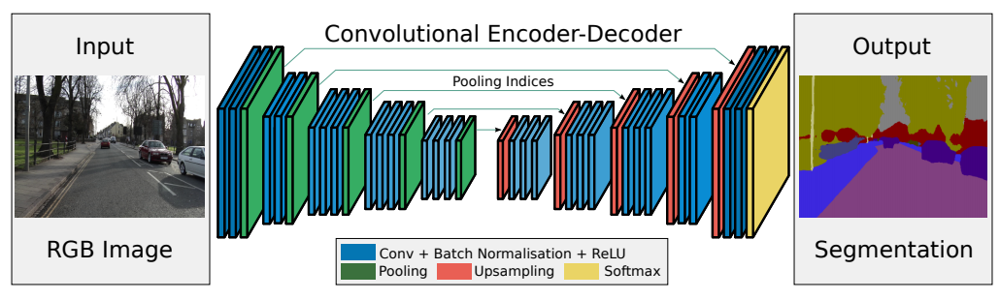

* Badrinarayanan, V., Kendall, A., & Cipolla, R. (2015). [SegNet: A deep convolutional
encoder-decoder architecture for image segmentation](https://arxiv.org/pdf/1511.00561.pdf)

Внимательно посмотрите из чего состоит модель и для чего выбраны те или иные блоки.

In [24]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torch.optim as optim
from time import time

from matplotlib import rcParams
rcParams['figure.figsize'] = (15,4)

Хорошие ресурсы по SegNet архитектуре:
1. https://medium.com/@nikdenof/segnet-from-scratch-using-pytorch-3fe9b4527239


In [25]:
import torch
import torch.nn as nn

class SegNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1):
        super(SegNet, self).__init__()

        # ------- Encoder (VGG16) -------
        self.enc1 = self._make_enc_block(in_channels, 64, 2)
        self.enc2 = self._make_enc_block(64, 128, 2)
        self.enc3 = self._make_enc_block(128, 256, 3)
        self.enc4 = self._make_enc_block(256, 512, 3)
        self.enc5 = self._make_enc_block(512, 512, 3)

        self.pool = nn.MaxPool2d(2, 2, return_indices=True)

        # ------- Decoder -------
        self.unpool = nn.MaxUnpool2d(2, 2)

        self.dec5 = self._make_dec_block(512, 512, 3)
        self.dec4 = self._make_dec_block(512, 256, 3)
        self.dec3 = self._make_dec_block(256, 128, 3)
        self.dec2 = self._make_dec_block(128, 64, 2)
        self.dec1 = self._make_dec_block(64, out_channels, 2, final_layer=True)

    def _make_enc_block(self, in_channels, out_channels, conv_layers):
        layers = []
        for i in range(conv_layers):
            layers.append(nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1))
            layers.append(nn.BatchNorm2d(out_channels))
            layers.append(nn.ReLU(inplace=True))
            in_channels = out_channels
        return nn.Sequential(*layers)

    def _make_dec_block(self, in_channels, out_channels, conv_layers, final_layer=False):
        layers = []
        for i in range(conv_layers):
            layers.append(nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1))
            if not final_layer:
                layers.append(nn.BatchNorm2d(out_channels))
                layers.append(nn.ReLU(inplace=True))
            in_channels = out_channels
        return nn.Sequential(*layers)

    def forward(self, x):
        # --------- Encoder ---------
        x1 = self.enc1(x)
        x1p, idx1 = self.pool(x1)

        x2 = self.enc2(x1p)
        x2p, idx2 = self.pool(x2)

        x3 = self.enc3(x2p)
        x3p, idx3 = self.pool(x3)

        x4 = self.enc4(x3p)
        x4p, idx4 = self.pool(x4)

        x5 = self.enc5(x4p)
        x5p, idx5 = self.pool(x5)  # <--- вот тут bottleneck

        # --------- Decoder ---------
        x5u = self.unpool(x5p, idx5)
        x5d = self.dec5(x5u)

        x4u = self.unpool(x5d, idx4)
        x4d = self.dec4(x4u)

        x3u = self.unpool(x4d, idx3)
        x3d = self.dec3(x3u)

        x2u = self.unpool(x3d, idx2)
        x2d = self.dec2(x2u)

        x1u = self.unpool(x2d, idx1)
        output = self.dec1(x1u)

        return output


## Тренировка [1 балл]

Напишите функцию для обучения модели.

In [27]:
from tqdm.notebook import tqdm

In [175]:
import torch
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau, LambdaLR, OneCycleLR
from tqdm import tqdm

def create_scheduler(optimizer, scheduler_type, num_epochs, steps_per_epoch, lr, scheduler_params):
    if scheduler_type == 'plateau':
        scheduler = ReduceLROnPlateau(optimizer, **scheduler_params)
        scheduler_step_per_batch = False
    elif scheduler_type == 'cosine':
        def lr_lambda(current_epoch):
            if 'warmup_epochs' in scheduler_params:
                warmup_epochs = scheduler_params['warmup_epochs']
            else:
                warmup_epochs = 5
            if current_epoch < warmup_epochs:
                return float(current_epoch) / float(max(1, warmup_epochs))
            else:
                progress = (current_epoch - warmup_epochs) / float(max(1, num_epochs - warmup_epochs))
                return 0.5 * (1.0 + torch.cos(torch.tensor(progress * 3.1415926535)))
        scheduler = LambdaLR(optimizer, lr_lambda)
        scheduler_step_per_batch = False
    elif scheduler_type == 'onecycle':
        scheduler = OneCycleLR(
            optimizer,
            max_lr=lr,
            total_steps=num_epochs * steps_per_epoch,
            pct_start=0.3,
            anneal_strategy='cos',
            final_div_factor=1e4
        )
        scheduler_step_per_batch = True
    else:
        raise ValueError(f"Unknown scheduler_type: {scheduler_type}")

    return scheduler, scheduler_step_per_batch

In [176]:
import torch
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau, LambdaLR, OneCycleLR
from tqdm import tqdm

class EarlyStopping:
    def __init__(self, patience=10, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss > self.best_loss - self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_loss = val_loss
            self.counter = 0

def train(
    model,
    train_loader,
    val_loader,
    loss_fn,
    metrics: dict = None,
    num_epochs: int = 25,
    lr: float = 1e-3,
    device: str = "cuda" if torch.cuda.is_available() else "cpu",
    checkpoint_path: str = "best_model.pth",
    scheduler_type: str = "onecycle",  # onecycle / plateau / cosine
    scheduler_params: dict = None,
    patience: int = 10
):
    model = model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)

    steps_per_epoch = len(train_loader)
    if scheduler_params is None:
        scheduler_params = {}
    scheduler, scheduler_step_per_batch = create_scheduler(
        optimizer, scheduler_type, num_epochs, steps_per_epoch, lr, scheduler_params
    )

    early_stopping = EarlyStopping(patience=patience)

    history = {
        'train_loss': [],
        'val_loss': [],
        'lrs': [],
        'metrics': {}
    }
    if metrics:
        for name in metrics:
            history['metrics'][name] = {'train': [], 'val': []}

    best_val_loss = float('inf')

    for epoch in range(1, num_epochs + 1):
        model.train()
        running_loss = 0.0
        running_metrics = {name: 0.0 for name in (metrics or {})}

        train_bar = tqdm(train_loader, desc=f"Epoch {epoch}/{num_epochs} [Train]", leave=False)
        for inputs, targets in train_bar:
            inputs, targets = inputs.to(device), targets.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = loss_fn(outputs, targets.float())
            loss.backward()
            optimizer.step()

            if scheduler_step_per_batch:
                scheduler.step()

            running_loss += loss.item()
            for name, fn in (metrics or {}).items():
                running_metrics[name] += fn(outputs, targets).item()

            train_bar.set_postfix(loss=loss.item(),
                                  **{name: running_metrics[name] / (train_bar.n + 1) for name in running_metrics})

        avg_train_loss = running_loss / len(train_loader)
        history['train_loss'].append(avg_train_loss)

        for name in running_metrics:
            history['metrics'][name]['train'].append(running_metrics[name] / len(train_loader))

        current_lr = optimizer.param_groups[0]['lr']
        history['lrs'].append(current_lr)

        # VALIDATION
        model.eval()
        val_loss = 0.0
        val_metrics = {name: 0.0 for name in (metrics or {})}

        with torch.no_grad():
            val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{num_epochs} [Val]", leave=False)
            for inputs, targets in val_bar:
                inputs, targets = inputs.to(device), targets.to(device)
                outputs = model(inputs)
                loss = loss_fn(outputs, targets.float())

                val_loss += loss.item()
                for name, fn in (metrics or {}).items():
                    val_metrics[name] += fn(outputs, targets).item()

                val_bar.set_postfix(loss=loss.item(),
                                    **{name: val_metrics[name] / (val_bar.n + 1) for name in val_metrics})

        avg_val_loss = val_loss / len(val_loader)
        history['val_loss'].append(avg_val_loss)

        for name in val_metrics:
            history['metrics'][name]['val'].append(val_metrics[name] / len(val_loader))

        # Вывод
        metric_str = " | ".join(
            [f"{name}: train {history['metrics'][name]['train'][-1]:.4f}, val {history['metrics'][name]['val'][-1]:.4f}"
             for name in (metrics or {})]
        )
        print(f"Epoch {epoch}/{num_epochs} | "
              f"Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f}"
              + (f" | {metric_str}" if metric_str else "") + f" | LR: {current_lr:.2e}")

        # Scheduler step по эпохам
        if not scheduler_step_per_batch and scheduler_type != "none":
            if scheduler_type == "plateau":
                scheduler.step(avg_val_loss)
            else:
                scheduler.step()

        # Save best model
        if avg_val_loss < best_val_loss:
            print(f"  ↳ Saving best model (val loss {best_val_loss:.4f} → {avg_val_loss:.4f})")
            best_val_loss = avg_val_loss
            torch.save(model.state_dict(), checkpoint_path)

        # Early Stopping
        early_stopping(avg_val_loss)
        if early_stopping.early_stop:
            print(f"  ↳ Early stopping triggered at epoch {epoch}")
            break

    return model, history

Обучите модель **SegNet**. В качестве оптимайзера можно взять Adam.

In [216]:
import torch
import gc

del segnet_model
gc.collect()

torch.cuda.empty_cache()

In [217]:
segnet_model = SegNet().to(device)
segnet_model, history = train(
    segnet_model, train_dataloader, valid_dataloader, bce_loss,
    metrics={'iou': iou_score},
    num_epochs=100, lr=1e-3,
    scheduler_type='onecycle',
    patience=20,
    checkpoint_path="best_segnet.pth"
)

Epoch 1/100 | Train Loss: 1074192.5078 | Val Loss: 1103947.3750 | iou: train 0.0379, val 0.0000 | LR: 4.27e-05
  ↳ Saving best model (val loss inf → 1103947.3750)


Epoch 2/100 | Train Loss: 1070570.6094 | Val Loss: 1103893.9062 | iou: train 0.0436, val 0.0000 | LR: 5.07e-05
  ↳ Saving best model (val loss 1103947.3750 → 1103893.9062)


Epoch 3/100 | Train Loss: 1069265.2461 | Val Loss: 1103787.4375 | iou: train 0.0372, val 0.0000 | LR: 6.39e-05
  ↳ Saving best model (val loss 1103893.9062 → 1103787.4375)


Epoch 4/100 | Train Loss: 1063098.1289 | Val Loss: 1103607.5625 | iou: train 0.0580, val 0.0000 | LR: 8.22e-05
  ↳ Saving best model (val loss 1103787.4375 → 1103607.5625)


Epoch 5/100 | Train Loss: 1048085.4414 | Val Loss: 1103171.8438 | iou: train 0.1096, val 0.0000 | LR: 1.05e-04
  ↳ Saving best model (val loss 1103607.5625 → 1103171.8438)


Epoch 6/100 | Train Loss: 1041874.3867 | Val Loss: 1102428.9688 | iou: train 0.1261, val 0.0000 | LR: 1.33e-04
  ↳ Saving best model (val loss 1103171.8438 → 1102428.9688)


Epoch 7/100 | Train Loss: 1033234.1719 | Val Loss: 1100845.3750 | iou: train 0.1700, val 0.0000 | LR: 1.65e-04
  ↳ Saving best model (val loss 1102428.9688 → 1100845.3750)


Epoch 8/100 | Train Loss: 1010112.0586 | Val Loss: 1044366.0938 | iou: train 0.2631, val 0.2258 | LR: 2.01e-04
  ↳ Saving best model (val loss 1100845.3750 → 1044366.0938)


Epoch 9/100 | Train Loss: 1005673.6953 | Val Loss: 904652.7500 | iou: train 0.2952, val 0.5796 | LR: 2.41e-04
  ↳ Saving best model (val loss 1044366.0938 → 904652.7500)


Epoch 10/100 | Train Loss: 978154.9336 | Val Loss: 854456.6250 | iou: train 0.3994, val 0.6268 | LR: 2.84e-04
  ↳ Saving best model (val loss 904652.7500 → 854456.6250)


Epoch 11/100 | Train Loss: 961265.0859 | Val Loss: 1352280.9062 | iou: train 0.4269, val 0.5009 | LR: 3.29e-04


Epoch 12/100 | Train Loss: 932538.5312 | Val Loss: 835761.5000 | iou: train 0.4984, val 0.6800 | LR: 3.77e-04
  ↳ Saving best model (val loss 854456.6250 → 835761.5000)


Epoch 13/100 | Train Loss: 899661.7422 | Val Loss: 800651.1250 | iou: train 0.5510, val 0.6724 | LR: 4.26e-04
  ↳ Saving best model (val loss 835761.5000 → 800651.1250)


Epoch 14/100 | Train Loss: 875592.8555 | Val Loss: 891221.7812 | iou: train 0.5258, val 0.6277 | LR: 4.76e-04


Epoch 15/100 | Train Loss: 826916.9180 | Val Loss: 1575576.2500 | iou: train 0.6033, val 0.4516 | LR: 5.26e-04


Epoch 16/100 | Train Loss: 782812.0156 | Val Loss: 1957064.3750 | iou: train 0.6025, val 0.4395 | LR: 5.77e-04


Epoch 17/100 | Train Loss: 728444.4102 | Val Loss: 1327926.5000 | iou: train 0.6776, val 0.4168 | LR: 6.27e-04


Epoch 18/100 | Train Loss: 727863.1758 | Val Loss: 1162349.7812 | iou: train 0.5878, val 0.5707 | LR: 6.76e-04


Epoch 19/100 | Train Loss: 681045.4688 | Val Loss: 1640187.8125 | iou: train 0.5438, val 0.5060 | LR: 7.23e-04


Epoch 20/100 | Train Loss: 617115.5430 | Val Loss: 7833097.0000 | iou: train 0.6680, val 0.4066 | LR: 7.67e-04


Epoch 21/100 | Train Loss: 608959.6328 | Val Loss: 4466282.7500 | iou: train 0.6051, val 0.4472 | LR: 8.09e-04


Epoch 22/100 | Train Loss: 554616.8359 | Val Loss: 1412703.0312 | iou: train 0.6433, val 0.5620 | LR: 8.48e-04


Epoch 23/100 | Train Loss: 508256.2129 | Val Loss: 2989974.5000 | iou: train 0.6795, val 0.5163 | LR: 8.83e-04


Epoch 24/100 | Train Loss: 542235.5039 | Val Loss: 795572.4062 | iou: train 0.6078, val 0.6452 | LR: 9.14e-04
  ↳ Saving best model (val loss 800651.1250 → 795572.4062)


Epoch 25/100 | Train Loss: 554981.6289 | Val Loss: 3455286.5000 | iou: train 0.6305, val 0.4586 | LR: 9.41e-04


Epoch 26/100 | Train Loss: 494988.9121 | Val Loss: 7937712.2500 | iou: train 0.6861, val 0.3997 | LR: 9.63e-04


Epoch 27/100 | Train Loss: 547074.1719 | Val Loss: 2493282.4375 | iou: train 0.6567, val 0.5161 | LR: 9.80e-04


Epoch 28/100 | Train Loss: 555180.3555 | Val Loss: 628932.8438 | iou: train 0.5992, val 0.7214 | LR: 9.92e-04
  ↳ Saving best model (val loss 795572.4062 → 628932.8438)


Epoch 29/100 | Train Loss: 438904.2129 | Val Loss: 547401.2188 | iou: train 0.7210, val 0.7150 | LR: 9.98e-04
  ↳ Saving best model (val loss 628932.8438 → 547401.2188)


Epoch 30/100 | Train Loss: 383479.4297 | Val Loss: 649667.1250 | iou: train 0.7223, val 0.5149 | LR: 1.00e-03


Epoch 31/100 | Train Loss: 425685.6035 | Val Loss: 1502578.2500 | iou: train 0.6699, val 0.4225 | LR: 9.99e-04


Epoch 32/100 | Train Loss: 426444.3574 | Val Loss: 1115040.2812 | iou: train 0.6945, val 0.3678 | LR: 9.97e-04


Epoch 33/100 | Train Loss: 438667.9023 | Val Loss: 2389119.0000 | iou: train 0.6774, val 0.4959 | LR: 9.95e-04


Epoch 34/100 | Train Loss: 404024.5977 | Val Loss: 411362.6250 | iou: train 0.6942, val 0.7614 | LR: 9.91e-04
  ↳ Saving best model (val loss 547401.2188 → 411362.6250)


Epoch 35/100 | Train Loss: 400333.8965 | Val Loss: 482058.4375 | iou: train 0.7385, val 0.7280 | LR: 9.86e-04


Epoch 36/100 | Train Loss: 354342.9180 | Val Loss: 371631.6719 | iou: train 0.7235, val 0.7632 | LR: 9.80e-04
  ↳ Saving best model (val loss 411362.6250 → 371631.6719)


Epoch 37/100 | Train Loss: 411522.4854 | Val Loss: 478968.0938 | iou: train 0.7381, val 0.7360 | LR: 9.74e-04


Epoch 38/100 | Train Loss: 405727.2930 | Val Loss: 527714.4844 | iou: train 0.6846, val 0.5953 | LR: 9.66e-04


Epoch 39/100 | Train Loss: 413389.0664 | Val Loss: 596449.5625 | iou: train 0.6824, val 0.5929 | LR: 9.58e-04


Epoch 40/100 | Train Loss: 370750.6416 | Val Loss: 458993.5156 | iou: train 0.7298, val 0.7003 | LR: 9.48e-04


Epoch 41/100 | Train Loss: 365370.9004 | Val Loss: 508907.9531 | iou: train 0.7346, val 0.6861 | LR: 9.38e-04


Epoch 42/100 | Train Loss: 372707.7803 | Val Loss: 420576.1875 | iou: train 0.7419, val 0.7191 | LR: 9.26e-04


Epoch 43/100 | Train Loss: 354690.6670 | Val Loss: 674754.6875 | iou: train 0.7500, val 0.6010 | LR: 9.14e-04


Epoch 44/100 | Train Loss: 345267.1465 | Val Loss: 411795.2812 | iou: train 0.7522, val 0.7431 | LR: 9.01e-04


Epoch 45/100 | Train Loss: 373165.0566 | Val Loss: 462854.7188 | iou: train 0.7184, val 0.7201 | LR: 8.87e-04


Epoch 46/100 | Train Loss: 348235.6797 | Val Loss: 371113.6797 | iou: train 0.7568, val 0.7585 | LR: 8.73e-04
  ↳ Saving best model (val loss 371631.6719 → 371113.6797)


Epoch 47/100 | Train Loss: 301435.1123 | Val Loss: 398567.7031 | iou: train 0.7659, val 0.7412 | LR: 8.57e-04


Epoch 48/100 | Train Loss: 316298.4355 | Val Loss: 398396.8359 | iou: train 0.7813, val 0.7456 | LR: 8.41e-04


Epoch 49/100 | Train Loss: 296552.8516 | Val Loss: 381573.5625 | iou: train 0.7877, val 0.7464 | LR: 8.25e-04


Epoch 50/100 | Train Loss: 287324.8428 | Val Loss: 371342.4219 | iou: train 0.7593, val 0.7781 | LR: 8.07e-04


Epoch 51/100 | Train Loss: 269909.1309 | Val Loss: 316193.5312 | iou: train 0.7699, val 0.7936 | LR: 7.89e-04
  ↳ Saving best model (val loss 371113.6797 → 316193.5312)


Epoch 52/100 | Train Loss: 288990.2227 | Val Loss: 732044.7812 | iou: train 0.7970, val 0.6339 | LR: 7.71e-04


Epoch 53/100 | Train Loss: 307953.3252 | Val Loss: 331145.3281 | iou: train 0.7439, val 0.7752 | LR: 7.52e-04


Epoch 54/100 | Train Loss: 320004.8652 | Val Loss: 345836.4062 | iou: train 0.7260, val 0.7745 | LR: 7.32e-04


Epoch 55/100 | Train Loss: 316890.0469 | Val Loss: 377443.7500 | iou: train 0.7703, val 0.7787 | LR: 7.12e-04


Epoch 56/100 | Train Loss: 298841.9346 | Val Loss: 320615.4453 | iou: train 0.7782, val 0.8062 | LR: 6.91e-04


Epoch 57/100 | Train Loss: 272136.1123 | Val Loss: 294770.8906 | iou: train 0.8112, val 0.8020 | LR: 6.70e-04
  ↳ Saving best model (val loss 316193.5312 → 294770.8906)


Epoch 58/100 | Train Loss: 304896.6582 | Val Loss: 288859.0625 | iou: train 0.7158, val 0.8084 | LR: 6.49e-04
  ↳ Saving best model (val loss 294770.8906 → 288859.0625)


Epoch 59/100 | Train Loss: 291668.2285 | Val Loss: 306951.0547 | iou: train 0.7877, val 0.8225 | LR: 6.28e-04


Epoch 60/100 | Train Loss: 261974.0469 | Val Loss: 274880.3281 | iou: train 0.7834, val 0.8261 | LR: 6.06e-04
  ↳ Saving best model (val loss 288859.0625 → 274880.3281)


Epoch 61/100 | Train Loss: 256690.1699 | Val Loss: 269164.0312 | iou: train 0.8030, val 0.8337 | LR: 5.84e-04
  ↳ Saving best model (val loss 274880.3281 → 269164.0312)


Epoch 62/100 | Train Loss: 283066.6826 | Val Loss: 266261.4922 | iou: train 0.8047, val 0.8161 | LR: 5.62e-04
  ↳ Saving best model (val loss 269164.0312 → 266261.4922)


Epoch 63/100 | Train Loss: 239056.4941 | Val Loss: 263441.6250 | iou: train 0.7810, val 0.8319 | LR: 5.39e-04
  ↳ Saving best model (val loss 266261.4922 → 263441.6250)


Epoch 64/100 | Train Loss: 245947.7227 | Val Loss: 291968.1406 | iou: train 0.8134, val 0.8262 | LR: 5.17e-04


Epoch 65/100 | Train Loss: 239825.1602 | Val Loss: 320761.8906 | iou: train 0.7666, val 0.7982 | LR: 4.94e-04


Epoch 66/100 | Train Loss: 242090.2334 | Val Loss: 359760.6484 | iou: train 0.8409, val 0.7763 | LR: 4.72e-04


Epoch 67/100 | Train Loss: 275118.5449 | Val Loss: 304878.7969 | iou: train 0.7182, val 0.8098 | LR: 4.50e-04


Epoch 68/100 | Train Loss: 238917.0781 | Val Loss: 279317.1250 | iou: train 0.7324, val 0.8238 | LR: 4.27e-04


Epoch 69/100 | Train Loss: 228691.0205 | Val Loss: 275322.7188 | iou: train 0.8283, val 0.8247 | LR: 4.05e-04


Epoch 70/100 | Train Loss: 227901.7930 | Val Loss: 299135.8906 | iou: train 0.8005, val 0.8058 | LR: 3.83e-04


Epoch 71/100 | Train Loss: 246845.4590 | Val Loss: 305584.3359 | iou: train 0.7462, val 0.8064 | LR: 3.62e-04


Epoch 72/100 | Train Loss: 220575.4961 | Val Loss: 300929.3594 | iou: train 0.8318, val 0.8129 | LR: 3.40e-04


Epoch 73/100 | Train Loss: 244276.5938 | Val Loss: 286784.9219 | iou: train 0.7922, val 0.8159 | LR: 3.19e-04


Epoch 74/100 | Train Loss: 228175.0933 | Val Loss: 292211.5078 | iou: train 0.8415, val 0.8077 | LR: 2.98e-04


Epoch 75/100 | Train Loss: 225248.9355 | Val Loss: 292439.2344 | iou: train 0.7869, val 0.8091 | LR: 2.78e-04


Epoch 76/100 | Train Loss: 213753.5239 | Val Loss: 294052.2969 | iou: train 0.8329, val 0.8114 | LR: 2.58e-04


Epoch 77/100 | Train Loss: 211954.0625 | Val Loss: 306123.0000 | iou: train 0.8222, val 0.8143 | LR: 2.39e-04


Epoch 78/100 | Train Loss: 203002.6787 | Val Loss: 301647.1094 | iou: train 0.8621, val 0.8150 | LR: 2.20e-04


Epoch 79/100 | Train Loss: 231803.9570 | Val Loss: 293232.1250 | iou: train 0.7781, val 0.8208 | LR: 2.02e-04


Epoch 80/100 | Train Loss: 214945.0000 | Val Loss: 281164.1250 | iou: train 0.7706, val 0.8261 | LR: 1.84e-04


Epoch 81/100 | Train Loss: 212955.3618 | Val Loss: 280731.4922 | iou: train 0.8471, val 0.8266 | LR: 1.67e-04


Epoch 82/100 | Train Loss: 199539.3838 | Val Loss: 287279.6875 | iou: train 0.8350, val 0.8248 | LR: 1.50e-04


Epoch 83/100 | Train Loss: 192319.5161 | Val Loss: 284192.8984 | iou: train 0.8439, val 0.8259 | LR: 1.35e-04
  ↳ Early stopping triggered at epoch 83


In [218]:
import matplotlib.pyplot as plt

def plot_history(history):
    epochs = range(1, len(history['train_loss']) + 1)

    plt.figure(figsize=(18,5))

    plt.subplot(1, 3, 1)
    plt.plot(epochs, history['train_loss'], label='Train Loss')
    plt.plot(epochs, history['val_loss'], label='Val Loss')
    plt.title('Loss')
    plt.legend()

    plt.subplot(1, 3, 2)
    if 'metrics' in history and history['metrics']:
        first_metric = list(history['metrics'].keys())[0]
        plt.plot(epochs, history['metrics'][first_metric]['train'], label=f"Train {first_metric}")
        plt.plot(epochs, history['metrics'][first_metric]['val'], label=f"Val {first_metric}")
        plt.title(f"Metric: {first_metric}")
        plt.legend()

    plt.subplot(1, 3, 3)
    plt.plot(epochs, history['lrs'], label='Learning Rate')
    plt.title('Learning Rate')
    plt.legend()

    plt.show()

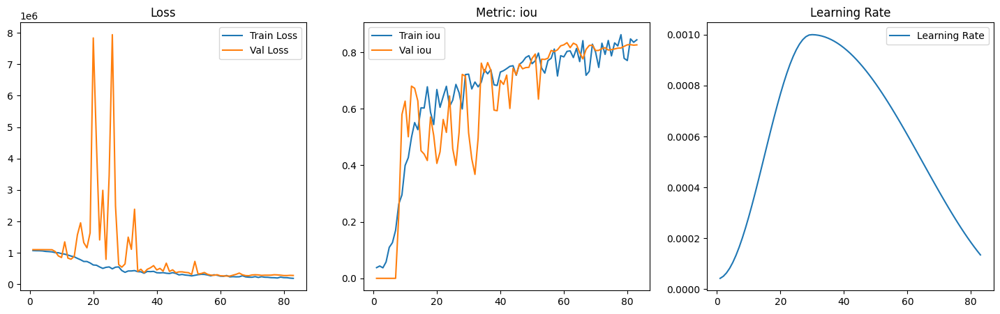

In [219]:
plot_history(history)

## Инференс [1 балл]

После обучения модели напишите фукнцию теста, воспользуйтесь лучшим чекпоинтом и протестируйте работу модели на тестовой выборке.

In [220]:
def test(
    model_class,
    checkpoint_path,
    test_loader,
    loss_fn,
    device="cuda" if torch.cuda.is_available() else "cpu",
):
    # Восстанавливаем модель
    model = model_class()
    model.load_state_dict(torch.load(checkpoint_path, map_location=device))
    model = model.to(device)
    model.eval()

    test_loss = 0.0

    all_preds = []
    all_targets = []

    with torch.no_grad():
        test_bar = tqdm(test_loader, desc=f"Testing", leave=False)
        for inputs, targets in test_bar:
            inputs = inputs.to(device)
            targets = targets.to(device)

            outputs = model(inputs)

            loss = loss_fn(outputs, targets.float())
            preds = torch.sigmoid(outputs) > 0.5  # бинаризация

            test_loss += loss.item()

            all_preds.append(preds.cpu())
            all_targets.append(targets.cpu())

    avg_test_loss = test_loss / len(test_loader)
    print(f"Test Loss: {avg_test_loss:.4f}")

    # Объединяем все предсказания и таргеты
    all_preds = torch.cat(all_preds)
    all_targets = torch.cat(all_targets)

    return all_preds, all_targets

In [221]:
preds, targets = test(
    model_class=lambda: SegNet(in_channels=3, out_channels=1),
    checkpoint_path="best_segnet.pth",
    test_loader=test_dataloader,
    loss_fn=bce_loss
)

Test Loss: 231491.0781


In [222]:
iou_score(preds.to(device), targets.to(device))

tensor(0.8283, device='cuda:0')

In [223]:
import matplotlib.pyplot as plt
import torch

def show_predictions(model_class, checkpoint_path, dataloader, device, num_batches=1, max_items=None):
    # Восстанавливаем модель
    model = model_class()
    model.load_state_dict(torch.load(checkpoint_path, map_location=device))
    model = model.to(device)
    model.eval()
    shown_items = 0  # сколько уже показали

    with torch.no_grad():
        for batch_idx, (images, masks) in enumerate(dataloader):
            images = images.to(device)
            masks = masks.to(device)

            preds = model(images)
            preds = torch.sigmoid(preds)
            preds = (preds > 0.5).float()

            images = images.cpu()
            masks = masks.cpu()
            preds = preds.cpu()

            batch_size = images.size(0)
            for i in range(batch_size):
                if max_items is not None and shown_items >= max_items:
                    model.train()
                    return  # Выход из функции, если показали достаточно

                image = images[i].permute(1, 2, 0).numpy()
                mask = masks[i].squeeze().numpy()
                pred = preds[i].squeeze().numpy()

                fig, axs = plt.subplots(1, 3, figsize=(12, 4))

                axs[0].imshow(image)
                axs[0].set_title("Image")
                axs[0].axis('off')

                axs[1].imshow(mask, cmap='gray')
                axs[1].set_title("Ground Truth")
                axs[1].axis('off')

                axs[2].imshow(pred, cmap='gray')
                axs[2].set_title("Prediction")
                axs[2].axis('off')

                plt.show()

                shown_items += 1

            if batch_idx + 1 >= num_batches:
                break

    model.train()


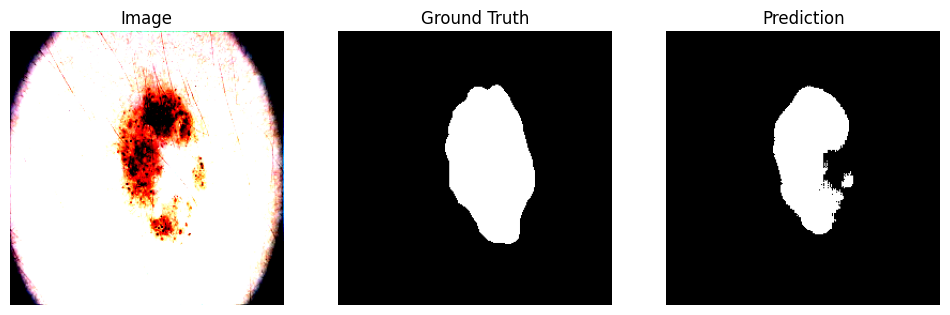

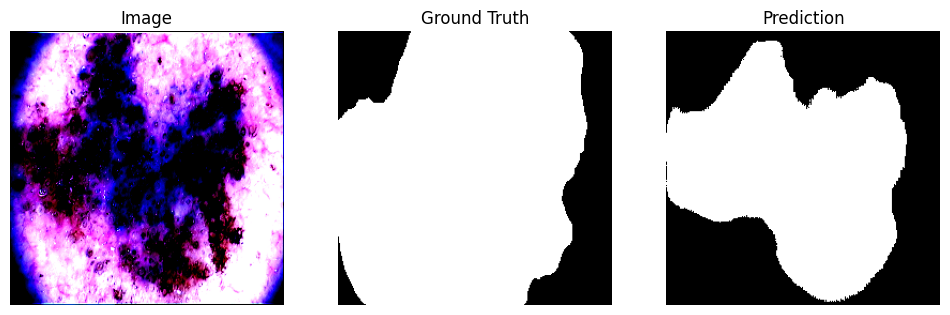

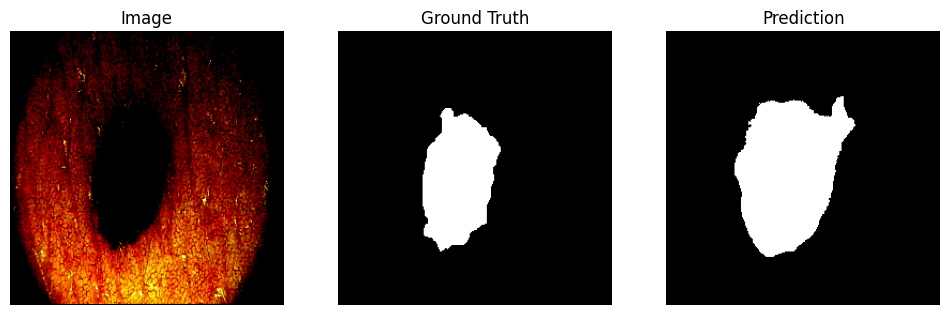

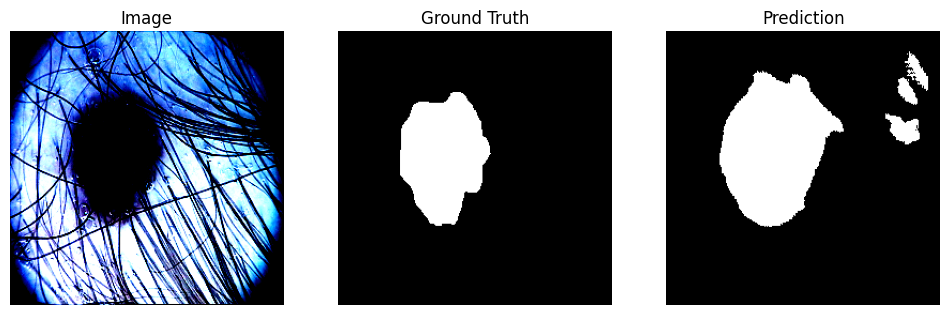

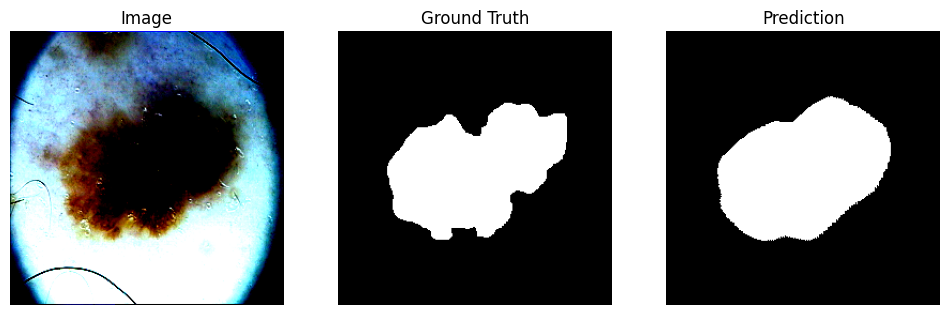

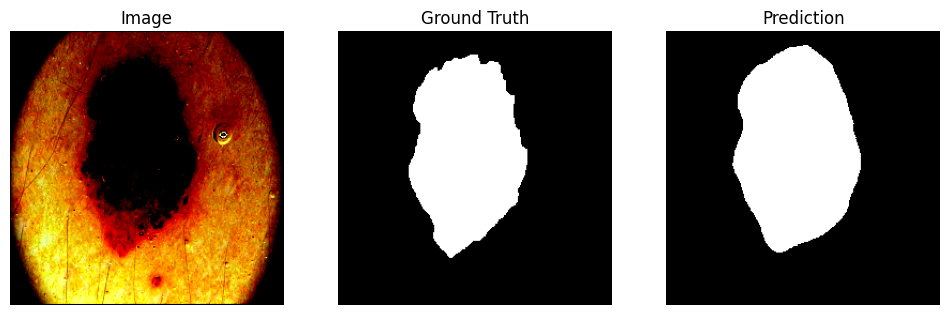

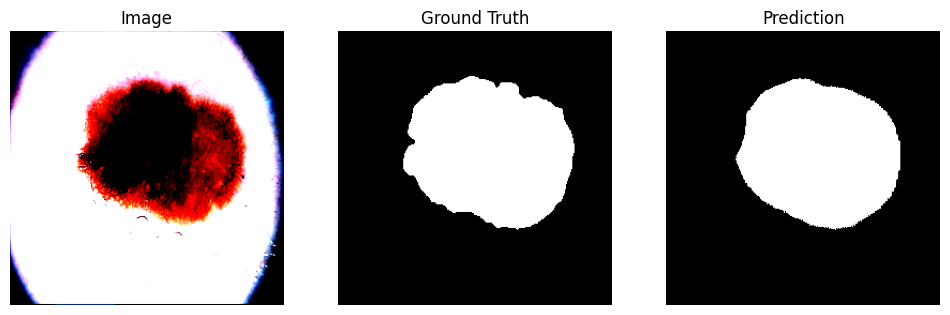

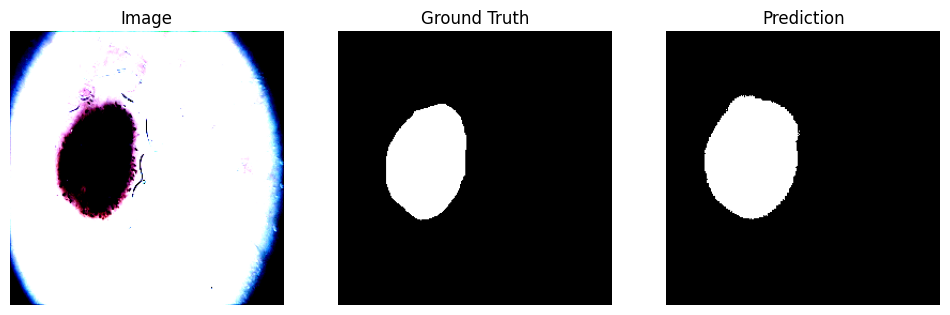

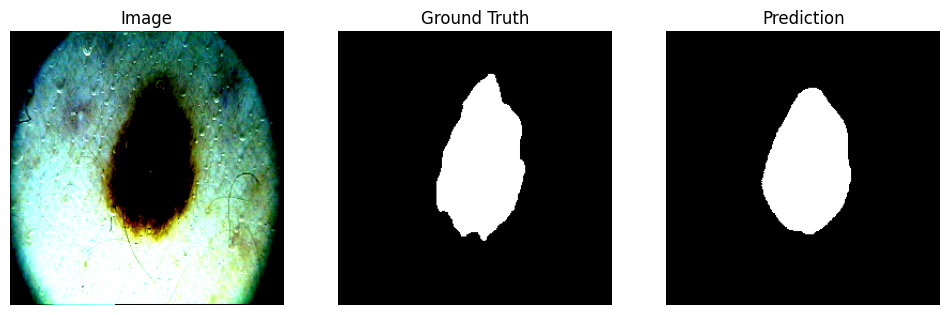

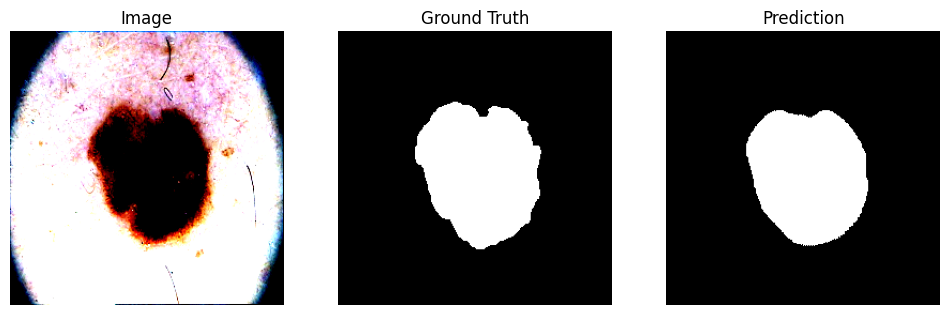

In [224]:
show_predictions(
    model_class=lambda: SegNet(in_channels=3, out_channels=1),
    checkpoint_path="best_segnet.pth",
    dataloader=test_dataloader,
    device='cuda',
    num_batches=2,
    max_items=10
    )

# Мир других лоссов!

## Дополнительные функции потерь [2 балла]

В данном разделе вам потребуется имплементировать две функции потерь: DICE и Focal loss.


### Dice Loss

**1. Dice coefficient:** Учитывая две маски $X$ и $Y$, общая метрика для измерения расстояния между этими двумя масками задается следующим образом:

$$D(X,Y)=\frac{2|X\cap Y|}{|X|+|Y|}$$

В терминах матрицы ошибок она будет считаться следующим образом:

$$D(X,Y) = \frac{2TP}{2TP + FP + FN}$$

Эта функция не является дифференцируемой, но это необходимое свойство для градиентного спуска. В данном случае мы можем приблизить его с помощью:

$$\mathcal L_D(X,Y) = 1- D(X, Y)$$

**Hints** (!):

1. Не забудьте подумать о численной нестабильности, возникающей в математической формуле при ситуации, когда $\frac{0}{0}$, т.е. вам нужно добавить очень маленькое число, например $\epsilon = 1e^{-8}$, в обе части дроби при подсчете $D(X,Y)$:

$$D(X,Y) = \frac{2TP + ϵ}{2TP + FP + FN + ϵ}$$

2. Dice метрика(!), не лосс, считается похожим образом как IoU:

    2.1. На вход вам приходят logits, т.е. значения от $-∞$ до $∞$. Их переводим в вероятности от 0 до 1 при помощи функции Sigmoid.

    2.2. Фиксируем порог, например threshold=0.5, и всему что ниже порога ставим значение 0, всему что выше 1. Получаем предсказанную маску из 0 и 1.

    2.3. Считаем TP, FP, FN

    2.4. Считаем DICE метрику по формуле

Вы можете прописать для себя функцию `dice_score()` и сравнить с результатами работы функции из библиотеки `torchmetrics`.

3. Но с метрикой есть проблема, что она не дифференцируема, и если вы захотите просто взять и прописать `dice_loss` = 1 - `dice_score`, Pytorch поругается на вас и скажет, что это недифференцируемая метрика. Чтобы посчитать dice_loss делаем следующие шаги:

    3.1. На вход вам приходят logits, т.е. значения от $-∞$ до $∞$. Их переводим в вероятности от 0 до 1 при помощи функции Sigmoid.

    3.2. Здесь нам уже не нужно фиксировать порог, мы просто работаем с вероятностями. Значения вероятностей дифференцируемы и через них будут протекать градиенты.

    3.3. Считаем TP, FP, FN также как и в Dice метрике, только вместо маски, подаем вероятности.

    3.4. Считаем DICE метрику по формуле

    3.5. Считаем лосс как Loss = 1 - DICE

Итак, давайте сначала пропишем dice_score.

In [225]:
def dice_score(logits: torch.Tensor, labels: torch.Tensor) -> float:
    logits = logits.float()
    labels = labels.int()

    probs = torch.sigmoid(logits)

    eps = 1e-8
    intersection = (probs * labels).sum()
    union = probs.sum() + labels.sum()

    dice = (2 * intersection + eps) / (union + eps)

    return dice


Проверим на корректность функцию dice_score:

In [66]:
from torchmetrics.segmentation import DiceScore

dice = DiceScore(num_classes=1, average='micro').to(device)
dice(dummpy_sample['logits'].sigmoid(), dummpy_sample['labels'].to(int))

tensor(0.4244, device='cuda:0')

In [76]:
'''
если вы используете версию библиотеки 0.11.4, то можно взять torchmetrics.classification.Dice():

from torchmetrics.classification import Dice

dice = Dice(average='micro').to(device)

'''

"\nесли вы используете версию библиотеки 0.11.4, то можно взять torchmetrics.classification.Dice():\n\nfrom torchmetrics.classification import Dice\n\ndice = Dice(average='micro').to(device)\n\n"

In [68]:
assert dice(dummpy_sample['logits'].sigmoid(), dummpy_sample['labels'].to(int)) == dice_score(dummpy_sample['logits'], dummpy_sample['labels'])
print('success')

success


Давайте теперь пропишем лосс и воспользуемся библиотекой `segmentation-models-pytorch`, чтобы убедиться в корректности нашей функции.

In [69]:
def dice_loss(y_pred, y_true, smooth=1e-8):
    pred = y_pred.sigmoid()
    intersection = (2 * y_true * pred).sum()
    union = (y_true + pred).sum()
    dice = 1 - (intersection + smooth) / (union + smooth)
    return dice.mean()

Проверка на корректность:

In [70]:
# проверьте, что у вас установлена библиотека
!pip install segmentation-models-pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 7.2 MB/s eta 0:00:00


In [71]:
from segmentation_models_pytorch.losses import DiceLoss
dice_loss_torch = DiceLoss(mode='binary')
dice_loss_torch(dummpy_sample['logits'], dummpy_sample['labels'])

tensor(0.5756, device='cuda:0')

In [72]:
assert dice_loss_torch(dummpy_sample['logits'], dummpy_sample['labels'].to(int)) == dice_loss(dummpy_sample['logits'], dummpy_sample['labels'])
print('success')

success


In [226]:
import torch
import gc

del segnet_model
gc.collect()

torch.cuda.empty_cache()

In [227]:
segnet_model = SegNet().to(device)
segnet_model, history = train(
    segnet_model, train_dataloader, valid_dataloader, dice_loss,
    metrics={'iou': iou_score, 'dice': dice_score},
    num_epochs=100, lr=1e-3,
    scheduler_type='onecycle',
    patience=20,
    checkpoint_path="best_segnet.pth"
)

Epoch 1/100 | Train Loss: 0.6137 | Val Loss: 0.5792 | iou: train 0.2635, val 0.0000 | dice: train 0.3863, val 0.4208 | LR: 4.27e-05
  ↳ Saving best model (val loss inf → 0.5792)


Epoch 2/100 | Train Loss: 0.6426 | Val Loss: 0.5795 | iou: train 0.3653, val 0.0000 | dice: train 0.3574, val 0.4205 | LR: 5.07e-05


Epoch 3/100 | Train Loss: 0.5715 | Val Loss: 0.5800 | iou: train 0.4565, val 0.0000 | dice: train 0.4285, val 0.4200 | LR: 6.39e-05


Epoch 4/100 | Train Loss: 0.5864 | Val Loss: 0.5808 | iou: train 0.5908, val 0.0000 | dice: train 0.4136, val 0.4192 | LR: 8.22e-05


Epoch 5/100 | Train Loss: 0.5792 | Val Loss: 0.5823 | iou: train 0.6144, val 0.0000 | dice: train 0.4208, val 0.4177 | LR: 1.05e-04


Epoch 6/100 | Train Loss: 0.5754 | Val Loss: 0.5852 | iou: train 0.5583, val 0.0000 | dice: train 0.4246, val 0.4148 | LR: 1.33e-04


Epoch 7/100 | Train Loss: 0.5443 | Val Loss: 0.5883 | iou: train 0.5791, val 0.0001 | dice: train 0.4557, val 0.4117 | LR: 1.65e-04


Epoch 8/100 | Train Loss: 0.5176 | Val Loss: 0.5927 | iou: train 0.6387, val 0.0003 | dice: train 0.4824, val 0.4073 | LR: 2.01e-04


Epoch 9/100 | Train Loss: 0.5263 | Val Loss: 0.5029 | iou: train 0.5884, val 0.3995 | dice: train 0.4737, val 0.4971 | LR: 2.41e-04
  ↳ Saving best model (val loss 0.5792 → 0.5029)


Epoch 10/100 | Train Loss: 0.5021 | Val Loss: 0.4281 | iou: train 0.6010, val 0.5518 | dice: train 0.4979, val 0.5719 | LR: 2.84e-04
  ↳ Saving best model (val loss 0.5029 → 0.4281)


Epoch 11/100 | Train Loss: 0.4898 | Val Loss: 0.3648 | iou: train 0.6188, val 0.5479 | dice: train 0.5102, val 0.6352 | LR: 3.29e-04
  ↳ Saving best model (val loss 0.4281 → 0.3648)


Epoch 12/100 | Train Loss: 0.4561 | Val Loss: 0.3959 | iou: train 0.6723, val 0.4452 | dice: train 0.5439, val 0.6041 | LR: 3.77e-04


Epoch 13/100 | Train Loss: 0.4589 | Val Loss: 0.3364 | iou: train 0.6723, val 0.6519 | dice: train 0.5411, val 0.6636 | LR: 4.26e-04
  ↳ Saving best model (val loss 0.3648 → 0.3364)


Epoch 14/100 | Train Loss: 0.4630 | Val Loss: 0.4136 | iou: train 0.6295, val 0.4534 | dice: train 0.5370, val 0.5864 | LR: 4.76e-04


Epoch 15/100 | Train Loss: 0.4058 | Val Loss: 0.3594 | iou: train 0.6453, val 0.5434 | dice: train 0.5942, val 0.6406 | LR: 5.26e-04


Epoch 16/100 | Train Loss: 0.4465 | Val Loss: 0.3667 | iou: train 0.5666, val 0.5090 | dice: train 0.5535, val 0.6333 | LR: 5.77e-04


Epoch 17/100 | Train Loss: 0.3589 | Val Loss: 0.3189 | iou: train 0.6924, val 0.6431 | dice: train 0.6411, val 0.6811 | LR: 6.27e-04
  ↳ Saving best model (val loss 0.3364 → 0.3189)


Epoch 18/100 | Train Loss: 0.3319 | Val Loss: 0.2410 | iou: train 0.7111, val 0.7273 | dice: train 0.6681, val 0.7590 | LR: 6.76e-04
  ↳ Saving best model (val loss 0.3189 → 0.2410)


Epoch 19/100 | Train Loss: 0.3738 | Val Loss: 0.3457 | iou: train 0.5986, val 0.5237 | dice: train 0.6262, val 0.6543 | LR: 7.23e-04


Epoch 20/100 | Train Loss: 0.3794 | Val Loss: 0.4091 | iou: train 0.6113, val 0.4357 | dice: train 0.6206, val 0.5909 | LR: 7.67e-04


Epoch 21/100 | Train Loss: 0.3176 | Val Loss: 0.3441 | iou: train 0.6575, val 0.5231 | dice: train 0.6824, val 0.6559 | LR: 8.09e-04


Epoch 22/100 | Train Loss: 0.3693 | Val Loss: 0.3890 | iou: train 0.5271, val 0.4625 | dice: train 0.6307, val 0.6110 | LR: 8.48e-04


Epoch 23/100 | Train Loss: 0.3405 | Val Loss: 0.3333 | iou: train 0.5419, val 0.6770 | dice: train 0.6595, val 0.6667 | LR: 8.83e-04


Epoch 24/100 | Train Loss: 0.3369 | Val Loss: 0.4217 | iou: train 0.5550, val 0.4265 | dice: train 0.6631, val 0.5783 | LR: 9.14e-04


Epoch 25/100 | Train Loss: 0.2442 | Val Loss: 0.4275 | iou: train 0.6857, val 0.4209 | dice: train 0.7558, val 0.5725 | LR: 9.41e-04


Epoch 26/100 | Train Loss: 0.2596 | Val Loss: 0.3321 | iou: train 0.6307, val 0.5342 | dice: train 0.7404, val 0.6679 | LR: 9.63e-04


Epoch 27/100 | Train Loss: 0.2211 | Val Loss: 0.3283 | iou: train 0.6909, val 0.5341 | dice: train 0.7789, val 0.6717 | LR: 9.80e-04


Epoch 28/100 | Train Loss: 0.2825 | Val Loss: 0.2852 | iou: train 0.5974, val 0.6250 | dice: train 0.7175, val 0.7148 | LR: 9.92e-04


Epoch 29/100 | Train Loss: 0.2324 | Val Loss: 0.3144 | iou: train 0.6571, val 0.5471 | dice: train 0.7676, val 0.6856 | LR: 9.98e-04


Epoch 30/100 | Train Loss: 0.2648 | Val Loss: 0.2078 | iou: train 0.6234, val 0.7094 | dice: train 0.7352, val 0.7922 | LR: 1.00e-03
  ↳ Saving best model (val loss 0.2410 → 0.2078)


Epoch 31/100 | Train Loss: 0.2000 | Val Loss: 0.1769 | iou: train 0.6937, val 0.7450 | dice: train 0.8000, val 0.8231 | LR: 9.99e-04
  ↳ Saving best model (val loss 0.2078 → 0.1769)


Epoch 32/100 | Train Loss: 0.1534 | Val Loss: 0.1546 | iou: train 0.7581, val 0.7814 | dice: train 0.8466, val 0.8454 | LR: 9.97e-04
  ↳ Saving best model (val loss 0.1769 → 0.1546)


Epoch 33/100 | Train Loss: 0.2081 | Val Loss: 0.1457 | iou: train 0.6774, val 0.7879 | dice: train 0.7919, val 0.8543 | LR: 9.95e-04
  ↳ Saving best model (val loss 0.1546 → 0.1457)


Epoch 34/100 | Train Loss: 0.2088 | Val Loss: 0.1584 | iou: train 0.6756, val 0.7615 | dice: train 0.7912, val 0.8416 | LR: 9.91e-04


Epoch 35/100 | Train Loss: 0.1777 | Val Loss: 0.2855 | iou: train 0.7147, val 0.5632 | dice: train 0.8223, val 0.7145 | LR: 9.86e-04


Epoch 36/100 | Train Loss: 0.2133 | Val Loss: 0.3370 | iou: train 0.6685, val 0.5016 | dice: train 0.7867, val 0.6630 | LR: 9.80e-04


Epoch 37/100 | Train Loss: 0.1622 | Val Loss: 0.2435 | iou: train 0.7345, val 0.6116 | dice: train 0.8378, val 0.7565 | LR: 9.74e-04


Epoch 38/100 | Train Loss: 0.1665 | Val Loss: 0.1579 | iou: train 0.7268, val 0.7404 | dice: train 0.8335, val 0.8421 | LR: 9.66e-04


Epoch 39/100 | Train Loss: 0.1700 | Val Loss: 0.1519 | iou: train 0.7220, val 0.7551 | dice: train 0.8300, val 0.8481 | LR: 9.58e-04


Epoch 40/100 | Train Loss: 0.1366 | Val Loss: 0.1306 | iou: train 0.7742, val 0.7827 | dice: train 0.8634, val 0.8694 | LR: 9.48e-04
  ↳ Saving best model (val loss 0.1457 → 0.1306)


Epoch 41/100 | Train Loss: 0.1545 | Val Loss: 0.1377 | iou: train 0.7462, val 0.7708 | dice: train 0.8455, val 0.8623 | LR: 9.38e-04


Epoch 42/100 | Train Loss: 0.1575 | Val Loss: 0.1293 | iou: train 0.7366, val 0.7836 | dice: train 0.8425, val 0.8707 | LR: 9.26e-04
  ↳ Saving best model (val loss 0.1306 → 0.1293)


Epoch 43/100 | Train Loss: 0.1654 | Val Loss: 0.1535 | iou: train 0.7263, val 0.7416 | dice: train 0.8346, val 0.8465 | LR: 9.14e-04


Epoch 44/100 | Train Loss: 0.1324 | Val Loss: 0.1432 | iou: train 0.7799, val 0.7591 | dice: train 0.8676, val 0.8568 | LR: 9.01e-04


Epoch 45/100 | Train Loss: 0.1634 | Val Loss: 0.1496 | iou: train 0.7297, val 0.7472 | dice: train 0.8366, val 0.8504 | LR: 8.87e-04


Epoch 46/100 | Train Loss: 0.1797 | Val Loss: 0.1829 | iou: train 0.7017, val 0.6981 | dice: train 0.8203, val 0.8171 | LR: 8.73e-04


Epoch 47/100 | Train Loss: 0.1848 | Val Loss: 0.1848 | iou: train 0.6945, val 0.6933 | dice: train 0.8152, val 0.8152 | LR: 8.57e-04


Epoch 48/100 | Train Loss: 0.1758 | Val Loss: 0.1625 | iou: train 0.7098, val 0.7265 | dice: train 0.8242, val 0.8375 | LR: 8.41e-04


Epoch 49/100 | Train Loss: 0.1562 | Val Loss: 0.1785 | iou: train 0.7371, val 0.7025 | dice: train 0.8438, val 0.8215 | LR: 8.25e-04


Epoch 50/100 | Train Loss: 0.1949 | Val Loss: 0.1690 | iou: train 0.6919, val 0.7170 | dice: train 0.8051, val 0.8310 | LR: 8.07e-04


Epoch 51/100 | Train Loss: 0.1177 | Val Loss: 0.1631 | iou: train 0.7980, val 0.7264 | dice: train 0.8823, val 0.8369 | LR: 7.89e-04


Epoch 52/100 | Train Loss: 0.1475 | Val Loss: 0.1456 | iou: train 0.7505, val 0.7515 | dice: train 0.8525, val 0.8544 | LR: 7.71e-04


Epoch 53/100 | Train Loss: 0.1649 | Val Loss: 0.1184 | iou: train 0.7247, val 0.7948 | dice: train 0.8351, val 0.8816 | LR: 7.52e-04
  ↳ Saving best model (val loss 0.1293 → 0.1184)


Epoch 54/100 | Train Loss: 0.1393 | Val Loss: 0.1271 | iou: train 0.7636, val 0.7831 | dice: train 0.8607, val 0.8729 | LR: 7.32e-04


Epoch 55/100 | Train Loss: 0.1351 | Val Loss: 0.1413 | iou: train 0.7689, val 0.7590 | dice: train 0.8649, val 0.8587 | LR: 7.12e-04


Epoch 56/100 | Train Loss: 0.1201 | Val Loss: 0.1645 | iou: train 0.7927, val 0.7222 | dice: train 0.8799, val 0.8355 | LR: 6.91e-04


Epoch 57/100 | Train Loss: 0.1258 | Val Loss: 0.1541 | iou: train 0.7847, val 0.7384 | dice: train 0.8742, val 0.8459 | LR: 6.70e-04


Epoch 58/100 | Train Loss: 0.1274 | Val Loss: 0.1535 | iou: train 0.7791, val 0.7399 | dice: train 0.8726, val 0.8465 | LR: 6.49e-04


Epoch 59/100 | Train Loss: 0.1530 | Val Loss: 0.1270 | iou: train 0.7401, val 0.7794 | dice: train 0.8470, val 0.8730 | LR: 6.28e-04


Epoch 60/100 | Train Loss: 0.1953 | Val Loss: 0.1855 | iou: train 0.6925, val 0.6898 | dice: train 0.8047, val 0.8145 | LR: 6.06e-04


Epoch 61/100 | Train Loss: 0.1665 | Val Loss: 0.1665 | iou: train 0.7258, val 0.7219 | dice: train 0.8335, val 0.8335 | LR: 5.84e-04


Epoch 62/100 | Train Loss: 0.1560 | Val Loss: 0.2049 | iou: train 0.7404, val 0.6614 | dice: train 0.8440, val 0.7951 | LR: 5.62e-04


Epoch 63/100 | Train Loss: 0.2086 | Val Loss: 0.1604 | iou: train 0.6660, val 0.7245 | dice: train 0.7914, val 0.8396 | LR: 5.39e-04


Epoch 64/100 | Train Loss: 0.1388 | Val Loss: 0.1464 | iou: train 0.7641, val 0.7462 | dice: train 0.8612, val 0.8536 | LR: 5.17e-04


Epoch 65/100 | Train Loss: 0.2015 | Val Loss: 0.1268 | iou: train 0.6790, val 0.7778 | dice: train 0.7985, val 0.8732 | LR: 4.94e-04


Epoch 66/100 | Train Loss: 0.1268 | Val Loss: 0.1334 | iou: train 0.7800, val 0.7678 | dice: train 0.8732, val 0.8666 | LR: 4.72e-04


Epoch 67/100 | Train Loss: 0.1424 | Val Loss: 0.1382 | iou: train 0.7567, val 0.7610 | dice: train 0.8576, val 0.8618 | LR: 4.50e-04


Epoch 68/100 | Train Loss: 0.1163 | Val Loss: 0.1434 | iou: train 0.7966, val 0.7532 | dice: train 0.8837, val 0.8566 | LR: 4.27e-04


Epoch 69/100 | Train Loss: 0.1641 | Val Loss: 0.1437 | iou: train 0.7242, val 0.7531 | dice: train 0.8359, val 0.8563 | LR: 4.05e-04


Epoch 70/100 | Train Loss: 0.1110 | Val Loss: 0.1348 | iou: train 0.8052, val 0.7673 | dice: train 0.8890, val 0.8652 | LR: 3.83e-04


Epoch 71/100 | Train Loss: 0.1655 | Val Loss: 0.1218 | iou: train 0.7280, val 0.7874 | dice: train 0.8345, val 0.8782 | LR: 3.62e-04


Epoch 72/100 | Train Loss: 0.1657 | Val Loss: 0.1200 | iou: train 0.7271, val 0.7900 | dice: train 0.8343, val 0.8800 | LR: 3.40e-04


Epoch 73/100 | Train Loss: 0.1069 | Val Loss: 0.1312 | iou: train 0.8127, val 0.7723 | dice: train 0.8931, val 0.8688 | LR: 3.19e-04
  ↳ Early stopping triggered at epoch 73


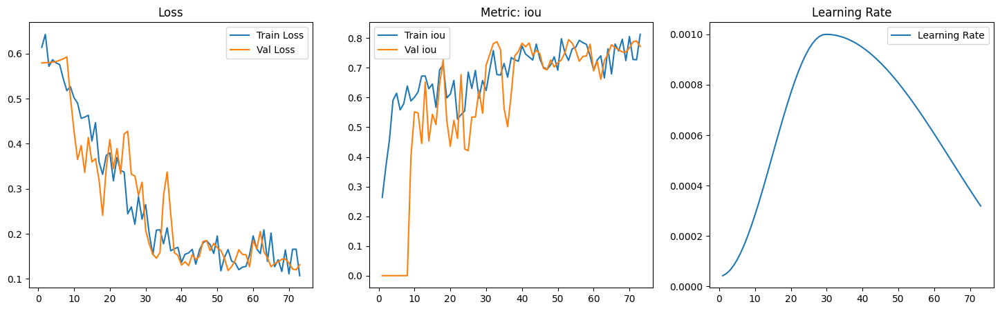

In [228]:
plot_history(history)

In [229]:
preds, targets = test(
    model_class=lambda: SegNet(in_channels=3, out_channels=1),
    checkpoint_path="best_segnet.pth",
    test_loader=test_dataloader,
    loss_fn=dice_loss
)

Test Loss: 0.1081


In [230]:
iou_score(preds.to(device), targets.to(device))

tensor(0.8112, device='cuda:0')

In [231]:
dice_score(preds.to(device), targets.to(device))

tensor(0.4821, device='cuda:0')

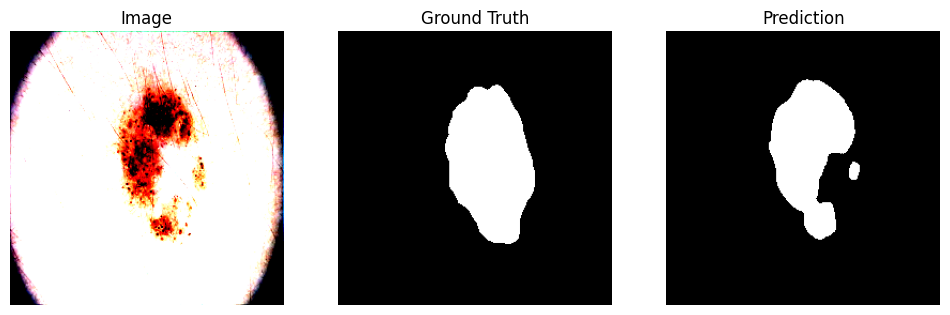

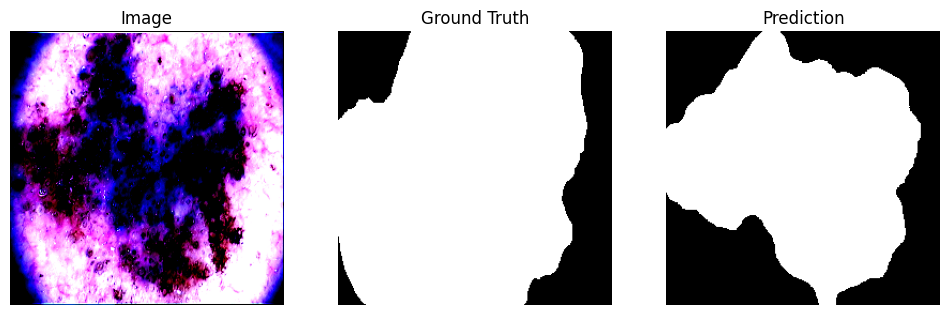

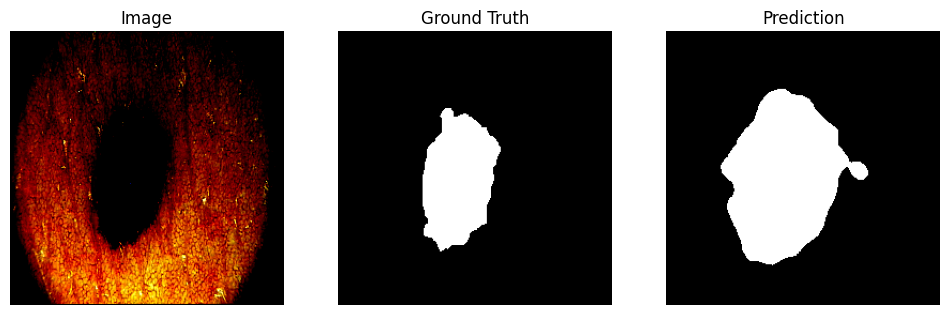

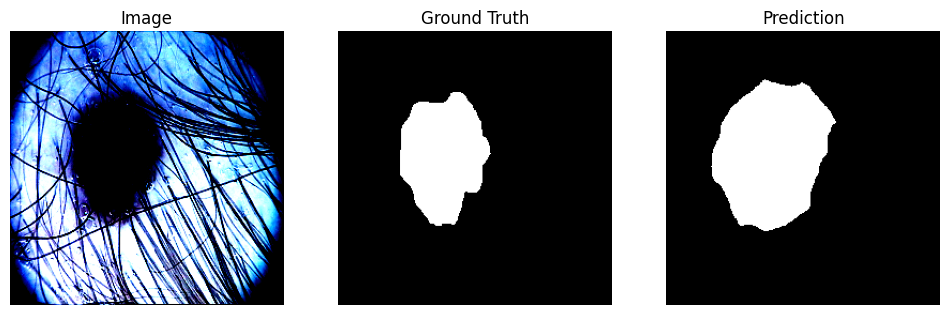

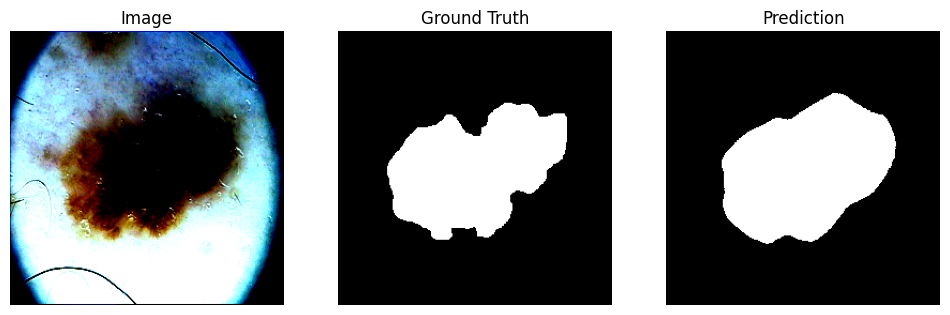

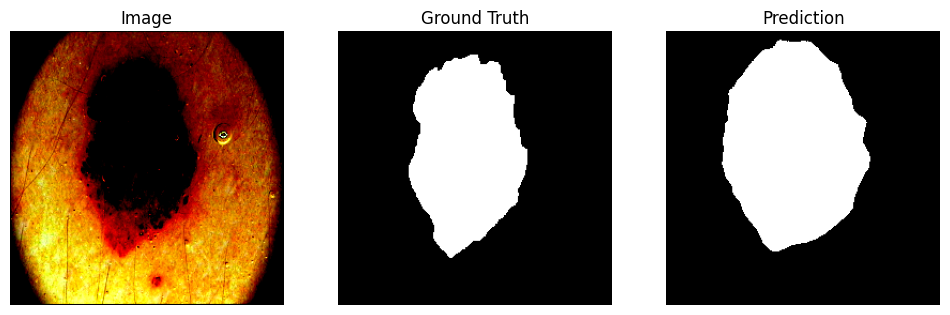

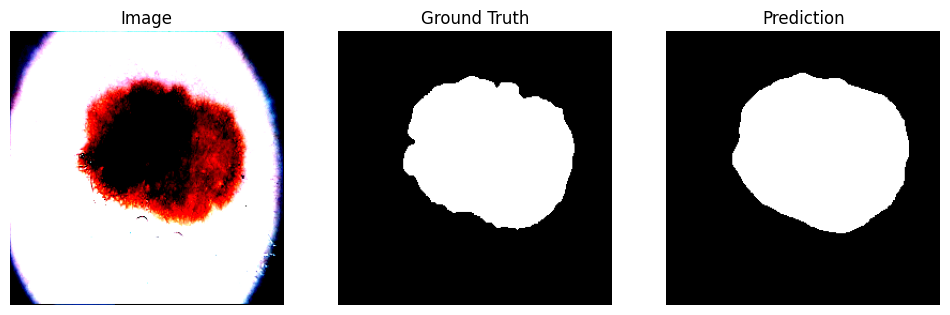

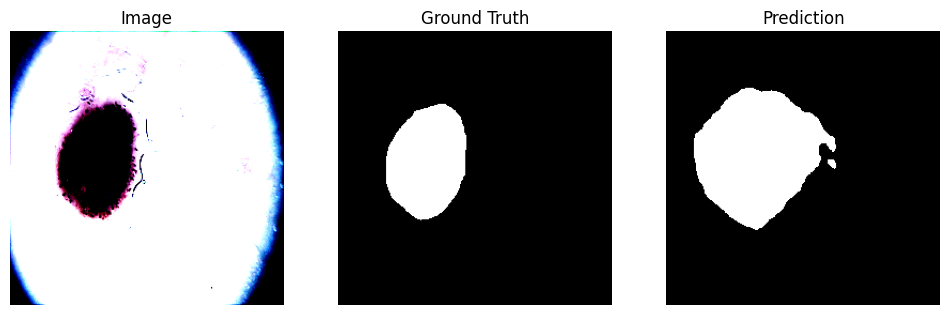

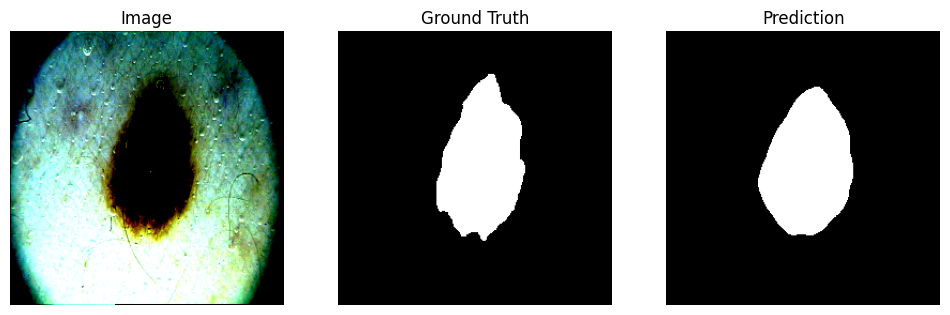

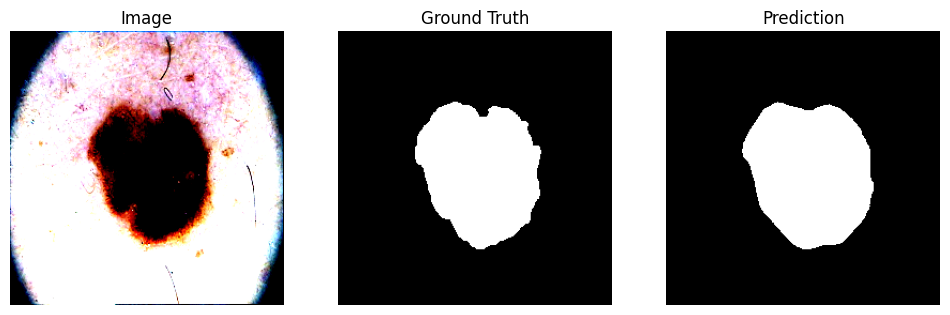

In [232]:
show_predictions(
    model_class=lambda: SegNet(in_channels=3, out_channels=1),
    checkpoint_path="best_segnet.pth",
    dataloader=test_dataloader,
    device='cuda',
    num_batches=2,
    max_items=10
    )

### Focal Loss

[**2. Focal loss:**](https://arxiv.org/pdf/1708.02002.pdf)

Окей, мы уже с вами умеем делать BCE loss:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Проблема с этой потерей заключается в том, что она имеет тенденцию приносить пользу классу **большинства** (фоновому) по отношению к классу **меньшинства** ( переднему). Поэтому обычно применяются весовые коэффициенты к каждому классу:

$$\mathcal L_{wBCE}(y, \hat y) = -\sum_i \alpha_i\left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Традиционно вес $\alpha_i$ определяется как обратная частота класса этого пикселя $i$, так что наблюдения миноритарного класса весят больше по отношению к классу большинства.


Из оригинальной статьи по [Focal Loss](https://arxiv.org/pdf/1708.02002.pdf):

$$p_t = \sigma(\hat y_i)y_i + (1 - \sigma(\hat y_i)) (1-y_i)$$

$$\mathcal L_{focal}(y, \hat y) = (1 - p_t)^{\gamma} \mathcal L_{BCE}(y_i, \hat y_i).$$

$$\mathcal L_{focal}(y, \hat y) = -\sum_i (1 - p_t)^{\gamma} \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

$$\mathcal L_{focal}(y, \hat y) = -\sum_i (1 - (\sigma(\hat y_i)y_i + (1 - \sigma(\hat y_i)) (1-y_i)))^{\gamma} \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

In [197]:
import torch
import torch.nn.functional as F

def focal_loss(y_pred, y_real, gamma=2.0, alpha=-1, reduction='mean', eps=1e-8):
    y_real = y_real.float()
    y_pred = y_pred.float()

    probs = torch.sigmoid(y_pred)

    p_t = probs * y_real + (1 - probs) * (1 - y_real)

    if alpha >= 0:
        alpha_t = alpha * y_real + (1 - alpha) * (1 - y_real)
        loss = - alpha_t * (1 - p_t) ** gamma * torch.log(p_t + eps)
    else:
        loss = - (1 - p_t) ** gamma * torch.log(p_t + eps)

    if reduction == 'mean':
        return loss.mean()
    elif reduction == 'sum':
        return loss.sum()
    elif reduction == 'none':
        return loss
    else:
        raise ValueError(f"Unknown reduction: {reduction}")


Проверка корректности функции:

In [84]:
from torchvision.ops import sigmoid_focal_loss

loss1 = sigmoid_focal_loss(dummpy_sample['logits'], dummpy_sample['labels'], alpha=-1, gamma=2, reduction='sum')
loss2 = focal_loss(dummpy_sample['logits'], dummpy_sample['labels'], gamma=2.0, alpha=-1, reduction='sum')

assert torch.allclose(loss1, loss2, atol=1e-5), f"{loss1.item()} != {loss2.item()}"
print("success")

success


In [233]:
import torch
import gc

del segnet_model
gc.collect()

torch.cuda.empty_cache()

In [240]:
segnet_model = SegNet().to(device)
segnet_model, history = train(
    segnet_model, train_dataloader, valid_dataloader, focal_loss,
    metrics={'iou': iou_score, 'dice': dice_score},
    num_epochs=100, lr=1e-3,
    scheduler_type='onecycle',
    patience=20,
    checkpoint_path="best_segnet.pth"
)

Epoch 1/100 | Train Loss: 0.1641 | Val Loss: 0.1682 | iou: train 0.0712, val 0.0000 | dice: train 0.3488, val 0.4167 | LR: 4.27e-05
  ↳ Saving best model (val loss inf → 0.1682)


Epoch 2/100 | Train Loss: 0.1662 | Val Loss: 0.1678 | iou: train 0.1091, val 0.0000 | dice: train 0.3817, val 0.4156 | LR: 5.07e-05
  ↳ Saving best model (val loss 0.1682 → 0.1678)


Epoch 3/100 | Train Loss: 0.1614 | Val Loss: 0.1675 | iou: train 0.0997, val 0.0004 | dice: train 0.3511, val 0.4143 | LR: 6.39e-05
  ↳ Saving best model (val loss 0.1678 → 0.1675)


Epoch 4/100 | Train Loss: 0.1611 | Val Loss: 0.1673 | iou: train 0.1009, val 0.0020 | dice: train 0.3678, val 0.4131 | LR: 8.22e-05
  ↳ Saving best model (val loss 0.1675 → 0.1673)


Epoch 5/100 | Train Loss: 0.1588 | Val Loss: 0.1670 | iou: train 0.1056, val 0.0049 | dice: train 0.3795, val 0.4127 | LR: 1.05e-04
  ↳ Saving best model (val loss 0.1673 → 0.1670)


Epoch 6/100 | Train Loss: 0.1543 | Val Loss: 0.1615 | iou: train 0.1587, val 0.0286 | dice: train 0.3910, val 0.4188 | LR: 1.33e-04
  ↳ Saving best model (val loss 0.1670 → 0.1615)


Epoch 7/100 | Train Loss: 0.1426 | Val Loss: 0.1478 | iou: train 0.2474, val 0.4124 | dice: train 0.3828, val 0.4373 | LR: 1.65e-04
  ↳ Saving best model (val loss 0.1615 → 0.1478)


Epoch 8/100 | Train Loss: 0.1347 | Val Loss: 0.1288 | iou: train 0.3668, val 0.5878 | dice: train 0.4041, val 0.4700 | LR: 2.01e-04
  ↳ Saving best model (val loss 0.1478 → 0.1288)


Epoch 9/100 | Train Loss: 0.1328 | Val Loss: 0.1043 | iou: train 0.4272, val 0.6332 | dice: train 0.4206, val 0.5609 | LR: 2.41e-04
  ↳ Saving best model (val loss 0.1288 → 0.1043)


Epoch 10/100 | Train Loss: 0.1229 | Val Loss: 0.1566 | iou: train 0.4951, val 0.5497 | dice: train 0.4062, val 0.5770 | LR: 2.84e-04


Epoch 11/100 | Train Loss: 0.1115 | Val Loss: 0.1436 | iou: train 0.5998, val 0.6135 | dice: train 0.4318, val 0.6176 | LR: 3.29e-04


Epoch 12/100 | Train Loss: 0.1117 | Val Loss: 0.1086 | iou: train 0.5915, val 0.6568 | dice: train 0.4327, val 0.6256 | LR: 3.77e-04


Epoch 13/100 | Train Loss: 0.1069 | Val Loss: 0.1416 | iou: train 0.5775, val 0.5733 | dice: train 0.4392, val 0.5425 | LR: 4.26e-04


Epoch 14/100 | Train Loss: 0.1087 | Val Loss: 0.4289 | iou: train 0.5118, val 0.5914 | dice: train 0.4345, val 0.7004 | LR: 4.76e-04


Epoch 15/100 | Train Loss: 0.1050 | Val Loss: 1.5408 | iou: train 0.5315, val 0.3978 | dice: train 0.4625, val 0.5850 | LR: 5.26e-04


Epoch 16/100 | Train Loss: 0.1095 | Val Loss: 0.5806 | iou: train 0.5176, val 0.4055 | dice: train 0.4401, val 0.5698 | LR: 5.77e-04


Epoch 17/100 | Train Loss: 0.0981 | Val Loss: 1.7725 | iou: train 0.5823, val 0.0022 | dice: train 0.4759, val 0.0999 | LR: 6.27e-04


Epoch 18/100 | Train Loss: 0.1074 | Val Loss: 0.6902 | iou: train 0.5193, val 0.3988 | dice: train 0.4850, val 0.4797 | LR: 6.76e-04


Epoch 19/100 | Train Loss: 0.1269 | Val Loss: 0.1194 | iou: train 0.3968, val 0.2813 | dice: train 0.4359, val 0.5178 | LR: 7.23e-04


Epoch 20/100 | Train Loss: 0.0962 | Val Loss: 0.0895 | iou: train 0.5192, val 0.6704 | dice: train 0.4824, val 0.5961 | LR: 7.67e-04
  ↳ Saving best model (val loss 0.1043 → 0.0895)


Epoch 21/100 | Train Loss: 0.0946 | Val Loss: 0.1429 | iou: train 0.5647, val 0.6490 | dice: train 0.4810, val 0.6575 | LR: 8.09e-04


Epoch 22/100 | Train Loss: 0.0862 | Val Loss: 0.2572 | iou: train 0.6391, val 0.6207 | dice: train 0.5073, val 0.6530 | LR: 8.48e-04


Epoch 23/100 | Train Loss: 0.0810 | Val Loss: 0.1715 | iou: train 0.6488, val 0.6064 | dice: train 0.5032, val 0.6243 | LR: 8.83e-04


Epoch 24/100 | Train Loss: 0.1070 | Val Loss: 0.1013 | iou: train 0.5038, val 0.5746 | dice: train 0.4948, val 0.5944 | LR: 9.14e-04


Epoch 25/100 | Train Loss: 0.1084 | Val Loss: 0.1813 | iou: train 0.4981, val 0.6000 | dice: train 0.4619, val 0.6673 | LR: 9.41e-04


Epoch 26/100 | Train Loss: 0.1112 | Val Loss: 0.1005 | iou: train 0.4971, val 0.6448 | dice: train 0.4679, val 0.6619 | LR: 9.63e-04


Epoch 27/100 | Train Loss: 0.1100 | Val Loss: 0.1099 | iou: train 0.4982, val 0.6180 | dice: train 0.4605, val 0.6063 | LR: 9.80e-04


Epoch 28/100 | Train Loss: 0.1042 | Val Loss: 0.1229 | iou: train 0.4244, val 0.5154 | dice: train 0.4164, val 0.4629 | LR: 9.92e-04


Epoch 29/100 | Train Loss: 0.0938 | Val Loss: 0.0935 | iou: train 0.5976, val 0.6627 | dice: train 0.4848, val 0.5264 | LR: 9.98e-04


Epoch 30/100 | Train Loss: 0.0844 | Val Loss: 0.0849 | iou: train 0.6277, val 0.6978 | dice: train 0.4847, val 0.5836 | LR: 1.00e-03
  ↳ Saving best model (val loss 0.0895 → 0.0849)


Epoch 31/100 | Train Loss: 0.0928 | Val Loss: 0.1023 | iou: train 0.5535, val 0.6139 | dice: train 0.5094, val 0.5896 | LR: 9.99e-04


Epoch 32/100 | Train Loss: 0.1052 | Val Loss: 0.0880 | iou: train 0.5478, val 0.6466 | dice: train 0.5136, val 0.5901 | LR: 9.97e-04


Epoch 33/100 | Train Loss: 0.0860 | Val Loss: 0.1012 | iou: train 0.6401, val 0.6262 | dice: train 0.5154, val 0.5263 | LR: 9.95e-04


Epoch 34/100 | Train Loss: 0.0817 | Val Loss: 0.0909 | iou: train 0.6723, val 0.6800 | dice: train 0.5156, val 0.5780 | LR: 9.91e-04


Epoch 35/100 | Train Loss: 0.0840 | Val Loss: 0.0934 | iou: train 0.6612, val 0.6921 | dice: train 0.5279, val 0.6321 | LR: 9.86e-04


Epoch 36/100 | Train Loss: 0.0746 | Val Loss: 0.0946 | iou: train 0.6742, val 0.6832 | dice: train 0.5252, val 0.6259 | LR: 9.80e-04


Epoch 37/100 | Train Loss: 0.0960 | Val Loss: 0.0851 | iou: train 0.5920, val 0.7140 | dice: train 0.5348, val 0.6210 | LR: 9.74e-04


Epoch 38/100 | Train Loss: 0.0699 | Val Loss: 0.0752 | iou: train 0.7051, val 0.7493 | dice: train 0.5448, val 0.6278 | LR: 9.66e-04
  ↳ Saving best model (val loss 0.0849 → 0.0752)


Epoch 39/100 | Train Loss: 0.0826 | Val Loss: 0.0784 | iou: train 0.6711, val 0.7194 | dice: train 0.5623, val 0.6175 | LR: 9.58e-04


Epoch 40/100 | Train Loss: 0.0769 | Val Loss: 0.0744 | iou: train 0.6391, val 0.7327 | dice: train 0.5212, val 0.6233 | LR: 9.48e-04
  ↳ Saving best model (val loss 0.0752 → 0.0744)


Epoch 41/100 | Train Loss: 0.0691 | Val Loss: 0.0941 | iou: train 0.6825, val 0.6785 | dice: train 0.5377, val 0.6410 | LR: 9.38e-04


Epoch 42/100 | Train Loss: 0.0623 | Val Loss: 0.0797 | iou: train 0.7165, val 0.7279 | dice: train 0.5561, val 0.6495 | LR: 9.26e-04


Epoch 43/100 | Train Loss: 0.0769 | Val Loss: 0.0842 | iou: train 0.6856, val 0.7194 | dice: train 0.5781, val 0.6338 | LR: 9.14e-04


Epoch 44/100 | Train Loss: 0.0785 | Val Loss: 0.0748 | iou: train 0.6653, val 0.7329 | dice: train 0.5691, val 0.6058 | LR: 9.01e-04


Epoch 45/100 | Train Loss: 0.0978 | Val Loss: 0.0847 | iou: train 0.5955, val 0.6671 | dice: train 0.5343, val 0.5600 | LR: 8.87e-04


Epoch 46/100 | Train Loss: 0.0781 | Val Loss: 0.0817 | iou: train 0.6061, val 0.6956 | dice: train 0.4903, val 0.5917 | LR: 8.73e-04


Epoch 47/100 | Train Loss: 0.0713 | Val Loss: 0.0780 | iou: train 0.6901, val 0.7075 | dice: train 0.5371, val 0.6332 | LR: 8.57e-04


Epoch 48/100 | Train Loss: 0.0629 | Val Loss: 0.0761 | iou: train 0.7172, val 0.7227 | dice: train 0.5716, val 0.6477 | LR: 8.41e-04


Epoch 49/100 | Train Loss: 0.0837 | Val Loss: 0.0747 | iou: train 0.6793, val 0.7280 | dice: train 0.5883, val 0.6512 | LR: 8.25e-04


Epoch 50/100 | Train Loss: 0.0602 | Val Loss: 0.0917 | iou: train 0.7420, val 0.6744 | dice: train 0.5828, val 0.6305 | LR: 8.07e-04


Epoch 51/100 | Train Loss: 0.0682 | Val Loss: 0.1000 | iou: train 0.7024, val 0.6540 | dice: train 0.5830, val 0.6096 | LR: 7.89e-04


Epoch 52/100 | Train Loss: 0.0620 | Val Loss: 0.0857 | iou: train 0.7145, val 0.6786 | dice: train 0.5808, val 0.5826 | LR: 7.71e-04


Epoch 53/100 | Train Loss: 0.0698 | Val Loss: 0.0827 | iou: train 0.7044, val 0.6858 | dice: train 0.5972, val 0.5773 | LR: 7.52e-04


Epoch 54/100 | Train Loss: 0.0786 | Val Loss: 0.0830 | iou: train 0.6167, val 0.6991 | dice: train 0.5293, val 0.6262 | LR: 7.32e-04


Epoch 55/100 | Train Loss: 0.0634 | Val Loss: 0.0842 | iou: train 0.7059, val 0.6939 | dice: train 0.5302, val 0.6460 | LR: 7.12e-04


Epoch 56/100 | Train Loss: 0.1030 | Val Loss: 0.0742 | iou: train 0.6115, val 0.7167 | dice: train 0.5544, val 0.6495 | LR: 6.91e-04
  ↳ Saving best model (val loss 0.0744 → 0.0742)


Epoch 57/100 | Train Loss: 0.0608 | Val Loss: 0.0771 | iou: train 0.7265, val 0.7094 | dice: train 0.5822, val 0.6212 | LR: 6.70e-04


Epoch 58/100 | Train Loss: 0.0785 | Val Loss: 0.0768 | iou: train 0.6643, val 0.7133 | dice: train 0.5723, val 0.6266 | LR: 6.49e-04


Epoch 59/100 | Train Loss: 0.0614 | Val Loss: 0.0753 | iou: train 0.7339, val 0.7141 | dice: train 0.5623, val 0.6349 | LR: 6.28e-04


Epoch 60/100 | Train Loss: 0.0638 | Val Loss: 0.0704 | iou: train 0.7125, val 0.7258 | dice: train 0.5779, val 0.6386 | LR: 6.06e-04
  ↳ Saving best model (val loss 0.0742 → 0.0704)


Epoch 61/100 | Train Loss: 0.0604 | Val Loss: 0.0700 | iou: train 0.7387, val 0.7421 | dice: train 0.6099, val 0.6302 | LR: 5.84e-04
  ↳ Saving best model (val loss 0.0704 → 0.0700)


Epoch 62/100 | Train Loss: 0.0578 | Val Loss: 0.0693 | iou: train 0.7198, val 0.7466 | dice: train 0.5862, val 0.6326 | LR: 5.62e-04
  ↳ Saving best model (val loss 0.0700 → 0.0693)


Epoch 63/100 | Train Loss: 0.0525 | Val Loss: 0.0685 | iou: train 0.7674, val 0.7359 | dice: train 0.6078, val 0.6441 | LR: 5.39e-04
  ↳ Saving best model (val loss 0.0693 → 0.0685)


Epoch 64/100 | Train Loss: 0.0585 | Val Loss: 0.0744 | iou: train 0.7417, val 0.7068 | dice: train 0.6143, val 0.6376 | LR: 5.17e-04


Epoch 65/100 | Train Loss: 0.0675 | Val Loss: 0.0801 | iou: train 0.7362, val 0.6835 | dice: train 0.6217, val 0.6311 | LR: 4.94e-04


Epoch 66/100 | Train Loss: 0.0860 | Val Loss: 0.0769 | iou: train 0.7282, val 0.7133 | dice: train 0.6228, val 0.6493 | LR: 4.72e-04


Epoch 67/100 | Train Loss: 0.0531 | Val Loss: 0.0703 | iou: train 0.7649, val 0.7352 | dice: train 0.6244, val 0.6538 | LR: 4.50e-04


Epoch 68/100 | Train Loss: 0.0535 | Val Loss: 0.0669 | iou: train 0.7746, val 0.7503 | dice: train 0.6247, val 0.6639 | LR: 4.27e-04
  ↳ Saving best model (val loss 0.0685 → 0.0669)


Epoch 69/100 | Train Loss: 0.0551 | Val Loss: 0.0652 | iou: train 0.7565, val 0.7512 | dice: train 0.6184, val 0.6600 | LR: 4.05e-04
  ↳ Saving best model (val loss 0.0669 → 0.0652)


Epoch 70/100 | Train Loss: 0.0552 | Val Loss: 0.0642 | iou: train 0.7479, val 0.7426 | dice: train 0.6048, val 0.6552 | LR: 3.83e-04
  ↳ Saving best model (val loss 0.0652 → 0.0642)


Epoch 71/100 | Train Loss: 0.0649 | Val Loss: 0.0660 | iou: train 0.6896, val 0.7354 | dice: train 0.5639, val 0.6456 | LR: 3.62e-04


Epoch 72/100 | Train Loss: 0.0471 | Val Loss: 0.0649 | iou: train 0.7907, val 0.7437 | dice: train 0.6134, val 0.6389 | LR: 3.40e-04


Epoch 73/100 | Train Loss: 0.0478 | Val Loss: 0.0673 | iou: train 0.7834, val 0.7394 | dice: train 0.6336, val 0.6352 | LR: 3.19e-04


Epoch 74/100 | Train Loss: 0.0538 | Val Loss: 0.0655 | iou: train 0.7314, val 0.7547 | dice: train 0.6008, val 0.6407 | LR: 2.98e-04


Epoch 75/100 | Train Loss: 0.0458 | Val Loss: 0.0685 | iou: train 0.7953, val 0.7437 | dice: train 0.6316, val 0.6424 | LR: 2.78e-04


Epoch 76/100 | Train Loss: 0.0470 | Val Loss: 0.0719 | iou: train 0.7839, val 0.7304 | dice: train 0.6311, val 0.6458 | LR: 2.58e-04


Epoch 77/100 | Train Loss: 0.0466 | Val Loss: 0.0750 | iou: train 0.7836, val 0.7211 | dice: train 0.6425, val 0.6480 | LR: 2.39e-04


Epoch 78/100 | Train Loss: 0.0470 | Val Loss: 0.0723 | iou: train 0.7799, val 0.7294 | dice: train 0.6241, val 0.6541 | LR: 2.20e-04


Epoch 79/100 | Train Loss: 0.0430 | Val Loss: 0.0710 | iou: train 0.7989, val 0.7332 | dice: train 0.6398, val 0.6556 | LR: 2.02e-04


Epoch 80/100 | Train Loss: 0.0497 | Val Loss: 0.0715 | iou: train 0.7744, val 0.7309 | dice: train 0.6450, val 0.6580 | LR: 1.84e-04


Epoch 81/100 | Train Loss: 0.0435 | Val Loss: 0.0693 | iou: train 0.8078, val 0.7391 | dice: train 0.6530, val 0.6591 | LR: 1.67e-04


Epoch 82/100 | Train Loss: 0.0593 | Val Loss: 0.0706 | iou: train 0.7553, val 0.7358 | dice: train 0.6576, val 0.6575 | LR: 1.50e-04


Epoch 83/100 | Train Loss: 0.0500 | Val Loss: 0.0715 | iou: train 0.7643, val 0.7311 | dice: train 0.6438, val 0.6564 | LR: 1.35e-04


Epoch 84/100 | Train Loss: 0.0558 | Val Loss: 0.0720 | iou: train 0.7689, val 0.7298 | dice: train 0.6534, val 0.6559 | LR: 1.20e-04


Epoch 85/100 | Train Loss: 0.0519 | Val Loss: 0.0667 | iou: train 0.7625, val 0.7518 | dice: train 0.6600, val 0.6676 | LR: 1.06e-04


Epoch 86/100 | Train Loss: 0.0482 | Val Loss: 0.0648 | iou: train 0.7880, val 0.7598 | dice: train 0.6629, val 0.6743 | LR: 9.22e-05


Epoch 87/100 | Train Loss: 0.0531 | Val Loss: 0.0633 | iou: train 0.7487, val 0.7640 | dice: train 0.6408, val 0.6776 | LR: 7.97e-05
  ↳ Saving best model (val loss 0.0642 → 0.0633)


Epoch 88/100 | Train Loss: 0.0420 | Val Loss: 0.0636 | iou: train 0.8051, val 0.7607 | dice: train 0.6602, val 0.6766 | LR: 6.79e-05


Epoch 89/100 | Train Loss: 0.0514 | Val Loss: 0.0620 | iou: train 0.7382, val 0.7622 | dice: train 0.6165, val 0.6797 | LR: 5.71e-05
  ↳ Saving best model (val loss 0.0633 → 0.0620)


Epoch 90/100 | Train Loss: 0.0503 | Val Loss: 0.0626 | iou: train 0.7405, val 0.7572 | dice: train 0.6184, val 0.6805 | LR: 4.71e-05


Epoch 91/100 | Train Loss: 0.0453 | Val Loss: 0.0670 | iou: train 0.7895, val 0.7363 | dice: train 0.6509, val 0.6730 | LR: 3.81e-05


Epoch 92/100 | Train Loss: 0.0457 | Val Loss: 0.0658 | iou: train 0.7763, val 0.7383 | dice: train 0.6242, val 0.6722 | LR: 2.99e-05


Epoch 93/100 | Train Loss: 0.0596 | Val Loss: 0.0652 | iou: train 0.7171, val 0.7407 | dice: train 0.6210, val 0.6748 | LR: 2.28e-05


Epoch 94/100 | Train Loss: 0.0407 | Val Loss: 0.0653 | iou: train 0.8156, val 0.7374 | dice: train 0.6517, val 0.6729 | LR: 1.66e-05


Epoch 95/100 | Train Loss: 0.0442 | Val Loss: 0.0674 | iou: train 0.7944, val 0.7301 | dice: train 0.6559, val 0.6694 | LR: 1.13e-05


Epoch 96/100 | Train Loss: 0.0516 | Val Loss: 0.0673 | iou: train 0.7434, val 0.7297 | dice: train 0.6178, val 0.6693 | LR: 7.07e-06


Epoch 97/100 | Train Loss: 0.0440 | Val Loss: 0.0674 | iou: train 0.7840, val 0.7285 | dice: train 0.6528, val 0.6681 | LR: 3.81e-06


Epoch 98/100 | Train Loss: 0.0457 | Val Loss: 0.0659 | iou: train 0.7776, val 0.7346 | dice: train 0.6238, val 0.6693 | LR: 1.55e-06


Epoch 99/100 | Train Loss: 0.0444 | Val Loss: 0.0657 | iou: train 0.7831, val 0.7334 | dice: train 0.6336, val 0.6665 | LR: 2.87e-07


Epoch 100/100 | Train Loss: 0.0634 | Val Loss: 0.0663 | iou: train 0.7430, val 0.7303 | dice: train 0.6432, val 0.6649 | LR: 3.55e-08


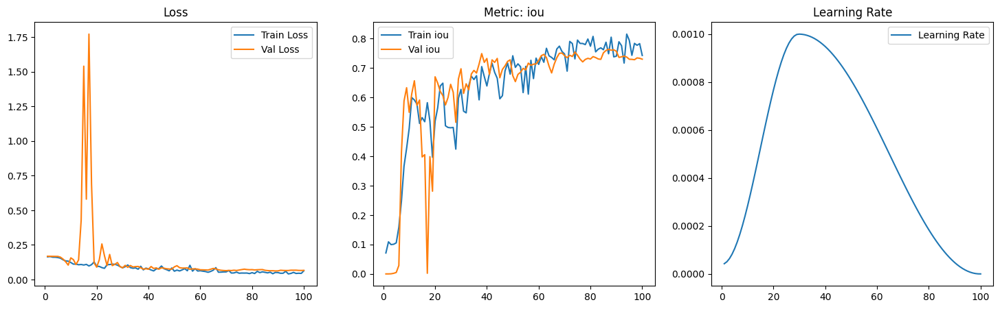

In [241]:
plot_history(history)

In [242]:
preds, targets = test(
    model_class=lambda: SegNet(in_channels=3, out_channels=1),
    checkpoint_path="best_segnet.pth",
    test_loader=test_dataloader,
    loss_fn=focal_loss
)

Test Loss: 0.0435


In [243]:
iou_score(preds.to(device), targets.to(device))

tensor(0.8113, device='cuda:0')

In [244]:
dice_score(preds.to(device), targets.to(device))

tensor(0.4779, device='cuda:0')

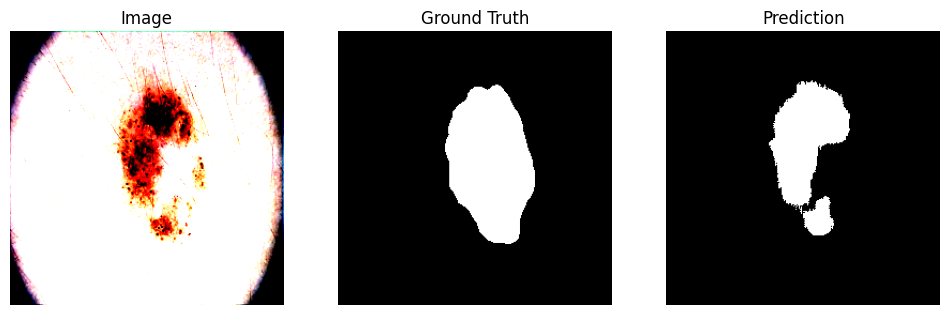

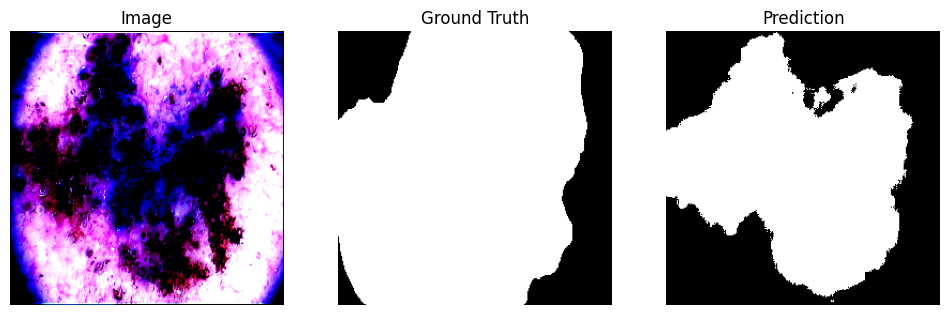

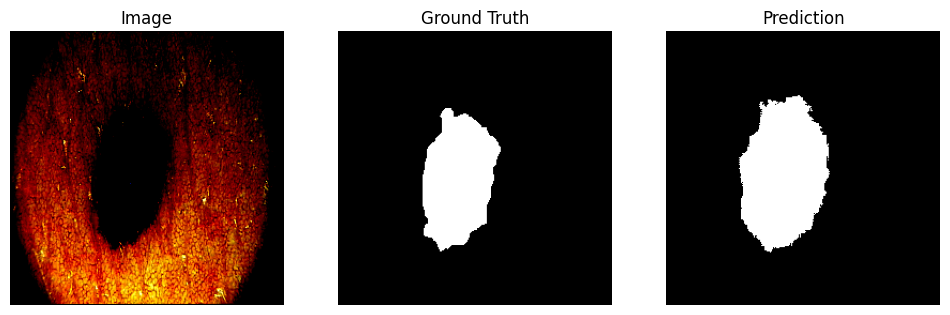

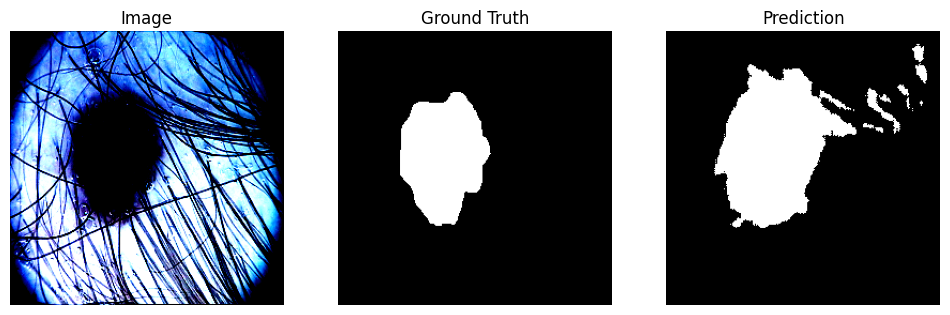

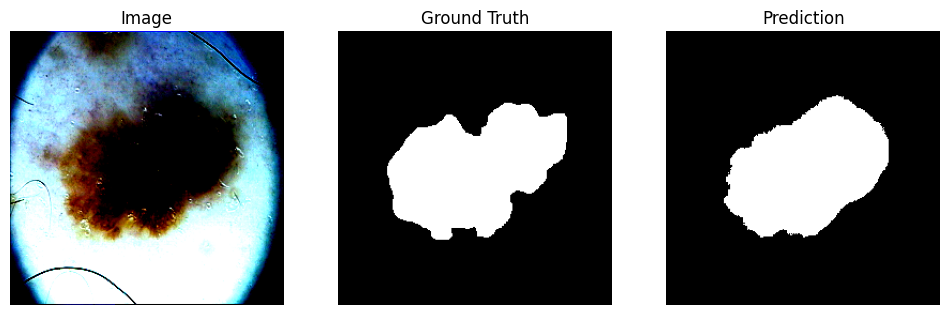

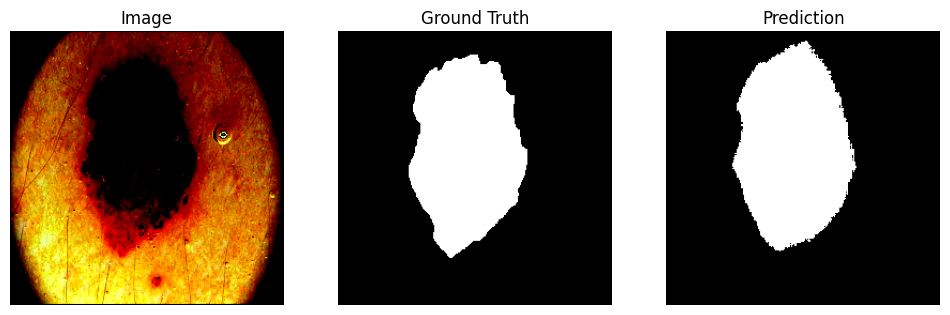

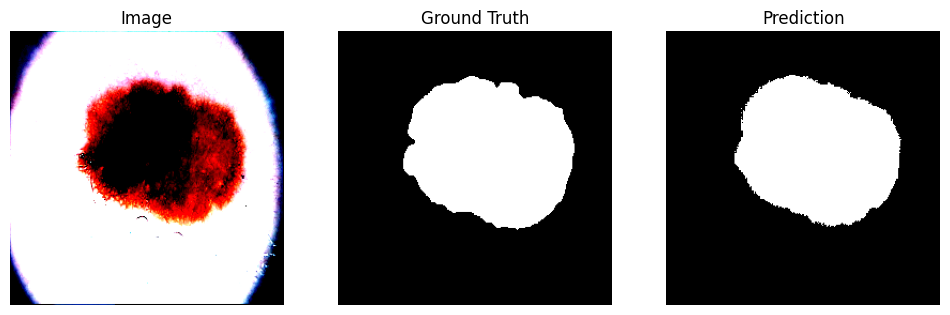

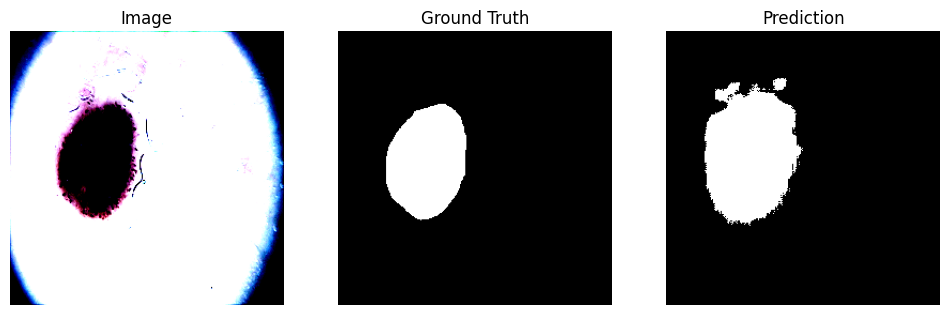

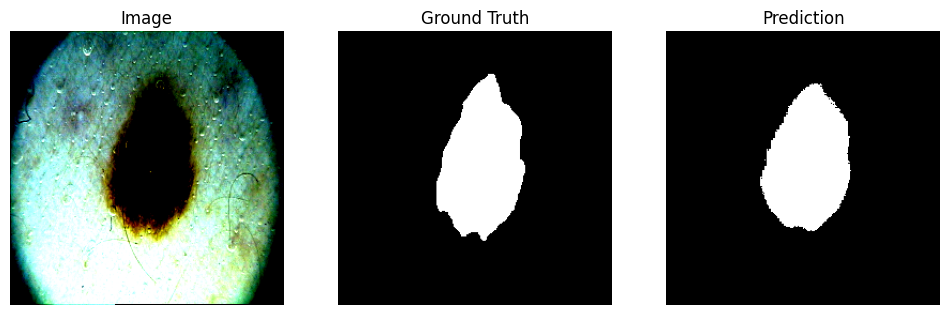

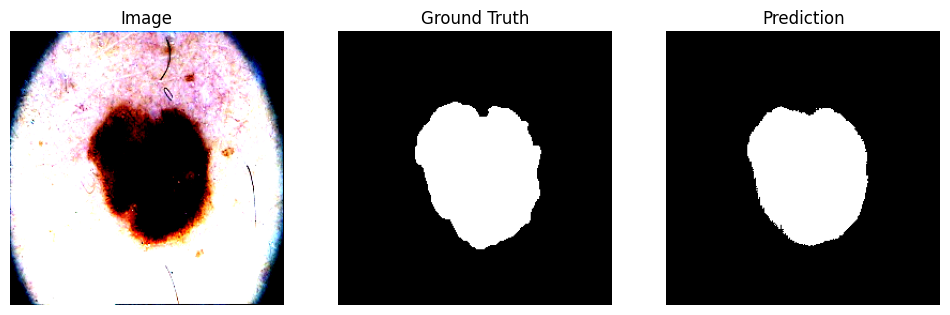

In [245]:
show_predictions(
    model_class=lambda: SegNet(in_channels=3, out_channels=1),
    checkpoint_path="best_segnet.pth",
    dataloader=test_dataloader,
    device='cuda',
    num_batches=2,
    max_items=10,
    )

## [BONUS] Мир сегментационных лоссов [5 баллов]

В данном блоке предлагаем вам написать одну функцию потерь самостоятельно. Для этого необходимо прочитать статью и имплементировать ее, и провести численное сравнение с предыдущими функциями.

* [Physiological Inspired Deep Neural Networks for Emotion Recognition](https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=8472816&tag=1)". IEEE Access, 6, 53930-53943.

* [Boundary loss for highly unbalanced segmentation](https://arxiv.org/abs/1812.07032)

* [Tversky loss function for image segmentation using 3D fully convolutional deep networks](https://arxiv.org/abs/1706.05721)

* [Correlation Maximized Structural Similarity Loss for Semantic Segmentation](https://arxiv.org/abs/1910.08711)

* [Topology-Preserving Deep Image Segmentation](https://papers.nips.cc/paper/8803-topology-preserving-deep-image-segmentation)

In [246]:
def tversky_loss(y_pred, y_real, smooth=1e-10, alpha=0.5, beta=0.5):
    y_pred = torch.sigmoid(y_pred)

    y_pred = y_pred.view(-1).float()
    y_real = y_real.view(-1).float()

    TP = (y_pred * y_real).sum()
    FP = ((1 - y_real) * y_pred).sum()
    FN = (y_real * (1 - y_pred)).sum()

    denominator = TP + alpha * FP + beta * FN + smooth
    tversky_index = (TP + smooth) / denominator

    return 1 - tversky_index

In [247]:
def tversky_focal_loss(y_pred, y_real, smooth=1, alpha=0.5, beta=0.5, gamma=1):
    y_pred = F.sigmoid(y_pred)

    y_pred = y_pred.view(-1)
    y_real = y_real.view(-1)

    TP = torch.sum(y_pred * y_real)
    FP = torch.sum((1-y_real) * y_pred)
    FN = torch.sum(y_real * (1-y_pred))

    tversky = (TP + smooth) / (TP + alpha*FP + beta*FN + smooth)
    focal_tversky = (1 - tversky)**gamma

    return focal_tversky

## Обучите SegNet на новых лоссах

**Задание**: обучите SegNet на новых лоссах и сравните все три лосса:
*   При каком лоссе модель сходится быстрее?
*   При каком лоссе модель выдает наилучшую метрику?

Напишите развернутый ответ на вопросы.



In [248]:
import torch
import gc

del segnet_model
gc.collect()

torch.cuda.empty_cache()

In [249]:
segnet_model = SegNet().to(device)
segnet_model, history = train(
    segnet_model, train_dataloader, valid_dataloader, tversky_loss,
    metrics={'iou': iou_score, 'dice': dice_score},
    num_epochs=100, lr=1e-3,
    scheduler_type='onecycle',
    patience=20,
    checkpoint_path="best_segnet.pth"
)

Epoch 1/100 | Train Loss: 0.6238 | Val Loss: 0.5689 | iou: train 0.2827, val 0.0000 | dice: train 0.3762, val 0.4311 | LR: 4.27e-05
  ↳ Saving best model (val loss inf → 0.5689)


Epoch 2/100 | Train Loss: 0.6254 | Val Loss: 0.5689 | iou: train 0.2783, val 0.0000 | dice: train 0.3746, val 0.4311 | LR: 5.07e-05


Epoch 3/100 | Train Loss: 0.6080 | Val Loss: 0.5690 | iou: train 0.3125, val 0.0000 | dice: train 0.3920, val 0.4310 | LR: 6.39e-05


Epoch 4/100 | Train Loss: 0.5983 | Val Loss: 0.5689 | iou: train 0.3164, val 0.3736 | dice: train 0.4017, val 0.4311 | LR: 8.22e-05


Epoch 5/100 | Train Loss: 0.6093 | Val Loss: 0.5682 | iou: train 0.3060, val 0.3736 | dice: train 0.3907, val 0.4318 | LR: 1.05e-04
  ↳ Saving best model (val loss 0.5689 → 0.5682)


Epoch 6/100 | Train Loss: 0.6133 | Val Loss: 0.5660 | iou: train 0.3101, val 0.3772 | dice: train 0.3867, val 0.4340 | LR: 1.33e-04
  ↳ Saving best model (val loss 0.5682 → 0.5660)


Epoch 7/100 | Train Loss: 0.6021 | Val Loss: 0.5620 | iou: train 0.3312, val 0.3757 | dice: train 0.3979, val 0.4380 | LR: 1.65e-04
  ↳ Saving best model (val loss 0.5660 → 0.5620)


Epoch 8/100 | Train Loss: 0.5999 | Val Loss: 0.5285 | iou: train 0.3593, val 0.3916 | dice: train 0.4001, val 0.4715 | LR: 2.01e-04
  ↳ Saving best model (val loss 0.5620 → 0.5285)


Epoch 9/100 | Train Loss: 0.5931 | Val Loss: 0.4022 | iou: train 0.3504, val 0.4954 | dice: train 0.4069, val 0.5978 | LR: 2.41e-04
  ↳ Saving best model (val loss 0.5285 → 0.4022)


Epoch 10/100 | Train Loss: 0.5767 | Val Loss: 0.3838 | iou: train 0.4140, val 0.5152 | dice: train 0.4233, val 0.6162 | LR: 2.84e-04
  ↳ Saving best model (val loss 0.4022 → 0.3838)


Epoch 11/100 | Train Loss: 0.5431 | Val Loss: 0.3763 | iou: train 0.4876, val 0.5783 | dice: train 0.4569, val 0.6237 | LR: 3.29e-04
  ↳ Saving best model (val loss 0.3838 → 0.3763)


Epoch 12/100 | Train Loss: 0.5542 | Val Loss: 0.3742 | iou: train 0.4979, val 0.6441 | dice: train 0.4458, val 0.6258 | LR: 3.77e-04
  ↳ Saving best model (val loss 0.3763 → 0.3742)


Epoch 13/100 | Train Loss: 0.5617 | Val Loss: 0.3674 | iou: train 0.5169, val 0.5766 | dice: train 0.4383, val 0.6326 | LR: 4.26e-04
  ↳ Saving best model (val loss 0.3742 → 0.3674)


Epoch 14/100 | Train Loss: 0.5334 | Val Loss: 0.3596 | iou: train 0.5419, val 0.5879 | dice: train 0.4666, val 0.6404 | LR: 4.76e-04
  ↳ Saving best model (val loss 0.3674 → 0.3596)


Epoch 15/100 | Train Loss: 0.4974 | Val Loss: 0.3453 | iou: train 0.5223, val 0.5699 | dice: train 0.5026, val 0.6547 | LR: 5.26e-04
  ↳ Saving best model (val loss 0.3596 → 0.3453)


Epoch 16/100 | Train Loss: 0.5035 | Val Loss: 0.3796 | iou: train 0.4607, val 0.3939 | dice: train 0.4965, val 0.6204 | LR: 5.77e-04


Epoch 17/100 | Train Loss: 0.4426 | Val Loss: 0.4621 | iou: train 0.5294, val 0.4477 | dice: train 0.5574, val 0.5379 | LR: 6.27e-04


Epoch 18/100 | Train Loss: 0.4474 | Val Loss: 0.4622 | iou: train 0.4485, val 0.3719 | dice: train 0.5526, val 0.5378 | LR: 6.76e-04


Epoch 19/100 | Train Loss: 0.3881 | Val Loss: 0.5364 | iou: train 0.5496, val 0.3741 | dice: train 0.6119, val 0.4636 | LR: 7.23e-04


Epoch 20/100 | Train Loss: 0.3793 | Val Loss: 0.4579 | iou: train 0.5140, val 0.3742 | dice: train 0.6207, val 0.5421 | LR: 7.67e-04


Epoch 21/100 | Train Loss: 0.3843 | Val Loss: 0.4564 | iou: train 0.4981, val 0.3744 | dice: train 0.6157, val 0.5436 | LR: 8.09e-04


Epoch 22/100 | Train Loss: 0.3274 | Val Loss: 0.7036 | iou: train 0.5695, val 0.1944 | dice: train 0.6726, val 0.2964 | LR: 8.48e-04


Epoch 23/100 | Train Loss: 0.2931 | Val Loss: 0.5065 | iou: train 0.6150, val 0.2789 | dice: train 0.7069, val 0.4935 | LR: 8.83e-04


Epoch 24/100 | Train Loss: 0.2947 | Val Loss: 0.3279 | iou: train 0.6075, val 0.5359 | dice: train 0.7053, val 0.6721 | LR: 9.14e-04
  ↳ Saving best model (val loss 0.3453 → 0.3279)


Epoch 25/100 | Train Loss: 0.2415 | Val Loss: 0.3049 | iou: train 0.6887, val 0.5505 | dice: train 0.7585, val 0.6951 | LR: 9.41e-04
  ↳ Saving best model (val loss 0.3279 → 0.3049)


Epoch 26/100 | Train Loss: 0.2306 | Val Loss: 0.3075 | iou: train 0.6790, val 0.5794 | dice: train 0.7694, val 0.6925 | LR: 9.63e-04


Epoch 27/100 | Train Loss: 0.2343 | Val Loss: 0.2571 | iou: train 0.6733, val 0.6352 | dice: train 0.7657, val 0.7429 | LR: 9.80e-04
  ↳ Saving best model (val loss 0.3049 → 0.2571)


Epoch 28/100 | Train Loss: 0.2434 | Val Loss: 0.2509 | iou: train 0.6488, val 0.6249 | dice: train 0.7566, val 0.7491 | LR: 9.92e-04
  ↳ Saving best model (val loss 0.2571 → 0.2509)


Epoch 29/100 | Train Loss: 0.2101 | Val Loss: 0.2538 | iou: train 0.6891, val 0.6273 | dice: train 0.7899, val 0.7462 | LR: 9.98e-04


Epoch 30/100 | Train Loss: 0.2923 | Val Loss: 0.2485 | iou: train 0.5715, val 0.6598 | dice: train 0.7077, val 0.7515 | LR: 1.00e-03
  ↳ Saving best model (val loss 0.2509 → 0.2485)


Epoch 31/100 | Train Loss: 0.2662 | Val Loss: 0.2812 | iou: train 0.5978, val 0.5982 | dice: train 0.7338, val 0.7188 | LR: 9.99e-04


Epoch 32/100 | Train Loss: 0.2239 | Val Loss: 0.2684 | iou: train 0.6463, val 0.5964 | dice: train 0.7761, val 0.7316 | LR: 9.97e-04


Epoch 33/100 | Train Loss: 0.2210 | Val Loss: 0.1982 | iou: train 0.6513, val 0.6966 | dice: train 0.7790, val 0.8018 | LR: 9.95e-04
  ↳ Saving best model (val loss 0.2485 → 0.1982)


Epoch 34/100 | Train Loss: 0.2457 | Val Loss: 0.2485 | iou: train 0.6176, val 0.6295 | dice: train 0.7543, val 0.7515 | LR: 9.91e-04


Epoch 35/100 | Train Loss: 0.2424 | Val Loss: 0.3391 | iou: train 0.6257, val 0.5270 | dice: train 0.7576, val 0.6609 | LR: 9.86e-04


Epoch 36/100 | Train Loss: 0.2486 | Val Loss: 0.2209 | iou: train 0.6138, val 0.6717 | dice: train 0.7514, val 0.7791 | LR: 9.80e-04


Epoch 37/100 | Train Loss: 0.2158 | Val Loss: 0.2024 | iou: train 0.6544, val 0.6696 | dice: train 0.7842, val 0.7976 | LR: 9.74e-04


Epoch 38/100 | Train Loss: 0.1839 | Val Loss: 0.1867 | iou: train 0.6987, val 0.6945 | dice: train 0.8161, val 0.8133 | LR: 9.66e-04
  ↳ Saving best model (val loss 0.1982 → 0.1867)


Epoch 39/100 | Train Loss: 0.2034 | Val Loss: 0.1632 | iou: train 0.6762, val 0.7314 | dice: train 0.7966, val 0.8368 | LR: 9.58e-04
  ↳ Saving best model (val loss 0.1867 → 0.1632)


Epoch 40/100 | Train Loss: 0.1893 | Val Loss: 0.1802 | iou: train 0.6901, val 0.7204 | dice: train 0.8107, val 0.8198 | LR: 9.48e-04


Epoch 41/100 | Train Loss: 0.1881 | Val Loss: 0.1897 | iou: train 0.6893, val 0.7198 | dice: train 0.8119, val 0.8103 | LR: 9.38e-04


Epoch 42/100 | Train Loss: 0.1832 | Val Loss: 0.1692 | iou: train 0.6964, val 0.7278 | dice: train 0.8168, val 0.8308 | LR: 9.26e-04


Epoch 43/100 | Train Loss: 0.2054 | Val Loss: 0.1859 | iou: train 0.6642, val 0.7013 | dice: train 0.7946, val 0.8141 | LR: 9.14e-04


Epoch 44/100 | Train Loss: 0.2328 | Val Loss: 0.1954 | iou: train 0.6305, val 0.6816 | dice: train 0.7672, val 0.8046 | LR: 9.01e-04


Epoch 45/100 | Train Loss: 0.1673 | Val Loss: 0.2188 | iou: train 0.7221, val 0.6468 | dice: train 0.8327, val 0.7812 | LR: 8.87e-04


Epoch 46/100 | Train Loss: 0.1850 | Val Loss: 0.1790 | iou: train 0.6931, val 0.7019 | dice: train 0.8150, val 0.8210 | LR: 8.73e-04


Epoch 47/100 | Train Loss: 0.1857 | Val Loss: 0.1641 | iou: train 0.6927, val 0.7276 | dice: train 0.8143, val 0.8359 | LR: 8.57e-04


Epoch 48/100 | Train Loss: 0.1587 | Val Loss: 0.1596 | iou: train 0.7310, val 0.7319 | dice: train 0.8413, val 0.8404 | LR: 8.41e-04
  ↳ Saving best model (val loss 0.1632 → 0.1596)


Epoch 49/100 | Train Loss: 0.1829 | Val Loss: 0.1521 | iou: train 0.6954, val 0.7427 | dice: train 0.8171, val 0.8479 | LR: 8.25e-04
  ↳ Saving best model (val loss 0.1596 → 0.1521)


Epoch 50/100 | Train Loss: 0.1863 | Val Loss: 0.1633 | iou: train 0.6909, val 0.7260 | dice: train 0.8137, val 0.8367 | LR: 8.07e-04


Epoch 51/100 | Train Loss: 0.1442 | Val Loss: 0.1603 | iou: train 0.7547, val 0.7276 | dice: train 0.8558, val 0.8397 | LR: 7.89e-04


Epoch 52/100 | Train Loss: 0.1602 | Val Loss: 0.1519 | iou: train 0.7285, val 0.7400 | dice: train 0.8398, val 0.8481 | LR: 7.71e-04
  ↳ Saving best model (val loss 0.1521 → 0.1519)


Epoch 53/100 | Train Loss: 0.1580 | Val Loss: 0.1577 | iou: train 0.7323, val 0.7325 | dice: train 0.8420, val 0.8423 | LR: 7.52e-04


Epoch 54/100 | Train Loss: 0.2250 | Val Loss: 0.1888 | iou: train 0.6421, val 0.6888 | dice: train 0.7750, val 0.8112 | LR: 7.32e-04


Epoch 55/100 | Train Loss: 0.2118 | Val Loss: 0.1599 | iou: train 0.6581, val 0.7275 | dice: train 0.7882, val 0.8401 | LR: 7.12e-04


Epoch 56/100 | Train Loss: 0.1602 | Val Loss: 0.1776 | iou: train 0.7284, val 0.7011 | dice: train 0.8398, val 0.8224 | LR: 6.91e-04


Epoch 57/100 | Train Loss: 0.1516 | Val Loss: 0.1786 | iou: train 0.7430, val 0.7006 | dice: train 0.8484, val 0.8214 | LR: 6.70e-04


Epoch 58/100 | Train Loss: 0.1237 | Val Loss: 0.1667 | iou: train 0.7858, val 0.7188 | dice: train 0.8763, val 0.8333 | LR: 6.49e-04


Epoch 59/100 | Train Loss: 0.1486 | Val Loss: 0.1565 | iou: train 0.7474, val 0.7333 | dice: train 0.8514, val 0.8435 | LR: 6.28e-04


Epoch 60/100 | Train Loss: 0.1634 | Val Loss: 0.1424 | iou: train 0.7232, val 0.7544 | dice: train 0.8366, val 0.8576 | LR: 6.06e-04
  ↳ Saving best model (val loss 0.1519 → 0.1424)


Epoch 61/100 | Train Loss: 0.1566 | Val Loss: 0.1440 | iou: train 0.7335, val 0.7526 | dice: train 0.8434, val 0.8560 | LR: 5.84e-04


Epoch 62/100 | Train Loss: 0.1922 | Val Loss: 0.1450 | iou: train 0.6809, val 0.7511 | dice: train 0.8078, val 0.8550 | LR: 5.62e-04


Epoch 63/100 | Train Loss: 0.1443 | Val Loss: 0.1657 | iou: train 0.7515, val 0.7190 | dice: train 0.8557, val 0.8343 | LR: 5.39e-04


Epoch 64/100 | Train Loss: 0.1568 | Val Loss: 0.1742 | iou: train 0.7329, val 0.7072 | dice: train 0.8432, val 0.8258 | LR: 5.17e-04


Epoch 65/100 | Train Loss: 0.1472 | Val Loss: 0.1644 | iou: train 0.7475, val 0.7261 | dice: train 0.8528, val 0.8356 | LR: 4.94e-04


Epoch 66/100 | Train Loss: 0.1501 | Val Loss: 0.1997 | iou: train 0.7430, val 0.6691 | dice: train 0.8499, val 0.8003 | LR: 4.72e-04


Epoch 67/100 | Train Loss: 0.1861 | Val Loss: 0.1550 | iou: train 0.6929, val 0.7345 | dice: train 0.8139, val 0.8450 | LR: 4.50e-04


Epoch 68/100 | Train Loss: 0.2043 | Val Loss: 0.1517 | iou: train 0.6714, val 0.7402 | dice: train 0.7957, val 0.8483 | LR: 4.27e-04


Epoch 69/100 | Train Loss: 0.1537 | Val Loss: 0.1461 | iou: train 0.7378, val 0.7489 | dice: train 0.8463, val 0.8539 | LR: 4.05e-04


Epoch 70/100 | Train Loss: 0.1407 | Val Loss: 0.1434 | iou: train 0.7568, val 0.7526 | dice: train 0.8593, val 0.8566 | LR: 3.83e-04


Epoch 71/100 | Train Loss: 0.1575 | Val Loss: 0.1387 | iou: train 0.7327, val 0.7598 | dice: train 0.8425, val 0.8613 | LR: 3.62e-04
  ↳ Saving best model (val loss 0.1424 → 0.1387)


Epoch 72/100 | Train Loss: 0.1498 | Val Loss: 0.1470 | iou: train 0.7422, val 0.7464 | dice: train 0.8502, val 0.8530 | LR: 3.40e-04


Epoch 73/100 | Train Loss: 0.1478 | Val Loss: 0.1424 | iou: train 0.7458, val 0.7537 | dice: train 0.8522, val 0.8576 | LR: 3.19e-04


Epoch 74/100 | Train Loss: 0.1133 | Val Loss: 0.1361 | iou: train 0.8001, val 0.7639 | dice: train 0.8867, val 0.8639 | LR: 2.98e-04
  ↳ Saving best model (val loss 0.1387 → 0.1361)


Epoch 75/100 | Train Loss: 0.1206 | Val Loss: 0.1440 | iou: train 0.7879, val 0.7517 | dice: train 0.8794, val 0.8560 | LR: 2.78e-04


Epoch 76/100 | Train Loss: 0.1082 | Val Loss: 0.1548 | iou: train 0.8085, val 0.7354 | dice: train 0.8918, val 0.8452 | LR: 2.58e-04


Epoch 77/100 | Train Loss: 0.1348 | Val Loss: 0.1538 | iou: train 0.7687, val 0.7368 | dice: train 0.8652, val 0.8462 | LR: 2.39e-04


Epoch 78/100 | Train Loss: 0.1218 | Val Loss: 0.1523 | iou: train 0.7861, val 0.7388 | dice: train 0.8782, val 0.8477 | LR: 2.20e-04


Epoch 79/100 | Train Loss: 0.1416 | Val Loss: 0.1432 | iou: train 0.7559, val 0.7529 | dice: train 0.8584, val 0.8568 | LR: 2.02e-04


Epoch 80/100 | Train Loss: 0.1471 | Val Loss: 0.1380 | iou: train 0.7465, val 0.7602 | dice: train 0.8529, val 0.8620 | LR: 1.84e-04


Epoch 81/100 | Train Loss: 0.1308 | Val Loss: 0.1414 | iou: train 0.7717, val 0.7549 | dice: train 0.8692, val 0.8586 | LR: 1.67e-04


Epoch 82/100 | Train Loss: 0.1128 | Val Loss: 0.1454 | iou: train 0.8003, val 0.7483 | dice: train 0.8872, val 0.8546 | LR: 1.50e-04


Epoch 83/100 | Train Loss: 0.1301 | Val Loss: 0.1438 | iou: train 0.7738, val 0.7508 | dice: train 0.8699, val 0.8562 | LR: 1.35e-04


Epoch 84/100 | Train Loss: 0.1133 | Val Loss: 0.1485 | iou: train 0.7999, val 0.7433 | dice: train 0.8867, val 0.8515 | LR: 1.20e-04


Epoch 85/100 | Train Loss: 0.1476 | Val Loss: 0.1516 | iou: train 0.7481, val 0.7385 | dice: train 0.8524, val 0.8484 | LR: 1.06e-04


Epoch 86/100 | Train Loss: 0.1256 | Val Loss: 0.1507 | iou: train 0.7805, val 0.7398 | dice: train 0.8744, val 0.8493 | LR: 9.22e-05


Epoch 87/100 | Train Loss: 0.1259 | Val Loss: 0.1465 | iou: train 0.7804, val 0.7465 | dice: train 0.8741, val 0.8535 | LR: 7.97e-05


Epoch 88/100 | Train Loss: 0.1278 | Val Loss: 0.1384 | iou: train 0.7784, val 0.7593 | dice: train 0.8722, val 0.8616 | LR: 6.79e-05


Epoch 89/100 | Train Loss: 0.0997 | Val Loss: 0.1367 | iou: train 0.8221, val 0.7618 | dice: train 0.9003, val 0.8633 | LR: 5.71e-05


Epoch 90/100 | Train Loss: 0.1255 | Val Loss: 0.1379 | iou: train 0.7812, val 0.7601 | dice: train 0.8745, val 0.8621 | LR: 4.71e-05


Epoch 91/100 | Train Loss: 0.1418 | Val Loss: 0.1328 | iou: train 0.7606, val 0.7684 | dice: train 0.8582, val 0.8672 | LR: 3.81e-05
  ↳ Saving best model (val loss 0.1361 → 0.1328)


Epoch 92/100 | Train Loss: 0.1369 | Val Loss: 0.1407 | iou: train 0.7648, val 0.7557 | dice: train 0.8631, val 0.8593 | LR: 2.99e-05


Epoch 93/100 | Train Loss: 0.1103 | Val Loss: 0.1406 | iou: train 0.8046, val 0.7559 | dice: train 0.8897, val 0.8594 | LR: 2.28e-05


Epoch 94/100 | Train Loss: 0.1272 | Val Loss: 0.1391 | iou: train 0.7775, val 0.7583 | dice: train 0.8728, val 0.8609 | LR: 1.66e-05


Epoch 95/100 | Train Loss: 0.1446 | Val Loss: 0.1395 | iou: train 0.7557, val 0.7577 | dice: train 0.8554, val 0.8605 | LR: 1.13e-05


Epoch 96/100 | Train Loss: 0.1123 | Val Loss: 0.1439 | iou: train 0.8013, val 0.7508 | dice: train 0.8877, val 0.8561 | LR: 7.07e-06


Epoch 97/100 | Train Loss: 0.1265 | Val Loss: 0.1465 | iou: train 0.7791, val 0.7468 | dice: train 0.8735, val 0.8535 | LR: 3.81e-06


Epoch 98/100 | Train Loss: 0.1321 | Val Loss: 0.1411 | iou: train 0.7717, val 0.7551 | dice: train 0.8679, val 0.8589 | LR: 1.55e-06


Epoch 99/100 | Train Loss: 0.1301 | Val Loss: 0.1426 | iou: train 0.7727, val 0.7526 | dice: train 0.8699, val 0.8574 | LR: 2.87e-07


Epoch 100/100 | Train Loss: 0.1362 | Val Loss: 0.1379 | iou: train 0.7653, val 0.7601 | dice: train 0.8638, val 0.8621 | LR: 3.55e-08


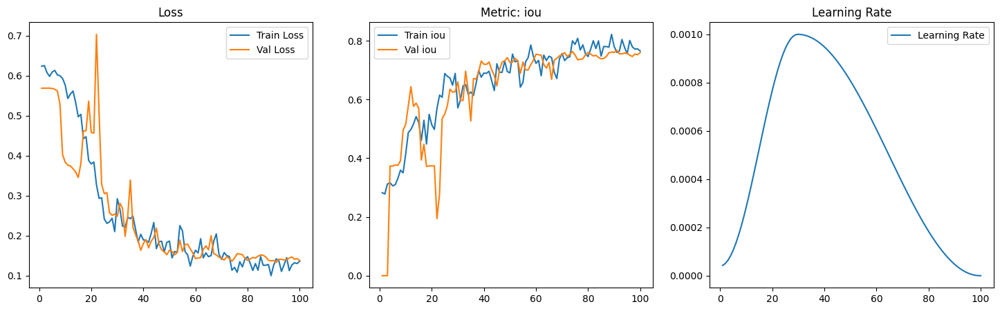

In [250]:
plot_history(history)

In [251]:
preds, targets = test(
    model_class=lambda: SegNet(in_channels=3, out_channels=1),
    checkpoint_path="best_segnet.pth",
    test_loader=test_dataloader,
    loss_fn=tversky_loss
)

Test Loss: 0.1005


In [252]:
iou_score(preds.to(device), targets.to(device))

tensor(0.8198, device='cuda:0')

In [253]:
dice_score(preds.to(device), targets.to(device))

tensor(0.4795, device='cuda:0')

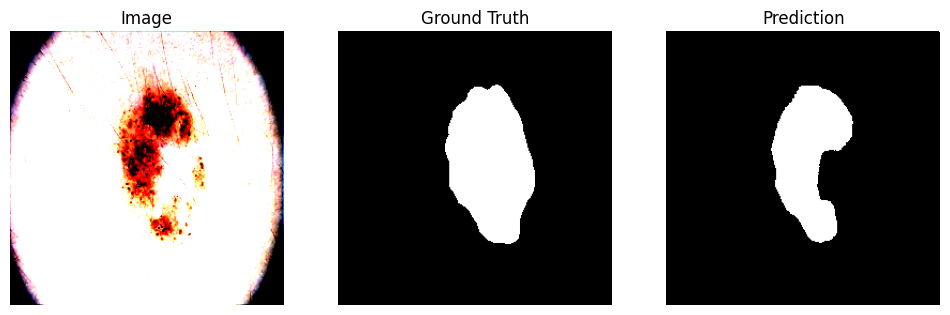

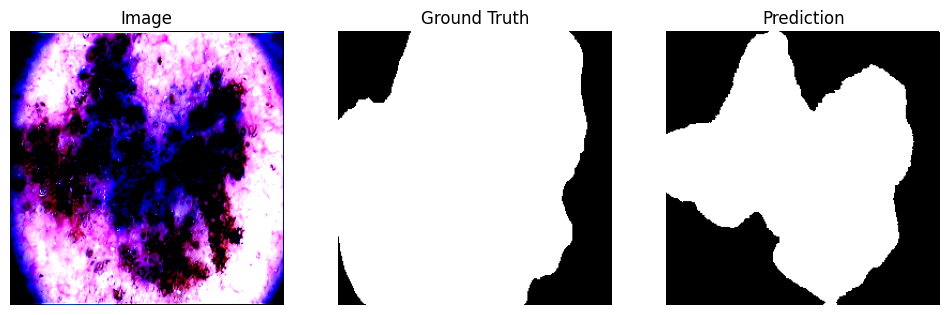

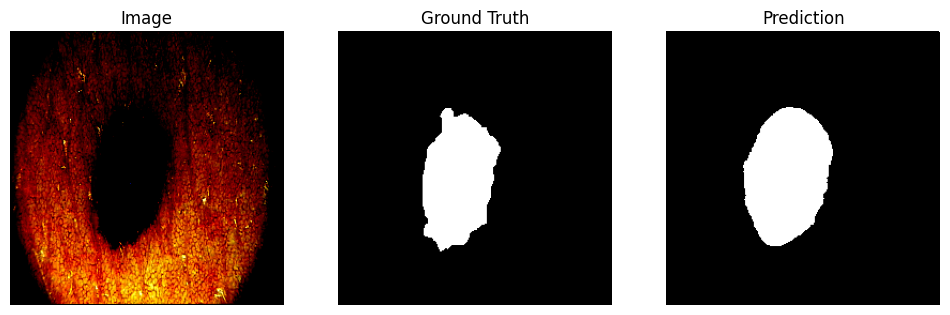

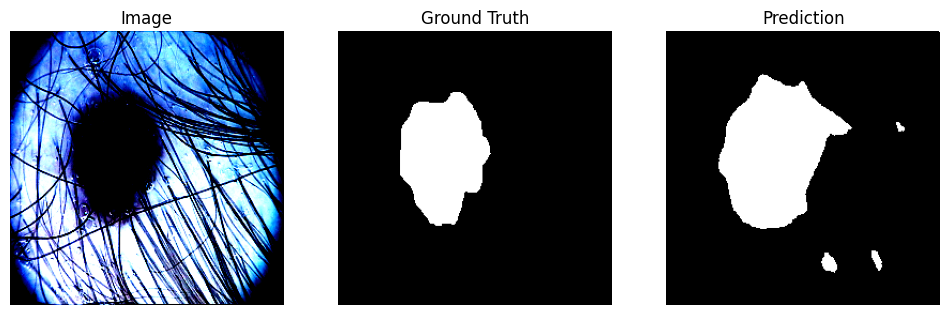

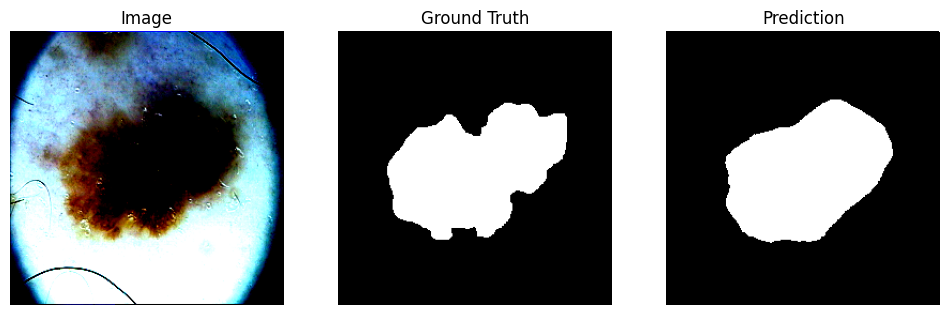

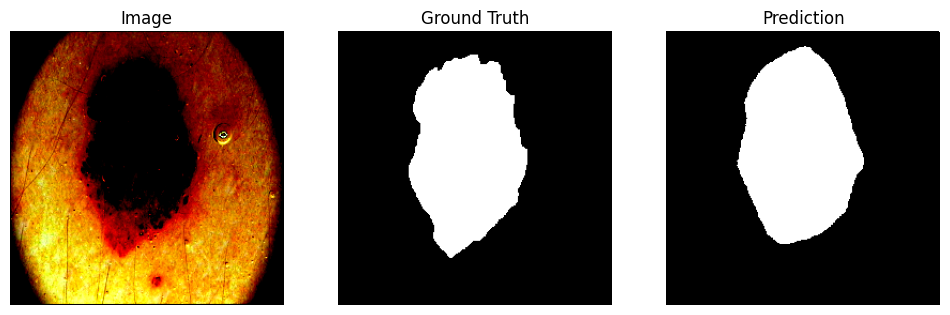

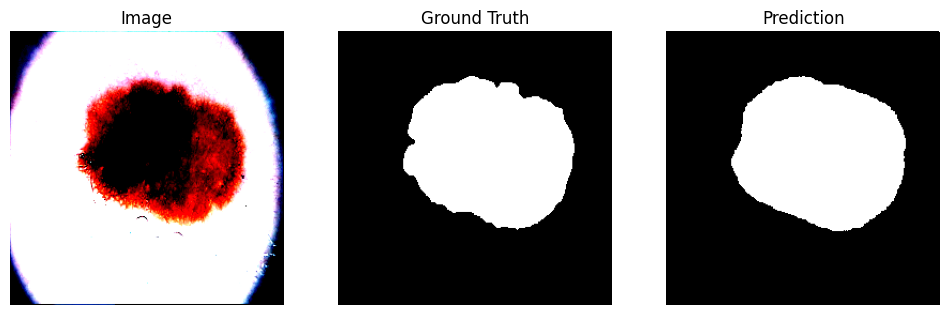

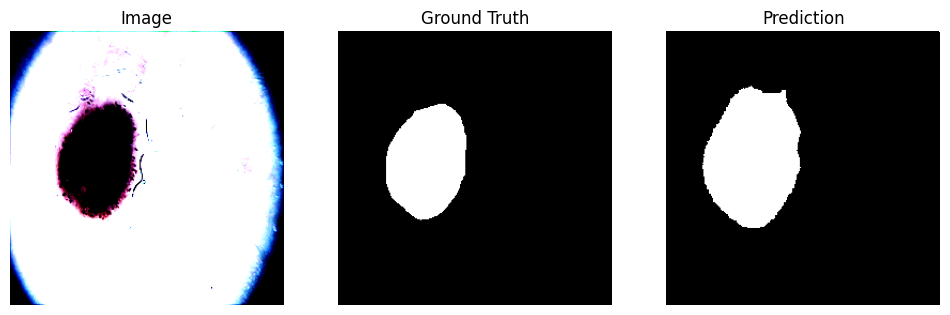

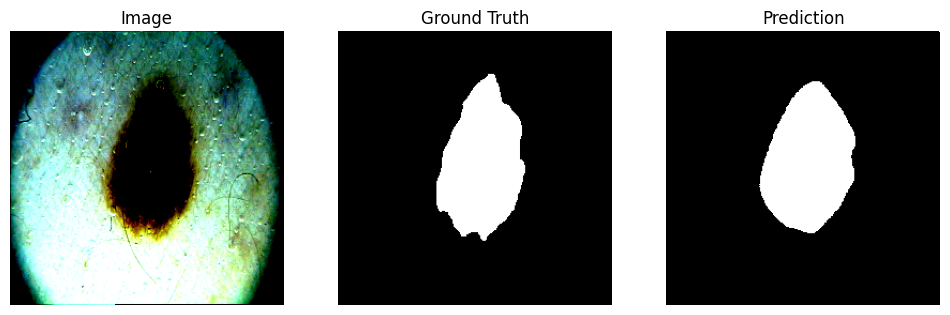

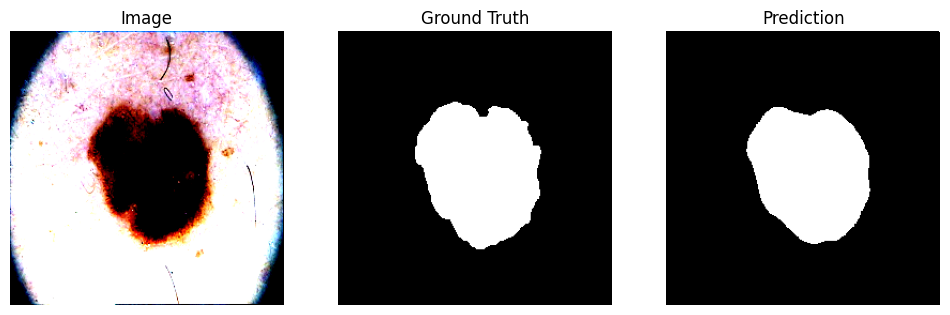

In [254]:
show_predictions(
    model_class=lambda: SegNet(in_channels=3, out_channels=1),
    checkpoint_path="best_segnet.pth",
    dataloader=test_dataloader,
    device='cuda',
    num_batches=2,
    max_items=10,
    )

___

In [255]:
import torch
import gc

del segnet_model
gc.collect()

torch.cuda.empty_cache()

In [256]:
segnet_model = SegNet().to(device)
segnet_model, history = train(
    segnet_model, train_dataloader, valid_dataloader, tversky_focal_loss,
    metrics={'iou': iou_score, 'dice': dice_score},
    num_epochs=100, lr=1e-3,
    scheduler_type='onecycle',
    patience=20,
    checkpoint_path="best_segnet.pth"
)

Epoch 1/100 | Train Loss: 0.6155 | Val Loss: 0.5524 | iou: train 0.2882, val 0.0000 | dice: train 0.3845, val 0.4476 | LR: 4.27e-05
  ↳ Saving best model (val loss inf → 0.5524)


Epoch 2/100 | Train Loss: 0.6022 | Val Loss: 0.5525 | iou: train 0.3092, val 0.0000 | dice: train 0.3978, val 0.4475 | LR: 5.07e-05


Epoch 3/100 | Train Loss: 0.6269 | Val Loss: 0.5525 | iou: train 0.2829, val 0.0000 | dice: train 0.3731, val 0.4475 | LR: 6.39e-05


Epoch 4/100 | Train Loss: 0.6320 | Val Loss: 0.5524 | iou: train 0.2794, val 0.0000 | dice: train 0.3680, val 0.4476 | LR: 8.22e-05


Epoch 5/100 | Train Loss: 0.6056 | Val Loss: 0.5523 | iou: train 0.3092, val 0.0000 | dice: train 0.3944, val 0.4477 | LR: 1.05e-04
  ↳ Saving best model (val loss 0.5524 → 0.5523)


Epoch 6/100 | Train Loss: 0.6174 | Val Loss: 0.5519 | iou: train 0.2970, val 0.0000 | dice: train 0.3826, val 0.4481 | LR: 1.33e-04
  ↳ Saving best model (val loss 0.5523 → 0.5519)


Epoch 7/100 | Train Loss: 0.5886 | Val Loss: 0.5513 | iou: train 0.3358, val 0.0000 | dice: train 0.4114, val 0.4487 | LR: 1.65e-04
  ↳ Saving best model (val loss 0.5519 → 0.5513)


Epoch 8/100 | Train Loss: 0.6093 | Val Loss: 0.5501 | iou: train 0.3116, val 0.0000 | dice: train 0.3907, val 0.4499 | LR: 2.01e-04
  ↳ Saving best model (val loss 0.5513 → 0.5501)


Epoch 9/100 | Train Loss: 0.6048 | Val Loss: 0.5480 | iou: train 0.3137, val 0.3735 | dice: train 0.3952, val 0.4520 | LR: 2.41e-04
  ↳ Saving best model (val loss 0.5501 → 0.5480)


Epoch 10/100 | Train Loss: 0.6101 | Val Loss: 0.5436 | iou: train 0.3096, val 0.3708 | dice: train 0.3899, val 0.4564 | LR: 2.84e-04
  ↳ Saving best model (val loss 0.5480 → 0.5436)


Epoch 11/100 | Train Loss: 0.5923 | Val Loss: 0.5296 | iou: train 0.3291, val 0.3625 | dice: train 0.4077, val 0.4704 | LR: 3.29e-04
  ↳ Saving best model (val loss 0.5436 → 0.5296)


Epoch 12/100 | Train Loss: 0.5857 | Val Loss: 0.5097 | iou: train 0.3407, val 0.3793 | dice: train 0.4143, val 0.4903 | LR: 3.77e-04
  ↳ Saving best model (val loss 0.5296 → 0.5097)


Epoch 13/100 | Train Loss: 0.5570 | Val Loss: 0.4764 | iou: train 0.3787, val 0.4346 | dice: train 0.4430, val 0.5236 | LR: 4.26e-04
  ↳ Saving best model (val loss 0.5097 → 0.4764)


Epoch 14/100 | Train Loss: 0.5860 | Val Loss: 0.5959 | iou: train 0.3396, val 0.2419 | dice: train 0.4140, val 0.4041 | LR: 4.76e-04


Epoch 15/100 | Train Loss: 0.5592 | Val Loss: 0.3943 | iou: train 0.3632, val 0.4891 | dice: train 0.4408, val 0.6057 | LR: 5.26e-04
  ↳ Saving best model (val loss 0.4764 → 0.3943)


Epoch 16/100 | Train Loss: 0.5322 | Val Loss: 0.4556 | iou: train 0.4073, val 0.3810 | dice: train 0.4678, val 0.5444 | LR: 5.77e-04


Epoch 17/100 | Train Loss: 0.5200 | Val Loss: 0.4221 | iou: train 0.4255, val 0.4185 | dice: train 0.4800, val 0.5779 | LR: 6.27e-04


Epoch 18/100 | Train Loss: 0.4961 | Val Loss: 0.3912 | iou: train 0.4562, val 0.4570 | dice: train 0.5039, val 0.6088 | LR: 6.76e-04
  ↳ Saving best model (val loss 0.3943 → 0.3912)


Epoch 19/100 | Train Loss: 0.4488 | Val Loss: 0.3500 | iou: train 0.5149, val 0.4931 | dice: train 0.5512, val 0.6500 | LR: 7.23e-04
  ↳ Saving best model (val loss 0.3912 → 0.3500)


Epoch 20/100 | Train Loss: 0.4192 | Val Loss: 0.4244 | iou: train 0.5354, val 0.4709 | dice: train 0.5808, val 0.5756 | LR: 7.67e-04


Epoch 21/100 | Train Loss: 0.4034 | Val Loss: 0.3113 | iou: train 0.5217, val 0.5455 | dice: train 0.5966, val 0.6887 | LR: 8.09e-04
  ↳ Saving best model (val loss 0.3500 → 0.3113)


Epoch 22/100 | Train Loss: 0.3607 | Val Loss: 0.3552 | iou: train 0.5502, val 0.4984 | dice: train 0.6393, val 0.6448 | LR: 8.48e-04


Epoch 23/100 | Train Loss: 0.3539 | Val Loss: 0.4222 | iou: train 0.5768, val 0.3898 | dice: train 0.6461, val 0.5778 | LR: 8.83e-04


Epoch 24/100 | Train Loss: 0.3202 | Val Loss: 0.4059 | iou: train 0.5860, val 0.3923 | dice: train 0.6798, val 0.5941 | LR: 9.14e-04


Epoch 25/100 | Train Loss: 0.3122 | Val Loss: 0.3802 | iou: train 0.5841, val 0.4737 | dice: train 0.6878, val 0.6198 | LR: 9.41e-04


Epoch 26/100 | Train Loss: 0.2271 | Val Loss: 0.3913 | iou: train 0.6946, val 0.4467 | dice: train 0.7729, val 0.6087 | LR: 9.63e-04


Epoch 27/100 | Train Loss: 0.2861 | Val Loss: 0.4628 | iou: train 0.6139, val 0.4106 | dice: train 0.7139, val 0.5372 | LR: 9.80e-04


Epoch 28/100 | Train Loss: 0.2579 | Val Loss: 0.3665 | iou: train 0.6144, val 0.5397 | dice: train 0.7421, val 0.6335 | LR: 9.92e-04


Epoch 29/100 | Train Loss: 0.2171 | Val Loss: 0.3200 | iou: train 0.6682, val 0.5800 | dice: train 0.7829, val 0.6800 | LR: 9.98e-04


Epoch 30/100 | Train Loss: 0.2940 | Val Loss: 0.3371 | iou: train 0.5714, val 0.5057 | dice: train 0.7060, val 0.6629 | LR: 1.00e-03


Epoch 31/100 | Train Loss: 0.2490 | Val Loss: 0.3082 | iou: train 0.6206, val 0.5474 | dice: train 0.7510, val 0.6918 | LR: 9.99e-04
  ↳ Saving best model (val loss 0.3113 → 0.3082)


Epoch 32/100 | Train Loss: 0.2133 | Val Loss: 0.1961 | iou: train 0.6640, val 0.7092 | dice: train 0.7867, val 0.8039 | LR: 9.97e-04
  ↳ Saving best model (val loss 0.3082 → 0.1961)


Epoch 33/100 | Train Loss: 0.1978 | Val Loss: 0.1968 | iou: train 0.6927, val 0.7097 | dice: train 0.8022, val 0.8032 | LR: 9.95e-04


Epoch 34/100 | Train Loss: 0.2763 | Val Loss: 0.2636 | iou: train 0.5991, val 0.6008 | dice: train 0.7237, val 0.7364 | LR: 9.91e-04


Epoch 35/100 | Train Loss: 0.1897 | Val Loss: 0.1965 | iou: train 0.6936, val 0.6829 | dice: train 0.8103, val 0.8035 | LR: 9.86e-04


Epoch 36/100 | Train Loss: 0.1956 | Val Loss: 0.1721 | iou: train 0.6817, val 0.7150 | dice: train 0.8044, val 0.8279 | LR: 9.80e-04
  ↳ Saving best model (val loss 0.1961 → 0.1721)


Epoch 37/100 | Train Loss: 0.1916 | Val Loss: 0.2703 | iou: train 0.6907, val 0.5791 | dice: train 0.8084, val 0.7297 | LR: 9.74e-04


Epoch 38/100 | Train Loss: 0.2078 | Val Loss: 0.4500 | iou: train 0.6634, val 0.3803 | dice: train 0.7922, val 0.5500 | LR: 9.66e-04


Epoch 39/100 | Train Loss: 0.1824 | Val Loss: 0.2106 | iou: train 0.7000, val 0.6607 | dice: train 0.8176, val 0.7894 | LR: 9.58e-04


Epoch 40/100 | Train Loss: 0.1821 | Val Loss: 0.1694 | iou: train 0.7017, val 0.7235 | dice: train 0.8179, val 0.8306 | LR: 9.48e-04
  ↳ Saving best model (val loss 0.1721 → 0.1694)


Epoch 41/100 | Train Loss: 0.2126 | Val Loss: 0.1695 | iou: train 0.6580, val 0.7192 | dice: train 0.7874, val 0.8305 | LR: 9.38e-04


Epoch 42/100 | Train Loss: 0.2176 | Val Loss: 0.1904 | iou: train 0.6487, val 0.6855 | dice: train 0.7824, val 0.8096 | LR: 9.26e-04


Epoch 43/100 | Train Loss: 0.1893 | Val Loss: 0.1942 | iou: train 0.6900, val 0.6820 | dice: train 0.8107, val 0.8058 | LR: 9.14e-04


Epoch 44/100 | Train Loss: 0.1943 | Val Loss: 0.1821 | iou: train 0.6829, val 0.7020 | dice: train 0.8057, val 0.8179 | LR: 9.01e-04


Epoch 45/100 | Train Loss: 0.2200 | Val Loss: 0.1718 | iou: train 0.6458, val 0.7101 | dice: train 0.7800, val 0.8282 | LR: 8.87e-04


Epoch 46/100 | Train Loss: 0.1842 | Val Loss: 0.1728 | iou: train 0.6969, val 0.7085 | dice: train 0.8158, val 0.8272 | LR: 8.73e-04


Epoch 47/100 | Train Loss: 0.1738 | Val Loss: 0.2268 | iou: train 0.7115, val 0.6330 | dice: train 0.8262, val 0.7732 | LR: 8.57e-04


Epoch 48/100 | Train Loss: 0.1931 | Val Loss: 0.2016 | iou: train 0.6847, val 0.6676 | dice: train 0.8069, val 0.7984 | LR: 8.41e-04


Epoch 49/100 | Train Loss: 0.1935 | Val Loss: 0.1606 | iou: train 0.6850, val 0.7291 | dice: train 0.8065, val 0.8394 | LR: 8.25e-04
  ↳ Saving best model (val loss 0.1694 → 0.1606)


Epoch 50/100 | Train Loss: 0.1652 | Val Loss: 0.1703 | iou: train 0.7243, val 0.7131 | dice: train 0.8348, val 0.8297 | LR: 8.07e-04


Epoch 51/100 | Train Loss: 0.1887 | Val Loss: 0.1722 | iou: train 0.6927, val 0.7087 | dice: train 0.8113, val 0.8278 | LR: 7.89e-04


Epoch 52/100 | Train Loss: 0.1611 | Val Loss: 0.1545 | iou: train 0.7287, val 0.7360 | dice: train 0.8389, val 0.8455 | LR: 7.71e-04
  ↳ Saving best model (val loss 0.1606 → 0.1545)


Epoch 53/100 | Train Loss: 0.1304 | Val Loss: 0.1403 | iou: train 0.7744, val 0.7587 | dice: train 0.8696, val 0.8597 | LR: 7.52e-04
  ↳ Saving best model (val loss 0.1545 → 0.1403)


Epoch 54/100 | Train Loss: 0.1290 | Val Loss: 0.1357 | iou: train 0.7764, val 0.7676 | dice: train 0.8710, val 0.8643 | LR: 7.32e-04
  ↳ Saving best model (val loss 0.1403 → 0.1357)


Epoch 55/100 | Train Loss: 0.2215 | Val Loss: 0.1339 | iou: train 0.6484, val 0.7684 | dice: train 0.7785, val 0.8661 | LR: 7.12e-04
  ↳ Saving best model (val loss 0.1357 → 0.1339)


Epoch 56/100 | Train Loss: 0.1318 | Val Loss: 0.1416 | iou: train 0.7732, val 0.7574 | dice: train 0.8682, val 0.8584 | LR: 6.91e-04


Epoch 57/100 | Train Loss: 0.1435 | Val Loss: 0.2264 | iou: train 0.7548, val 0.6350 | dice: train 0.8565, val 0.7736 | LR: 6.70e-04


Epoch 58/100 | Train Loss: 0.1521 | Val Loss: 0.2727 | iou: train 0.7415, val 0.5737 | dice: train 0.8479, val 0.7273 | LR: 6.49e-04


Epoch 59/100 | Train Loss: 0.2174 | Val Loss: 0.1922 | iou: train 0.6633, val 0.6796 | dice: train 0.7826, val 0.8078 | LR: 6.28e-04


Epoch 60/100 | Train Loss: 0.1570 | Val Loss: 0.1416 | iou: train 0.7336, val 0.7550 | dice: train 0.8430, val 0.8584 | LR: 6.06e-04


Epoch 61/100 | Train Loss: 0.1331 | Val Loss: 0.1260 | iou: train 0.7694, val 0.7814 | dice: train 0.8669, val 0.8740 | LR: 5.84e-04
  ↳ Saving best model (val loss 0.1339 → 0.1260)


Epoch 62/100 | Train Loss: 0.2116 | Val Loss: 0.1247 | iou: train 0.6760, val 0.7841 | dice: train 0.7884, val 0.8753 | LR: 5.62e-04
  ↳ Saving best model (val loss 0.1260 → 0.1247)


Epoch 63/100 | Train Loss: 0.1330 | Val Loss: 0.1340 | iou: train 0.7711, val 0.7683 | dice: train 0.8670, val 0.8660 | LR: 5.39e-04


Epoch 64/100 | Train Loss: 0.1326 | Val Loss: 0.1364 | iou: train 0.7707, val 0.7656 | dice: train 0.8674, val 0.8636 | LR: 5.17e-04


Epoch 65/100 | Train Loss: 0.1257 | Val Loss: 0.1425 | iou: train 0.7805, val 0.7581 | dice: train 0.8743, val 0.8575 | LR: 4.94e-04


Epoch 66/100 | Train Loss: 0.1380 | Val Loss: 0.1422 | iou: train 0.7619, val 0.7568 | dice: train 0.8620, val 0.8578 | LR: 4.72e-04


Epoch 67/100 | Train Loss: 0.1384 | Val Loss: 0.1389 | iou: train 0.7622, val 0.7600 | dice: train 0.8616, val 0.8611 | LR: 4.50e-04


Epoch 68/100 | Train Loss: 0.1321 | Val Loss: 0.1414 | iou: train 0.7701, val 0.7560 | dice: train 0.8679, val 0.8586 | LR: 4.27e-04


Epoch 69/100 | Train Loss: 0.1274 | Val Loss: 0.1337 | iou: train 0.7785, val 0.7673 | dice: train 0.8726, val 0.8663 | LR: 4.05e-04


Epoch 70/100 | Train Loss: 0.1246 | Val Loss: 0.1301 | iou: train 0.7819, val 0.7729 | dice: train 0.8754, val 0.8699 | LR: 3.83e-04


Epoch 71/100 | Train Loss: 0.1290 | Val Loss: 0.1277 | iou: train 0.7751, val 0.7771 | dice: train 0.8710, val 0.8723 | LR: 3.62e-04


Epoch 72/100 | Train Loss: 0.1453 | Val Loss: 0.1313 | iou: train 0.7518, val 0.7715 | dice: train 0.8547, val 0.8687 | LR: 3.40e-04


Epoch 73/100 | Train Loss: 0.1504 | Val Loss: 0.1264 | iou: train 0.7486, val 0.7790 | dice: train 0.8496, val 0.8736 | LR: 3.19e-04


Epoch 74/100 | Train Loss: 0.1400 | Val Loss: 0.1280 | iou: train 0.7613, val 0.7762 | dice: train 0.8600, val 0.8720 | LR: 2.98e-04


Epoch 75/100 | Train Loss: 0.0958 | Val Loss: 0.1266 | iou: train 0.8301, val 0.7782 | dice: train 0.9042, val 0.8734 | LR: 2.78e-04


Epoch 76/100 | Train Loss: 0.1323 | Val Loss: 0.1205 | iou: train 0.7726, val 0.7880 | dice: train 0.8677, val 0.8795 | LR: 2.58e-04
  ↳ Saving best model (val loss 0.1247 → 0.1205)


Epoch 77/100 | Train Loss: 0.1321 | Val Loss: 0.1127 | iou: train 0.7756, val 0.8008 | dice: train 0.8679, val 0.8873 | LR: 2.39e-04
  ↳ Saving best model (val loss 0.1205 → 0.1127)


Epoch 78/100 | Train Loss: 0.1184 | Val Loss: 0.1224 | iou: train 0.7939, val 0.7854 | dice: train 0.8816, val 0.8776 | LR: 2.20e-04


Epoch 79/100 | Train Loss: 0.1356 | Val Loss: 0.1185 | iou: train 0.7687, val 0.7914 | dice: train 0.8644, val 0.8815 | LR: 2.02e-04


Epoch 80/100 | Train Loss: 0.0952 | Val Loss: 0.1227 | iou: train 0.8303, val 0.7850 | dice: train 0.9048, val 0.8773 | LR: 1.84e-04


Epoch 81/100 | Train Loss: 0.1192 | Val Loss: 0.1252 | iou: train 0.7933, val 0.7810 | dice: train 0.8808, val 0.8748 | LR: 1.67e-04


Epoch 82/100 | Train Loss: 0.1384 | Val Loss: 0.1235 | iou: train 0.7633, val 0.7834 | dice: train 0.8616, val 0.8765 | LR: 1.50e-04


Epoch 83/100 | Train Loss: 0.1194 | Val Loss: 0.1180 | iou: train 0.7914, val 0.7918 | dice: train 0.8806, val 0.8820 | LR: 1.35e-04


Epoch 84/100 | Train Loss: 0.1147 | Val Loss: 0.1244 | iou: train 0.7981, val 0.7812 | dice: train 0.8853, val 0.8756 | LR: 1.20e-04


Epoch 85/100 | Train Loss: 0.1136 | Val Loss: 0.1267 | iou: train 0.7992, val 0.7781 | dice: train 0.8864, val 0.8733 | LR: 1.06e-04


Epoch 86/100 | Train Loss: 0.1255 | Val Loss: 0.1223 | iou: train 0.7821, val 0.7854 | dice: train 0.8745, val 0.8777 | LR: 9.22e-05


Epoch 87/100 | Train Loss: 0.1051 | Val Loss: 0.1276 | iou: train 0.8140, val 0.7772 | dice: train 0.8949, val 0.8724 | LR: 7.97e-05


Epoch 88/100 | Train Loss: 0.1061 | Val Loss: 0.1254 | iou: train 0.8117, val 0.7807 | dice: train 0.8939, val 0.8746 | LR: 6.79e-05


Epoch 89/100 | Train Loss: 0.1005 | Val Loss: 0.1278 | iou: train 0.8212, val 0.7769 | dice: train 0.8995, val 0.8722 | LR: 5.71e-05


Epoch 90/100 | Train Loss: 0.0928 | Val Loss: 0.1311 | iou: train 0.8339, val 0.7716 | dice: train 0.9072, val 0.8689 | LR: 4.71e-05


Epoch 91/100 | Train Loss: 0.0997 | Val Loss: 0.1270 | iou: train 0.8235, val 0.7781 | dice: train 0.9003, val 0.8730 | LR: 3.81e-05


Epoch 92/100 | Train Loss: 0.1233 | Val Loss: 0.1263 | iou: train 0.7850, val 0.7791 | dice: train 0.8767, val 0.8737 | LR: 2.99e-05


Epoch 93/100 | Train Loss: 0.1165 | Val Loss: 0.1274 | iou: train 0.7954, val 0.7772 | dice: train 0.8835, val 0.8726 | LR: 2.28e-05


Epoch 94/100 | Train Loss: 0.1165 | Val Loss: 0.1276 | iou: train 0.7968, val 0.7772 | dice: train 0.8835, val 0.8724 | LR: 1.66e-05


Epoch 95/100 | Train Loss: 0.1474 | Val Loss: 0.1321 | iou: train 0.7551, val 0.7698 | dice: train 0.8526, val 0.8679 | LR: 1.13e-05


Epoch 96/100 | Train Loss: 0.1336 | Val Loss: 0.1297 | iou: train 0.7725, val 0.7735 | dice: train 0.8664, val 0.8703 | LR: 7.07e-06


Epoch 97/100 | Train Loss: 0.1099 | Val Loss: 0.1320 | iou: train 0.8063, val 0.7699 | dice: train 0.8901, val 0.8680 | LR: 3.81e-06
  ↳ Early stopping triggered at epoch 97


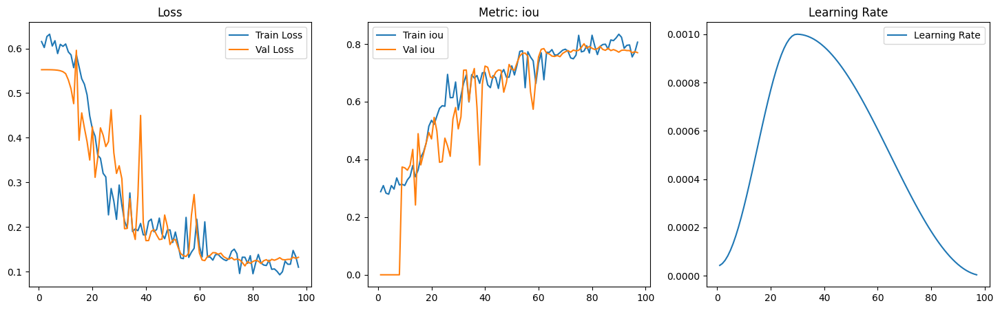

In [257]:
plot_history(history)

In [258]:
preds, targets = test(
    model_class=lambda: SegNet(in_channels=3, out_channels=1),
    checkpoint_path="best_segnet.pth",
    test_loader=test_dataloader,
    loss_fn=tversky_focal_loss
)

Test Loss: 0.0878


In [259]:
iou_score(preds.to(device), targets.to(device))

tensor(0.8413, device='cuda:0')

In [260]:
dice_score(preds.to(device), targets.to(device))

tensor(0.4822, device='cuda:0')

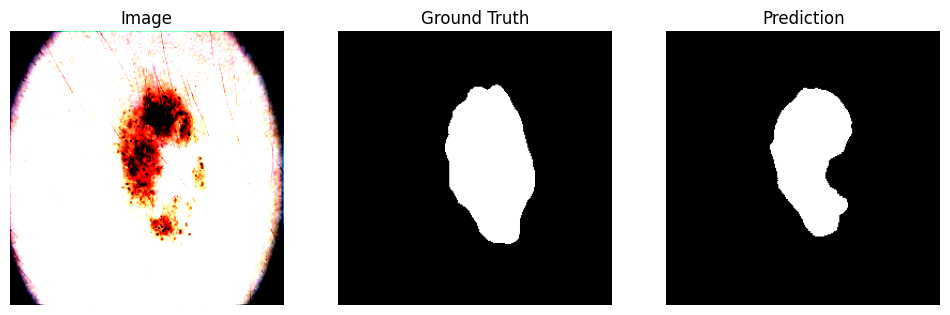

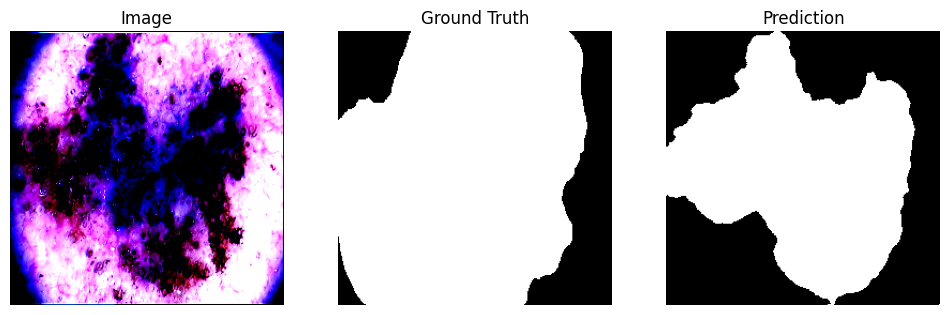

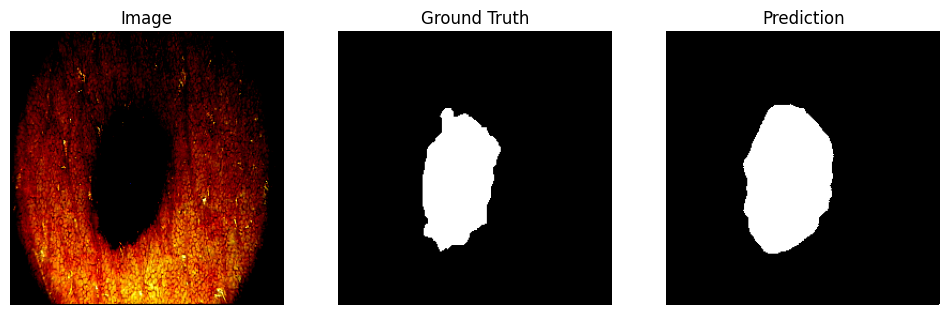

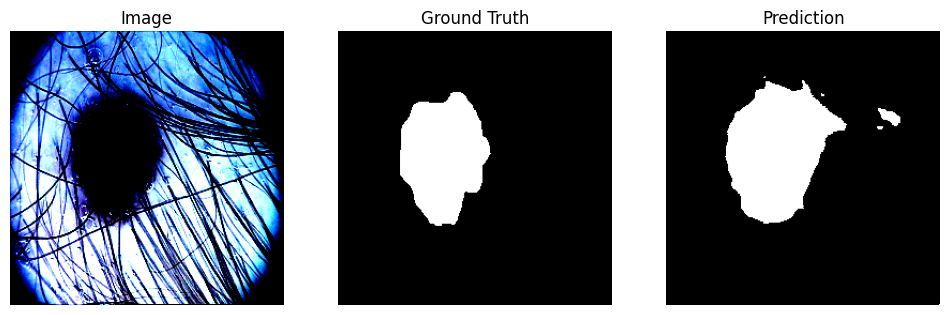

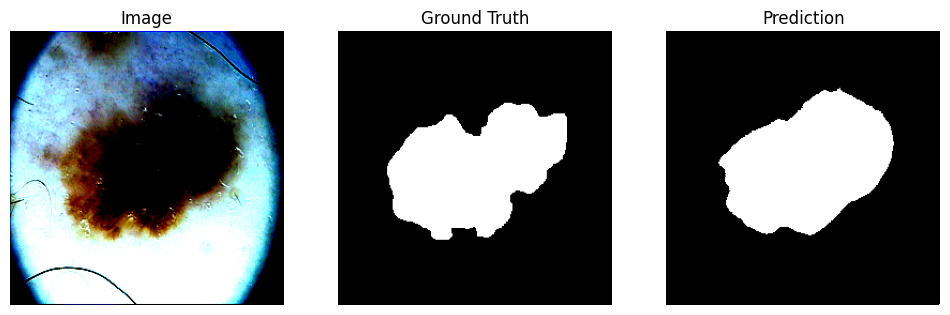

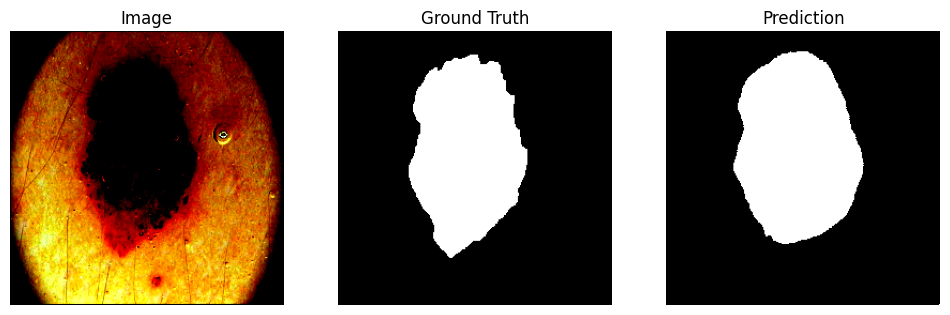

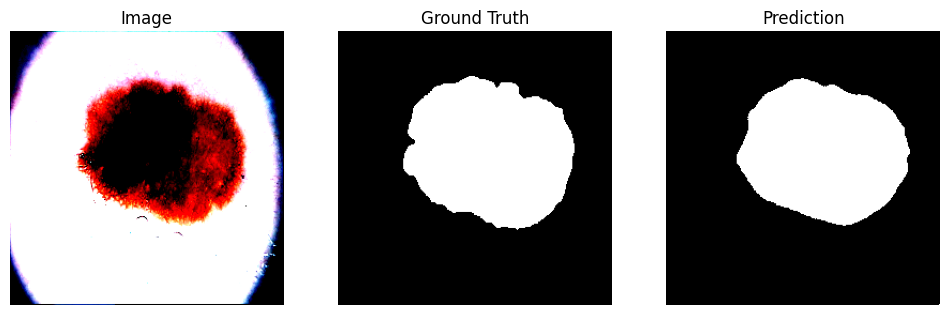

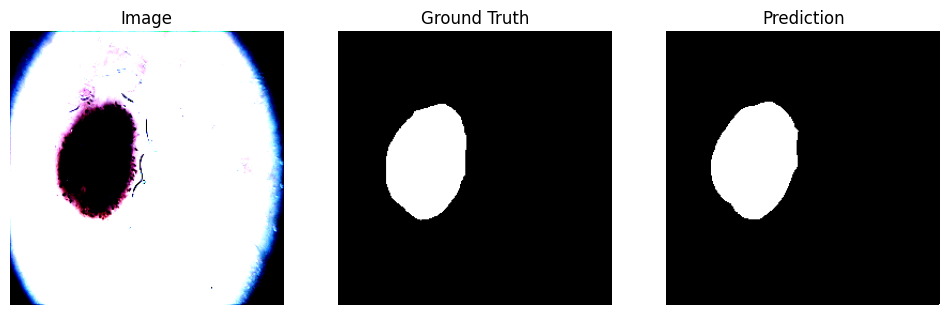

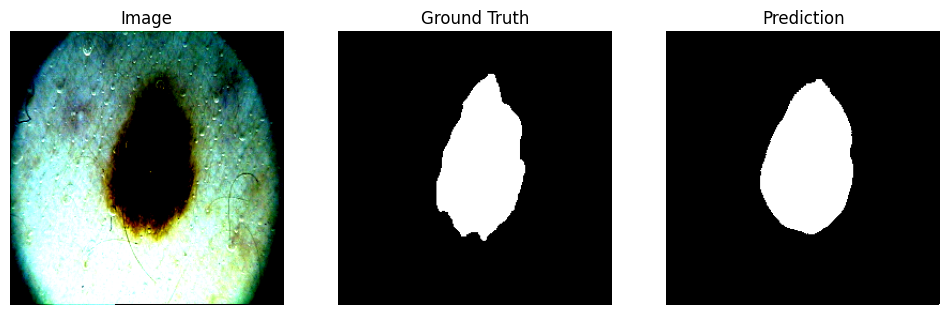

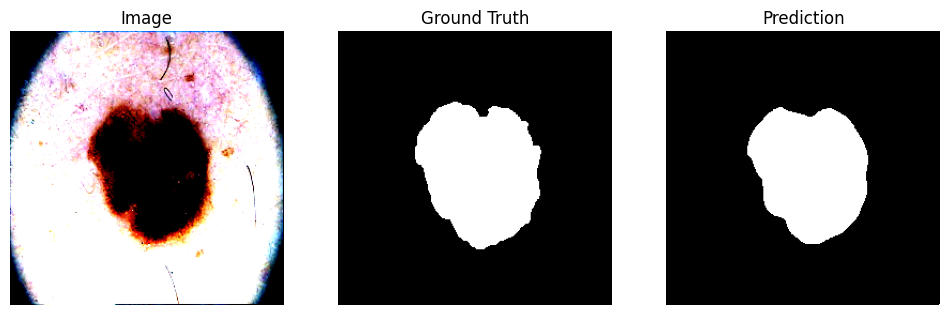

In [261]:
show_predictions(
    model_class=lambda: SegNet(in_channels=3, out_channels=1),
    checkpoint_path="best_segnet.pth",
    dataloader=test_dataloader,
    device='cuda',
    num_batches=2,
    max_items=10
    )

# Новая модель!

## U-Net [2 балла]

[**U-Net**](https://arxiv.org/abs/1505.04597) — это архитектура нейронной сети, которая получает изображение и выводит его. Первоначально он был задуман для семантической сегментации (как мы ее будем использовать), но он настолько успешен, что с тех пор используется в других контекстах. Получая на вход медицинское изображение, он выведет изображение в оттенках серого, где интенсивность каждого пикселя зависит от вероятности того, что этот пиксель принадлежит интересующей нас области.

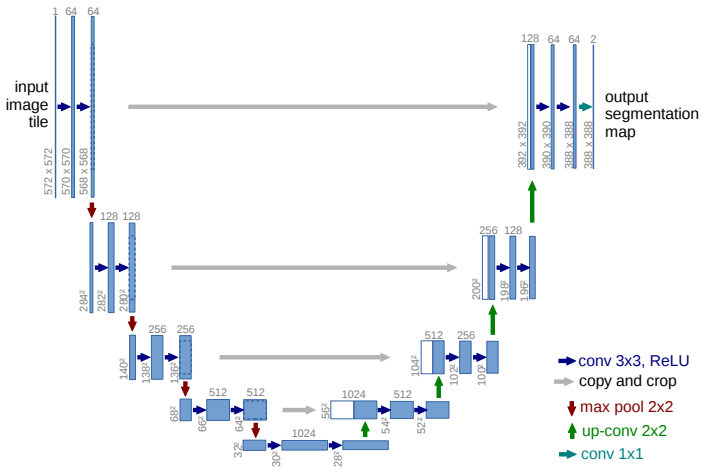

У нас в архитектуре все так же существует энкодер и декодер, как в **SegNet**, но отличительной особеностью данной модели являются *skip-conenctions*, соединяющие части декодера и энкодера. То есть для того чтобы передать на вход декодера тензор, мы конкатенируем симметричный выход с энкодера и выход предыдущего слоя декодера.

* Ronneberger, Olaf, Philipp Fischer, and Thomas Brox. "[U-Net: Convolutional networks for biomedical image segmentation.](https://arxiv.org/pdf/1505.04597.pdf)" International Conference on Medical image computing and computer-assisted intervention. Springer, Cham, 2015.

In [262]:
import torch.nn.functional as F
import torch.nn as nn

In [263]:
import torch
import torch.nn as nn

class UNet(nn.Module):
    def __init__(self):
        super(UNet, self).__init__()

        # Encoder (Downsampling path)
        self.enc_conv0 = nn.Sequential(
            nn.Conv2d(3, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            nn.Conv2d(64, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True)
        )
        self.pool0 = nn.MaxPool2d(2, 2)  # 256 -> 128

        self.enc_conv1 = nn.Sequential(
            nn.Conv2d(64, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.Conv2d(128, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True)
        )
        self.pool1 = nn.MaxPool2d(2, 2)  # 128 -> 64

        self.enc_conv2 = nn.Sequential(
            nn.Conv2d(128, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),

            nn.Conv2d(256, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True)
        )
        self.pool2 = nn.MaxPool2d(2, 2)  # 64 -> 32

        self.enc_conv3 = nn.Sequential(
            nn.Conv2d(256, 512, 3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),

            nn.Conv2d(512, 512, 3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True)
        )
        self.pool3 = nn.MaxPool2d(2, 2)  # 32 -> 16

        # Bottleneck
        self.bottleneck = nn.Sequential(
            nn.Conv2d(512, 1024, 3, padding=1),
            nn.BatchNorm2d(1024),
            nn.ReLU(inplace=True),

            nn.Conv2d(1024, 1024, 3, padding=1),
            nn.BatchNorm2d(1024),
            nn.ReLU(inplace=True)
        )

        # Decoder (Upsampling path)
        self.upconv3 = nn.ConvTranspose2d(1024, 512, 2, stride=2)  # 16 -> 32
        self.dec_conv3 = nn.Sequential(
            nn.Conv2d(1024, 512, 3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),

            nn.Conv2d(512, 512, 3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True)
        )

        self.upconv2 = nn.ConvTranspose2d(512, 256, 2, stride=2)  # 32 -> 64
        self.dec_conv2 = nn.Sequential(
            nn.Conv2d(512, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),

            nn.Conv2d(256, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True)
        )

        self.upconv1 = nn.ConvTranspose2d(256, 128, 2, stride=2)  # 64 -> 128
        self.dec_conv1 = nn.Sequential(
            nn.Conv2d(256, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.Conv2d(128, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True)
        )

        self.upconv0 = nn.ConvTranspose2d(128, 64, 2, stride=2)  # 128 -> 256
        self.dec_conv0 = nn.Sequential(
            nn.Conv2d(128, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            nn.Conv2d(64, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True)
        )

        # Final 1x1 convolution
        self.final_conv = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, x):
        # Encoder
        e0 = self.enc_conv0(x)
        p0 = self.pool0(e0)

        e1 = self.enc_conv1(p0)
        p1 = self.pool1(e1)

        e2 = self.enc_conv2(p1)
        p2 = self.pool2(e2)

        e3 = self.enc_conv3(p2)
        p3 = self.pool3(e3)

        # Bottleneck
        b = self.bottleneck(p3)

        # Decoder
        d3 = self.upconv3(b)
        d3 = torch.cat((d3, e3), dim=1)
        d3 = self.dec_conv3(d3)

        d2 = self.upconv2(d3)
        d2 = torch.cat((d2, e2), dim=1)
        d2 = self.dec_conv2(d2)

        d1 = self.upconv1(d2)
        d1 = torch.cat((d1, e1), dim=1)
        d1 = self.dec_conv1(d1)

        d0 = self.upconv0(d1)
        d0 = torch.cat((d0, e0), dim=1)
        d0 = self.dec_conv0(d0)

        out = self.final_conv(d0)

        return out

In [264]:
import torch
import gc

del segnet_model
gc.collect()

torch.cuda.empty_cache()

## Обучите UNet

Задание: обучите UNet на всех трех лоссах: BCE, Dice, Focal и сравните результаты с SegNet:
*   Какая модель дает лучшие значения по метрике?
*   Какая модель дает лучшие значения по лоссам?
*   Какая модель обучается быстрее?
*   Сравните визуально результаты SegNet и UNet.

Напишите развернутый ответ на вопросы.



# BCE loss

In [265]:
unet_model = UNet().to(device)
unet_model, history = train(
    unet_model, train_dataloader, valid_dataloader, bce_loss,
    metrics={'iou': iou_score, 'dice': dice_score},
    num_epochs=100, lr=1e-3,
    scheduler_type='onecycle',
    patience=20
)

Epoch 1/100 | Train Loss: 1093002.3906 | Val Loss: 1116565.7812 | iou: train 0.3467, val 0.0000 | dice: train 0.4096, val 0.4217 | LR: 4.27e-05
  ↳ Saving best model (val loss inf → 1116565.7812)


Epoch 2/100 | Train Loss: 970958.1406 | Val Loss: 1103122.5000 | iou: train 0.5110, val 0.5539 | dice: train 0.4493, val 0.4303 | LR: 5.07e-05
  ↳ Saving best model (val loss 1116565.7812 → 1103122.5000)


Epoch 3/100 | Train Loss: 911544.8457 | Val Loss: 1067402.6250 | iou: train 0.5496, val 0.6171 | dice: train 0.4931, val 0.4438 | LR: 6.39e-05
  ↳ Saving best model (val loss 1103122.5000 → 1067402.6250)


Epoch 4/100 | Train Loss: 846146.0332 | Val Loss: 999631.2188 | iou: train 0.5634, val 0.6195 | dice: train 0.5142, val 0.4657 | LR: 8.22e-05
  ↳ Saving best model (val loss 1067402.6250 → 999631.2188)


Epoch 5/100 | Train Loss: 776404.2773 | Val Loss: 897193.8438 | iou: train 0.5541, val 0.6462 | dice: train 0.5227, val 0.5089 | LR: 1.05e-04
  ↳ Saving best model (val loss 999631.2188 → 897193.8438)


Epoch 6/100 | Train Loss: 781172.6016 | Val Loss: 785021.5000 | iou: train 0.5487, val 0.7365 | dice: train 0.5421, val 0.5531 | LR: 1.33e-04
  ↳ Saving best model (val loss 897193.8438 → 785021.5000)


Epoch 7/100 | Train Loss: 689745.2305 | Val Loss: 580893.6406 | iou: train 0.5893, val 0.7894 | dice: train 0.5621, val 0.6745 | LR: 1.65e-04
  ↳ Saving best model (val loss 785021.5000 → 580893.6406)


Epoch 8/100 | Train Loss: 638545.4570 | Val Loss: 550531.5000 | iou: train 0.6150, val 0.7660 | dice: train 0.6142, val 0.7044 | LR: 2.01e-04
  ↳ Saving best model (val loss 580893.6406 → 550531.5000)


Epoch 9/100 | Train Loss: 640094.5410 | Val Loss: 744621.5312 | iou: train 0.6483, val 0.6180 | dice: train 0.6271, val 0.6820 | LR: 2.41e-04


Epoch 10/100 | Train Loss: 612746.4219 | Val Loss: 471945.7188 | iou: train 0.6759, val 0.7561 | dice: train 0.6273, val 0.7653 | LR: 2.84e-04
  ↳ Saving best model (val loss 550531.5000 → 471945.7188)


Epoch 11/100 | Train Loss: 544955.7734 | Val Loss: 3585545.1250 | iou: train 0.7329, val 0.4688 | dice: train 0.6602, val 0.6200 | LR: 3.29e-04


Epoch 12/100 | Train Loss: 570247.9766 | Val Loss: 2738565.3750 | iou: train 0.7053, val 0.5160 | dice: train 0.6622, val 0.6520 | LR: 3.77e-04


Epoch 13/100 | Train Loss: 612674.7188 | Val Loss: 698384.3750 | iou: train 0.6062, val 0.7385 | dice: train 0.6483, val 0.7918 | LR: 4.26e-04


Epoch 14/100 | Train Loss: 535785.3047 | Val Loss: 697664.8438 | iou: train 0.7310, val 0.6689 | dice: train 0.6768, val 0.7432 | LR: 4.76e-04


Epoch 15/100 | Train Loss: 537004.6641 | Val Loss: 837293.4062 | iou: train 0.6930, val 0.6410 | dice: train 0.6604, val 0.7175 | LR: 5.26e-04


Epoch 16/100 | Train Loss: 505754.5498 | Val Loss: 558350.2969 | iou: train 0.7293, val 0.7144 | dice: train 0.6839, val 0.7743 | LR: 5.77e-04


Epoch 17/100 | Train Loss: 498514.2461 | Val Loss: 934347.1250 | iou: train 0.6963, val 0.5736 | dice: train 0.6912, val 0.6807 | LR: 6.27e-04


Epoch 18/100 | Train Loss: 559872.0195 | Val Loss: 956277.4062 | iou: train 0.6317, val 0.6777 | dice: train 0.6500, val 0.7541 | LR: 6.76e-04


Epoch 19/100 | Train Loss: 503453.4199 | Val Loss: 759377.9375 | iou: train 0.7167, val 0.6973 | dice: train 0.6841, val 0.7577 | LR: 7.23e-04


Epoch 20/100 | Train Loss: 521845.2148 | Val Loss: 3280152.7500 | iou: train 0.5870, val 0.3227 | dice: train 0.5892, val 0.4738 | LR: 7.67e-04


Epoch 21/100 | Train Loss: 499881.6172 | Val Loss: 573879.3438 | iou: train 0.6424, val 0.7224 | dice: train 0.6795, val 0.7789 | LR: 8.09e-04


Epoch 22/100 | Train Loss: 532381.7734 | Val Loss: 1417846.2500 | iou: train 0.5938, val 0.5899 | dice: train 0.6141, val 0.6988 | LR: 8.48e-04


Epoch 23/100 | Train Loss: 432973.0039 | Val Loss: 485560.8438 | iou: train 0.7231, val 0.7474 | dice: train 0.6802, val 0.7602 | LR: 8.83e-04


Epoch 24/100 | Train Loss: 502544.0449 | Val Loss: 605969.3438 | iou: train 0.6936, val 0.6409 | dice: train 0.7076, val 0.6970 | LR: 9.14e-04


Epoch 25/100 | Train Loss: 489664.2578 | Val Loss: 691191.6875 | iou: train 0.6868, val 0.6876 | dice: train 0.6686, val 0.7704 | LR: 9.41e-04


Epoch 26/100 | Train Loss: 484005.9043 | Val Loss: 1685223.6875 | iou: train 0.6343, val 0.3609 | dice: train 0.6561, val 0.5161 | LR: 9.63e-04


Epoch 27/100 | Train Loss: 438333.8125 | Val Loss: 529988.3906 | iou: train 0.7315, val 0.7600 | dice: train 0.7105, val 0.7618 | LR: 9.80e-04


Epoch 28/100 | Train Loss: 444331.5322 | Val Loss: 419524.4062 | iou: train 0.7171, val 0.7783 | dice: train 0.6961, val 0.7900 | LR: 9.92e-04
  ↳ Saving best model (val loss 471945.7188 → 419524.4062)


Epoch 29/100 | Train Loss: 396122.4727 | Val Loss: 422980.2344 | iou: train 0.7616, val 0.7512 | dice: train 0.7465, val 0.7767 | LR: 9.98e-04


Epoch 30/100 | Train Loss: 384797.1191 | Val Loss: 366599.5703 | iou: train 0.7532, val 0.7845 | dice: train 0.7471, val 0.8156 | LR: 1.00e-03
  ↳ Saving best model (val loss 419524.4062 → 366599.5703)


Epoch 31/100 | Train Loss: 411798.2734 | Val Loss: 428699.8906 | iou: train 0.7037, val 0.7532 | dice: train 0.7207, val 0.7945 | LR: 9.99e-04


Epoch 32/100 | Train Loss: 357867.1865 | Val Loss: 553040.3125 | iou: train 0.7935, val 0.6935 | dice: train 0.7705, val 0.7373 | LR: 9.97e-04


Epoch 33/100 | Train Loss: 357455.2891 | Val Loss: 695563.2500 | iou: train 0.7346, val 0.6217 | dice: train 0.7483, val 0.6960 | LR: 9.95e-04


Epoch 34/100 | Train Loss: 361529.6445 | Val Loss: 628261.0156 | iou: train 0.7944, val 0.7063 | dice: train 0.7847, val 0.7716 | LR: 9.91e-04


Epoch 35/100 | Train Loss: 404812.9844 | Val Loss: 1011727.5000 | iou: train 0.6780, val 0.4799 | dice: train 0.7176, val 0.6213 | LR: 9.86e-04


Epoch 36/100 | Train Loss: 390489.8809 | Val Loss: 377498.7422 | iou: train 0.7302, val 0.7795 | dice: train 0.7549, val 0.8133 | LR: 9.80e-04


Epoch 37/100 | Train Loss: 337523.8984 | Val Loss: 392843.2031 | iou: train 0.7816, val 0.7640 | dice: train 0.7736, val 0.7988 | LR: 9.74e-04


Epoch 38/100 | Train Loss: 380935.3320 | Val Loss: 474741.8750 | iou: train 0.7532, val 0.6895 | dice: train 0.7627, val 0.7483 | LR: 9.66e-04


Epoch 39/100 | Train Loss: 363397.0742 | Val Loss: 374663.6016 | iou: train 0.7549, val 0.7698 | dice: train 0.7733, val 0.8191 | LR: 9.58e-04


Epoch 40/100 | Train Loss: 367841.9746 | Val Loss: 737402.9062 | iou: train 0.7523, val 0.6098 | dice: train 0.7740, val 0.7266 | LR: 9.48e-04


Epoch 41/100 | Train Loss: 340051.1016 | Val Loss: 421388.7969 | iou: train 0.7793, val 0.7717 | dice: train 0.7846, val 0.8312 | LR: 9.38e-04


Epoch 42/100 | Train Loss: 324855.2227 | Val Loss: 389896.6250 | iou: train 0.8026, val 0.7637 | dice: train 0.7937, val 0.8110 | LR: 9.26e-04


Epoch 43/100 | Train Loss: 347757.0547 | Val Loss: 399662.0938 | iou: train 0.7354, val 0.7718 | dice: train 0.7755, val 0.8289 | LR: 9.14e-04


Epoch 44/100 | Train Loss: 298153.2969 | Val Loss: 368737.4922 | iou: train 0.8009, val 0.7971 | dice: train 0.8035, val 0.8487 | LR: 9.01e-04


Epoch 45/100 | Train Loss: 291355.1230 | Val Loss: 467627.8750 | iou: train 0.8051, val 0.7366 | dice: train 0.8145, val 0.8105 | LR: 8.87e-04


Epoch 46/100 | Train Loss: 294037.2422 | Val Loss: 357942.8594 | iou: train 0.7784, val 0.7905 | dice: train 0.8050, val 0.8306 | LR: 8.73e-04
  ↳ Saving best model (val loss 366599.5703 → 357942.8594)


Epoch 47/100 | Train Loss: 305025.8281 | Val Loss: 384223.6172 | iou: train 0.7753, val 0.7878 | dice: train 0.8016, val 0.8222 | LR: 8.57e-04


Epoch 48/100 | Train Loss: 296253.7983 | Val Loss: 359028.5625 | iou: train 0.8227, val 0.7912 | dice: train 0.8289, val 0.8237 | LR: 8.41e-04


Epoch 49/100 | Train Loss: 258628.1211 | Val Loss: 320364.1562 | iou: train 0.7844, val 0.8061 | dice: train 0.8085, val 0.8315 | LR: 8.25e-04
  ↳ Saving best model (val loss 357942.8594 → 320364.1562)


Epoch 50/100 | Train Loss: 278564.4023 | Val Loss: 385687.4844 | iou: train 0.8096, val 0.7726 | dice: train 0.8159, val 0.8117 | LR: 8.07e-04


Epoch 51/100 | Train Loss: 267938.5977 | Val Loss: 338354.3594 | iou: train 0.7943, val 0.7805 | dice: train 0.8150, val 0.8322 | LR: 7.89e-04


Epoch 52/100 | Train Loss: 275325.0713 | Val Loss: 324221.9453 | iou: train 0.7960, val 0.7982 | dice: train 0.8143, val 0.8374 | LR: 7.71e-04


Epoch 53/100 | Train Loss: 275878.9043 | Val Loss: 287824.3828 | iou: train 0.7683, val 0.8177 | dice: train 0.7784, val 0.8496 | LR: 7.52e-04
  ↳ Saving best model (val loss 320364.1562 → 287824.3828)


Epoch 54/100 | Train Loss: 256277.4961 | Val Loss: 301883.6250 | iou: train 0.7969, val 0.8205 | dice: train 0.8272, val 0.8476 | LR: 7.32e-04


Epoch 55/100 | Train Loss: 271930.5938 | Val Loss: 319037.9062 | iou: train 0.8059, val 0.8132 | dice: train 0.8243, val 0.8362 | LR: 7.12e-04


Epoch 56/100 | Train Loss: 237454.0103 | Val Loss: 273056.1719 | iou: train 0.8357, val 0.8283 | dice: train 0.8387, val 0.8590 | LR: 6.91e-04
  ↳ Saving best model (val loss 287824.3828 → 273056.1719)


Epoch 57/100 | Train Loss: 246849.3320 | Val Loss: 324036.0469 | iou: train 0.8276, val 0.8014 | dice: train 0.8429, val 0.8495 | LR: 6.70e-04


Epoch 58/100 | Train Loss: 241592.2402 | Val Loss: 280412.6562 | iou: train 0.8398, val 0.8321 | dice: train 0.8509, val 0.8631 | LR: 6.49e-04


Epoch 59/100 | Train Loss: 255296.8818 | Val Loss: 266815.2031 | iou: train 0.8298, val 0.8353 | dice: train 0.8403, val 0.8669 | LR: 6.28e-04
  ↳ Saving best model (val loss 273056.1719 → 266815.2031)


Epoch 60/100 | Train Loss: 255804.2778 | Val Loss: 287674.0938 | iou: train 0.8309, val 0.8285 | dice: train 0.8390, val 0.8601 | LR: 6.06e-04


Epoch 61/100 | Train Loss: 218841.0078 | Val Loss: 307198.7734 | iou: train 0.8465, val 0.8197 | dice: train 0.8512, val 0.8595 | LR: 5.84e-04


Epoch 62/100 | Train Loss: 249446.1709 | Val Loss: 319019.1250 | iou: train 0.8367, val 0.8012 | dice: train 0.8521, val 0.8575 | LR: 5.62e-04


Epoch 63/100 | Train Loss: 244305.2012 | Val Loss: 304678.7266 | iou: train 0.8310, val 0.8218 | dice: train 0.8535, val 0.8591 | LR: 5.39e-04


Epoch 64/100 | Train Loss: 229133.0293 | Val Loss: 316489.5625 | iou: train 0.8277, val 0.8192 | dice: train 0.8508, val 0.8541 | LR: 5.17e-04


Epoch 65/100 | Train Loss: 228692.3828 | Val Loss: 308584.8750 | iou: train 0.8299, val 0.8172 | dice: train 0.8466, val 0.8568 | LR: 4.94e-04


Epoch 66/100 | Train Loss: 214473.6748 | Val Loss: 305983.7969 | iou: train 0.8585, val 0.8230 | dice: train 0.8633, val 0.8568 | LR: 4.72e-04


Epoch 67/100 | Train Loss: 217435.0000 | Val Loss: 311690.2500 | iou: train 0.8145, val 0.8225 | dice: train 0.8399, val 0.8578 | LR: 4.50e-04


Epoch 68/100 | Train Loss: 235893.0898 | Val Loss: 309649.5781 | iou: train 0.7479, val 0.8224 | dice: train 0.7914, val 0.8566 | LR: 4.27e-04


Epoch 69/100 | Train Loss: 222437.8145 | Val Loss: 320796.7969 | iou: train 0.8360, val 0.8170 | dice: train 0.8511, val 0.8564 | LR: 4.05e-04


Epoch 70/100 | Train Loss: 206326.5986 | Val Loss: 327480.4453 | iou: train 0.8404, val 0.8075 | dice: train 0.8543, val 0.8546 | LR: 3.83e-04


Epoch 71/100 | Train Loss: 207406.5459 | Val Loss: 343945.6641 | iou: train 0.8469, val 0.7990 | dice: train 0.8598, val 0.8484 | LR: 3.62e-04


Epoch 72/100 | Train Loss: 231522.8242 | Val Loss: 352927.7500 | iou: train 0.8427, val 0.7880 | dice: train 0.8583, val 0.8438 | LR: 3.40e-04


Epoch 73/100 | Train Loss: 219475.1191 | Val Loss: 277180.6172 | iou: train 0.8070, val 0.8319 | dice: train 0.8330, val 0.8669 | LR: 3.19e-04


Epoch 74/100 | Train Loss: 212779.1738 | Val Loss: 265364.4219 | iou: train 0.8601, val 0.8426 | dice: train 0.8654, val 0.8675 | LR: 2.98e-04
  ↳ Saving best model (val loss 266815.2031 → 265364.4219)


Epoch 75/100 | Train Loss: 217136.1660 | Val Loss: 284672.1094 | iou: train 0.8291, val 0.8175 | dice: train 0.8541, val 0.8627 | LR: 2.78e-04


Epoch 76/100 | Train Loss: 201325.0176 | Val Loss: 293817.5625 | iou: train 0.8621, val 0.8132 | dice: train 0.8717, val 0.8581 | LR: 2.58e-04


Epoch 77/100 | Train Loss: 201043.7070 | Val Loss: 283175.6406 | iou: train 0.8296, val 0.8269 | dice: train 0.8513, val 0.8644 | LR: 2.39e-04


Epoch 78/100 | Train Loss: 185908.2432 | Val Loss: 274057.9297 | iou: train 0.8651, val 0.8350 | dice: train 0.8692, val 0.8711 | LR: 2.20e-04


Epoch 79/100 | Train Loss: 193105.5674 | Val Loss: 260277.0000 | iou: train 0.8685, val 0.8375 | dice: train 0.8703, val 0.8752 | LR: 2.02e-04
  ↳ Saving best model (val loss 265364.4219 → 260277.0000)


Epoch 80/100 | Train Loss: 186326.7173 | Val Loss: 263801.5000 | iou: train 0.8614, val 0.8371 | dice: train 0.8738, val 0.8748 | LR: 1.84e-04


Epoch 81/100 | Train Loss: 199024.9102 | Val Loss: 292332.6406 | iou: train 0.8386, val 0.8220 | dice: train 0.8643, val 0.8677 | LR: 1.67e-04


Epoch 82/100 | Train Loss: 188632.6914 | Val Loss: 326709.2969 | iou: train 0.8499, val 0.8064 | dice: train 0.8728, val 0.8585 | LR: 1.50e-04


Epoch 83/100 | Train Loss: 185579.7471 | Val Loss: 338969.3281 | iou: train 0.8591, val 0.8027 | dice: train 0.8743, val 0.8551 | LR: 1.35e-04


Epoch 84/100 | Train Loss: 169778.6318 | Val Loss: 343572.3125 | iou: train 0.8940, val 0.7990 | dice: train 0.8937, val 0.8520 | LR: 1.20e-04


Epoch 85/100 | Train Loss: 204517.4834 | Val Loss: 326755.1562 | iou: train 0.8524, val 0.8061 | dice: train 0.8739, val 0.8591 | LR: 1.06e-04


Epoch 86/100 | Train Loss: 195272.4722 | Val Loss: 293537.7031 | iou: train 0.8609, val 0.8237 | dice: train 0.8722, val 0.8693 | LR: 9.22e-05


Epoch 87/100 | Train Loss: 184704.1914 | Val Loss: 278663.2500 | iou: train 0.8622, val 0.8322 | dice: train 0.8765, val 0.8728 | LR: 7.97e-05


Epoch 88/100 | Train Loss: 208198.8652 | Val Loss: 271924.5234 | iou: train 0.7578, val 0.8362 | dice: train 0.8018, val 0.8754 | LR: 6.79e-05


Epoch 89/100 | Train Loss: 177558.6680 | Val Loss: 280411.8906 | iou: train 0.8693, val 0.8294 | dice: train 0.8827, val 0.8723 | LR: 5.71e-05


Epoch 90/100 | Train Loss: 178297.2168 | Val Loss: 292410.0312 | iou: train 0.8715, val 0.8237 | dice: train 0.8834, val 0.8693 | LR: 4.71e-05


Epoch 91/100 | Train Loss: 179893.3125 | Val Loss: 272802.7969 | iou: train 0.7934, val 0.8325 | dice: train 0.8201, val 0.8739 | LR: 3.81e-05


Epoch 92/100 | Train Loss: 172181.6064 | Val Loss: 271842.8750 | iou: train 0.8549, val 0.8315 | dice: train 0.8748, val 0.8733 | LR: 2.99e-05


Epoch 93/100 | Train Loss: 183184.8369 | Val Loss: 270381.7734 | iou: train 0.8576, val 0.8334 | dice: train 0.8727, val 0.8736 | LR: 2.28e-05


Epoch 94/100 | Train Loss: 182691.4111 | Val Loss: 264152.0703 | iou: train 0.8726, val 0.8371 | dice: train 0.8740, val 0.8750 | LR: 1.66e-05


Epoch 95/100 | Train Loss: 185684.5898 | Val Loss: 266449.1250 | iou: train 0.8445, val 0.8372 | dice: train 0.8690, val 0.8751 | LR: 1.13e-05


Epoch 96/100 | Train Loss: 177874.6060 | Val Loss: 260143.2188 | iou: train 0.8600, val 0.8410 | dice: train 0.8672, val 0.8761 | LR: 7.07e-06
  ↳ Saving best model (val loss 260277.0000 → 260143.2188)


Epoch 97/100 | Train Loss: 176758.2842 | Val Loss: 265134.1250 | iou: train 0.8682, val 0.8386 | dice: train 0.8766, val 0.8750 | LR: 3.81e-06


Epoch 98/100 | Train Loss: 210170.8125 | Val Loss: 266407.3125 | iou: train 0.8248, val 0.8366 | dice: train 0.8575, val 0.8745 | LR: 1.55e-06


Epoch 99/100 | Train Loss: 205319.0078 | Val Loss: 256440.8438 | iou: train 0.7898, val 0.8428 | dice: train 0.8175, val 0.8779 | LR: 2.87e-07
  ↳ Saving best model (val loss 260143.2188 → 256440.8438)


Epoch 100/100 | Train Loss: 174269.8154 | Val Loss: 254853.7500 | iou: train 0.8767, val 0.8409 | dice: train 0.8787, val 0.8773 | LR: 3.55e-08
  ↳ Saving best model (val loss 256440.8438 → 254853.7500)


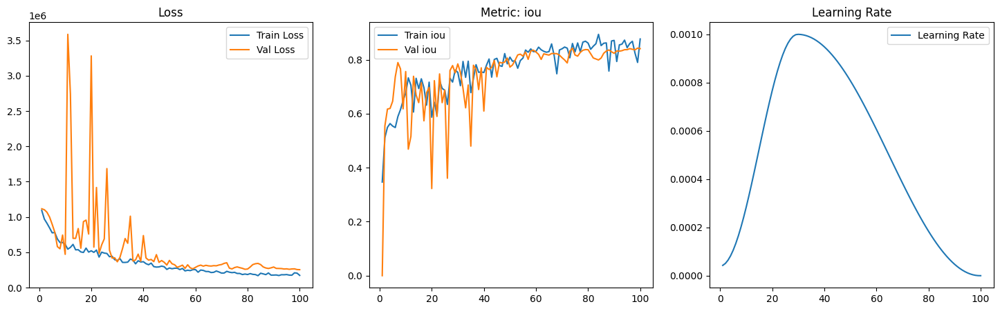

In [266]:
plot_history(history)

In [267]:
preds, targets = test(
    model_class=lambda: UNet(),
    checkpoint_path="best_model.pth",
    test_loader=test_dataloader,
    loss_fn=tversky_loss
)

Test Loss: 0.1191


In [268]:
iou_score(preds.to(device), targets.to(device))

tensor(0.8667, device='cuda:0')

In [269]:
dice_score(preds.to(device), targets.to(device))

tensor(0.4845, device='cuda:0')

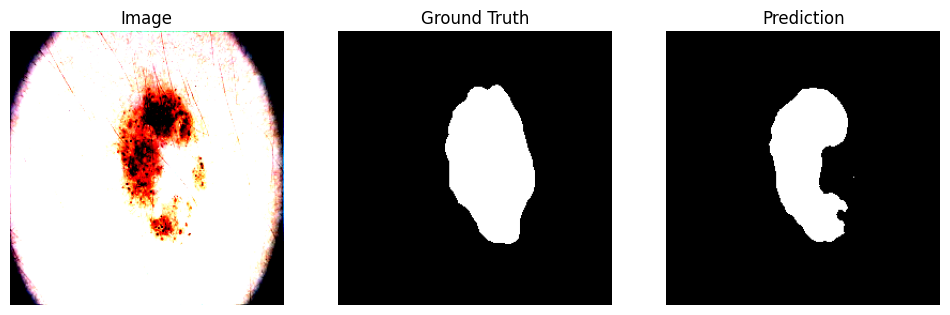

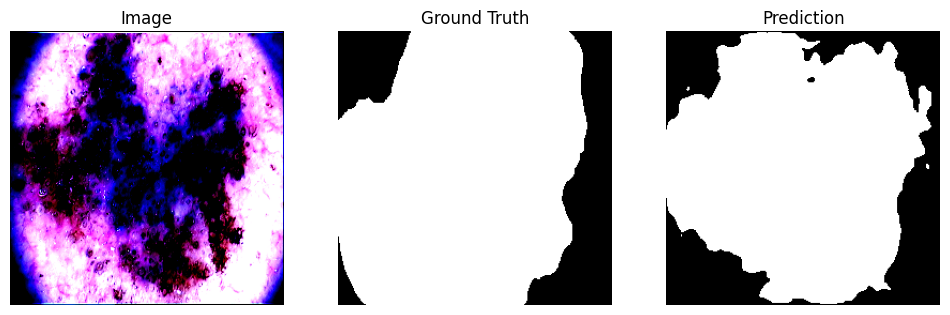

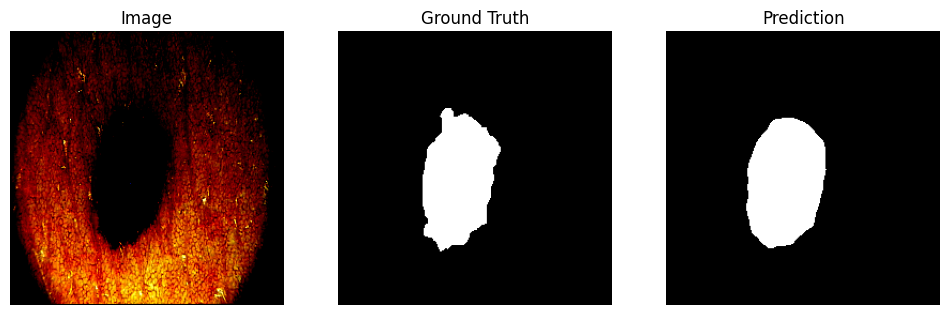

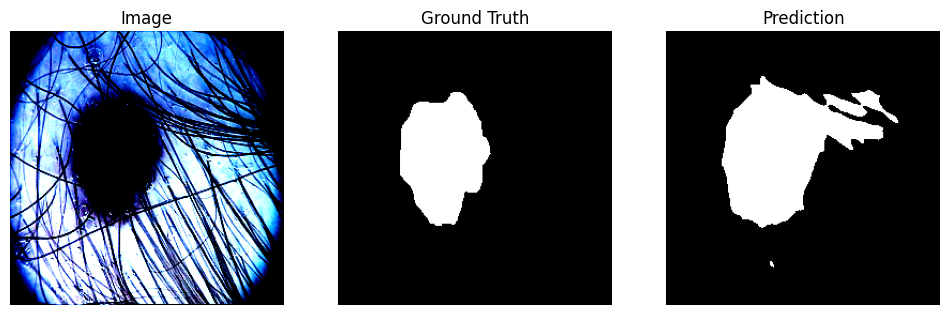

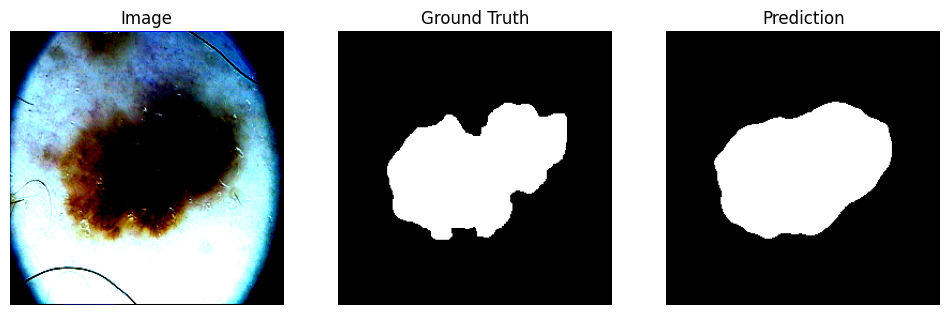

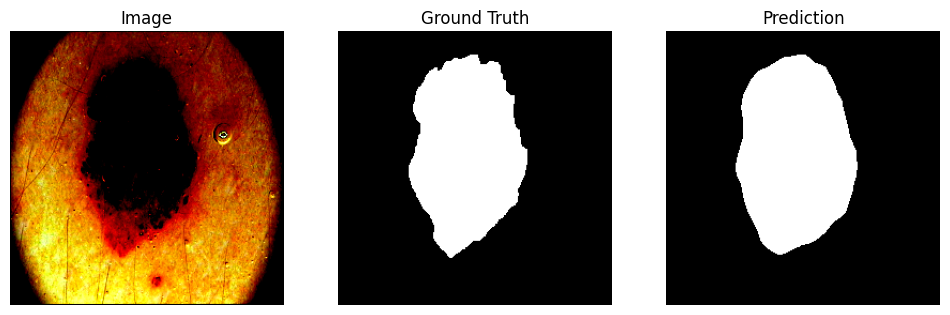

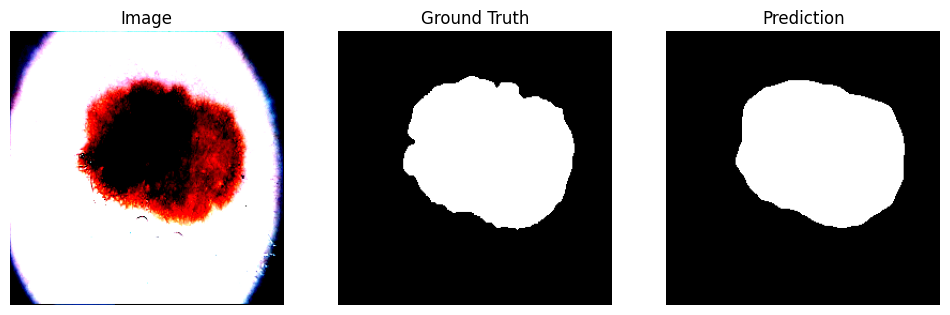

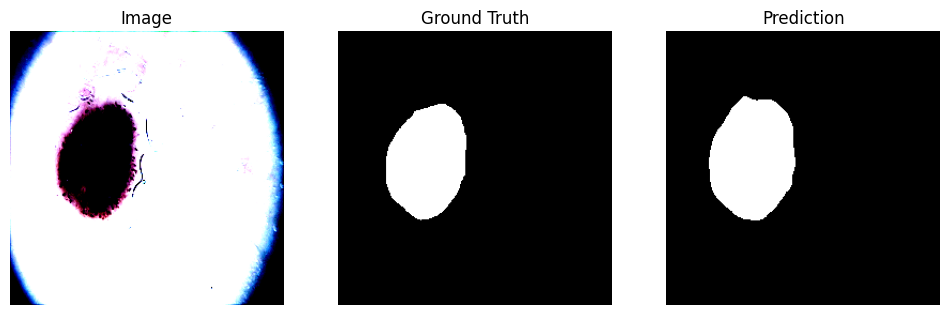

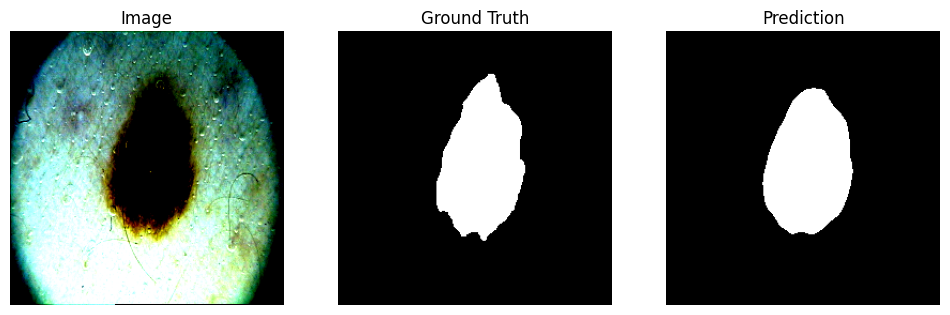

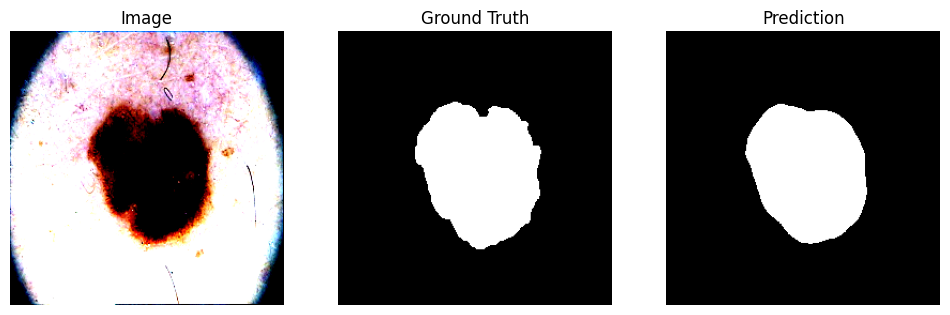

In [275]:
show_predictions(
    model_class=UNet,
    checkpoint_path="best_model.pth",
    dataloader=test_dataloader,
    device='cuda',
    num_batches=2,
    max_items=10
    )

# Dice loss

In [276]:
import torch
import gc

del unet_model
gc.collect()

torch.cuda.empty_cache()

In [277]:
unet_model = UNet().to(device)
unet_model, history = train(
    unet_model, train_dataloader, valid_dataloader, dice_loss,
    metrics={'iou': iou_score, 'dice': dice_score},
    num_epochs=100, lr=1e-3,
    scheduler_type='onecycle',
    patience=20
)

Epoch 1/100 | Train Loss: 0.6331 | Val Loss: 0.5824 | iou: train 0.1614, val 0.0000 | dice: train 0.3669, val 0.4176 | LR: 4.27e-05
  ↳ Saving best model (val loss inf → 0.5824)


Epoch 2/100 | Train Loss: 0.5767 | Val Loss: 0.5819 | iou: train 0.4446, val 0.0000 | dice: train 0.4233, val 0.4181 | LR: 5.07e-05
  ↳ Saving best model (val loss 0.5824 → 0.5819)


Epoch 3/100 | Train Loss: 0.5475 | Val Loss: 0.5776 | iou: train 0.5234, val 0.0001 | dice: train 0.4525, val 0.4224 | LR: 6.39e-05
  ↳ Saving best model (val loss 0.5819 → 0.5776)


Epoch 4/100 | Train Loss: 0.5062 | Val Loss: 0.5605 | iou: train 0.5296, val 0.3226 | dice: train 0.4938, val 0.4395 | LR: 8.22e-05
  ↳ Saving best model (val loss 0.5776 → 0.5605)


Epoch 5/100 | Train Loss: 0.4250 | Val Loss: 0.5150 | iou: train 0.5856, val 0.5809 | dice: train 0.5750, val 0.4850 | LR: 1.05e-04
  ↳ Saving best model (val loss 0.5605 → 0.5150)


Epoch 6/100 | Train Loss: 0.3788 | Val Loss: 0.4379 | iou: train 0.6104, val 0.6359 | dice: train 0.6212, val 0.5621 | LR: 1.33e-04
  ↳ Saving best model (val loss 0.5150 → 0.4379)


Epoch 7/100 | Train Loss: 0.3522 | Val Loss: 0.2566 | iou: train 0.6370, val 0.7280 | dice: train 0.6478, val 0.7434 | LR: 1.65e-04
  ↳ Saving best model (val loss 0.4379 → 0.2566)


Epoch 8/100 | Train Loss: 0.3399 | Val Loss: 0.2283 | iou: train 0.6377, val 0.7569 | dice: train 0.6601, val 0.7717 | LR: 2.01e-04
  ↳ Saving best model (val loss 0.2566 → 0.2283)


Epoch 9/100 | Train Loss: 0.3437 | Val Loss: 0.1759 | iou: train 0.6002, val 0.7739 | dice: train 0.6563, val 0.8241 | LR: 2.41e-04
  ↳ Saving best model (val loss 0.2283 → 0.1759)


Epoch 10/100 | Train Loss: 0.3333 | Val Loss: 0.1743 | iou: train 0.6095, val 0.7420 | dice: train 0.6667, val 0.8257 | LR: 2.84e-04
  ↳ Saving best model (val loss 0.1759 → 0.1743)


Epoch 11/100 | Train Loss: 0.3243 | Val Loss: 0.2560 | iou: train 0.6378, val 0.6400 | dice: train 0.6757, val 0.7440 | LR: 3.29e-04


Epoch 12/100 | Train Loss: 0.2876 | Val Loss: 0.3234 | iou: train 0.6886, val 0.5401 | dice: train 0.7124, val 0.6766 | LR: 3.77e-04


Epoch 13/100 | Train Loss: 0.3432 | Val Loss: 0.3691 | iou: train 0.6190, val 0.4768 | dice: train 0.6568, val 0.6309 | LR: 4.26e-04


Epoch 14/100 | Train Loss: 0.2693 | Val Loss: 0.3760 | iou: train 0.7312, val 0.4646 | dice: train 0.7307, val 0.6240 | LR: 4.76e-04


Epoch 15/100 | Train Loss: 0.2688 | Val Loss: 0.2561 | iou: train 0.7052, val 0.6762 | dice: train 0.7312, val 0.7439 | LR: 5.26e-04


Epoch 16/100 | Train Loss: 0.2989 | Val Loss: 0.2532 | iou: train 0.6265, val 0.6575 | dice: train 0.7011, val 0.7468 | LR: 5.77e-04


Epoch 17/100 | Train Loss: 0.2900 | Val Loss: 0.4144 | iou: train 0.6430, val 0.4182 | dice: train 0.7100, val 0.5856 | LR: 6.27e-04


Epoch 18/100 | Train Loss: 0.2863 | Val Loss: 0.2514 | iou: train 0.6588, val 0.6615 | dice: train 0.7137, val 0.7486 | LR: 6.76e-04


Epoch 19/100 | Train Loss: 0.2609 | Val Loss: 0.2428 | iou: train 0.6621, val 0.6619 | dice: train 0.7391, val 0.7572 | LR: 7.23e-04


Epoch 20/100 | Train Loss: 0.2705 | Val Loss: 0.2641 | iou: train 0.6531, val 0.6285 | dice: train 0.7295, val 0.7359 | LR: 7.67e-04


Epoch 21/100 | Train Loss: 0.2510 | Val Loss: 0.2224 | iou: train 0.7027, val 0.7097 | dice: train 0.7490, val 0.7776 | LR: 8.09e-04


Epoch 22/100 | Train Loss: 0.2153 | Val Loss: 0.2396 | iou: train 0.7426, val 0.6868 | dice: train 0.7847, val 0.7604 | LR: 8.48e-04


Epoch 23/100 | Train Loss: 0.2059 | Val Loss: 0.2557 | iou: train 0.7344, val 0.6458 | dice: train 0.7941, val 0.7443 | LR: 8.83e-04


Epoch 24/100 | Train Loss: 0.2134 | Val Loss: 0.2323 | iou: train 0.7346, val 0.6623 | dice: train 0.7866, val 0.7677 | LR: 9.14e-04


Epoch 25/100 | Train Loss: 0.2295 | Val Loss: 0.1797 | iou: train 0.6909, val 0.7390 | dice: train 0.7705, val 0.8203 | LR: 9.41e-04


Epoch 26/100 | Train Loss: 0.2533 | Val Loss: 0.2117 | iou: train 0.6643, val 0.6825 | dice: train 0.7467, val 0.7883 | LR: 9.63e-04


Epoch 27/100 | Train Loss: 0.1932 | Val Loss: 0.1791 | iou: train 0.7373, val 0.7381 | dice: train 0.8068, val 0.8209 | LR: 9.80e-04


Epoch 28/100 | Train Loss: 0.2140 | Val Loss: 0.1785 | iou: train 0.6912, val 0.7471 | dice: train 0.7860, val 0.8215 | LR: 9.92e-04


Epoch 29/100 | Train Loss: 0.1985 | Val Loss: 0.1694 | iou: train 0.7093, val 0.7433 | dice: train 0.8015, val 0.8306 | LR: 9.98e-04
  ↳ Saving best model (val loss 0.1743 → 0.1694)


Epoch 30/100 | Train Loss: 0.1984 | Val Loss: 0.1590 | iou: train 0.7086, val 0.7630 | dice: train 0.8016, val 0.8410 | LR: 1.00e-03
  ↳ Saving best model (val loss 0.1694 → 0.1590)


Epoch 31/100 | Train Loss: 0.2343 | Val Loss: 0.1915 | iou: train 0.6460, val 0.7100 | dice: train 0.7657, val 0.8085 | LR: 9.99e-04


Epoch 32/100 | Train Loss: 0.2273 | Val Loss: 0.1703 | iou: train 0.6635, val 0.7591 | dice: train 0.7727, val 0.8297 | LR: 9.97e-04


Epoch 33/100 | Train Loss: 0.1919 | Val Loss: 0.2139 | iou: train 0.7097, val 0.6804 | dice: train 0.8081, val 0.7861 | LR: 9.95e-04


Epoch 34/100 | Train Loss: 0.2046 | Val Loss: 0.1759 | iou: train 0.6974, val 0.7418 | dice: train 0.7954, val 0.8241 | LR: 9.91e-04


Epoch 35/100 | Train Loss: 0.1652 | Val Loss: 0.2369 | iou: train 0.7557, val 0.6443 | dice: train 0.8348, val 0.7631 | LR: 9.86e-04


Epoch 36/100 | Train Loss: 0.2126 | Val Loss: 0.1753 | iou: train 0.6784, val 0.7351 | dice: train 0.7874, val 0.8247 | LR: 9.80e-04


Epoch 37/100 | Train Loss: 0.1940 | Val Loss: 0.2488 | iou: train 0.7069, val 0.6104 | dice: train 0.8060, val 0.7512 | LR: 9.74e-04


Epoch 38/100 | Train Loss: 0.2241 | Val Loss: 0.1502 | iou: train 0.6730, val 0.7625 | dice: train 0.7759, val 0.8498 | LR: 9.66e-04
  ↳ Saving best model (val loss 0.1590 → 0.1502)


Epoch 39/100 | Train Loss: 0.1832 | Val Loss: 0.1319 | iou: train 0.7208, val 0.7935 | dice: train 0.8168, val 0.8681 | LR: 9.58e-04
  ↳ Saving best model (val loss 0.1502 → 0.1319)


Epoch 40/100 | Train Loss: 0.1682 | Val Loss: 0.1442 | iou: train 0.7423, val 0.7754 | dice: train 0.8318, val 0.8558 | LR: 9.48e-04


Epoch 41/100 | Train Loss: 0.1620 | Val Loss: 0.1743 | iou: train 0.7455, val 0.7483 | dice: train 0.8380, val 0.8257 | LR: 9.38e-04


Epoch 42/100 | Train Loss: 0.1507 | Val Loss: 0.1524 | iou: train 0.7617, val 0.7729 | dice: train 0.8493, val 0.8476 | LR: 9.26e-04


Epoch 43/100 | Train Loss: 0.1999 | Val Loss: 0.1233 | iou: train 0.6927, val 0.8026 | dice: train 0.8001, val 0.8767 | LR: 9.14e-04
  ↳ Saving best model (val loss 0.1319 → 0.1233)


Epoch 44/100 | Train Loss: 0.1566 | Val Loss: 0.1120 | iou: train 0.7543, val 0.8148 | dice: train 0.8434, val 0.8880 | LR: 9.01e-04
  ↳ Saving best model (val loss 0.1233 → 0.1120)


Epoch 45/100 | Train Loss: 0.1524 | Val Loss: 0.1277 | iou: train 0.7592, val 0.7900 | dice: train 0.8476, val 0.8723 | LR: 8.87e-04


Epoch 46/100 | Train Loss: 0.1598 | Val Loss: 0.1237 | iou: train 0.7441, val 0.7978 | dice: train 0.8402, val 0.8763 | LR: 8.73e-04


Epoch 47/100 | Train Loss: 0.1596 | Val Loss: 0.2731 | iou: train 0.7404, val 0.5863 | dice: train 0.8404, val 0.7269 | LR: 8.57e-04


Epoch 48/100 | Train Loss: 0.1583 | Val Loss: 0.2086 | iou: train 0.7459, val 0.6689 | dice: train 0.8417, val 0.7914 | LR: 8.41e-04


Epoch 49/100 | Train Loss: 0.1816 | Val Loss: 0.1202 | iou: train 0.7131, val 0.8013 | dice: train 0.8184, val 0.8798 | LR: 8.25e-04


Epoch 50/100 | Train Loss: 0.1366 | Val Loss: 0.1398 | iou: train 0.7837, val 0.7699 | dice: train 0.8634, val 0.8602 | LR: 8.07e-04


Epoch 51/100 | Train Loss: 0.1326 | Val Loss: 0.1293 | iou: train 0.7909, val 0.7859 | dice: train 0.8674, val 0.8707 | LR: 7.89e-04


Epoch 52/100 | Train Loss: 0.1643 | Val Loss: 0.2056 | iou: train 0.7416, val 0.6665 | dice: train 0.8357, val 0.7944 | LR: 7.71e-04


Epoch 53/100 | Train Loss: 0.1334 | Val Loss: 0.2983 | iou: train 0.7921, val 0.5375 | dice: train 0.8666, val 0.7017 | LR: 7.52e-04


Epoch 54/100 | Train Loss: 0.1456 | Val Loss: 0.1519 | iou: train 0.7678, val 0.7567 | dice: train 0.8544, val 0.8481 | LR: 7.32e-04


Epoch 55/100 | Train Loss: 0.1244 | Val Loss: 0.1525 | iou: train 0.7983, val 0.7538 | dice: train 0.8756, val 0.8475 | LR: 7.12e-04


Epoch 56/100 | Train Loss: 0.1425 | Val Loss: 0.1355 | iou: train 0.7680, val 0.7790 | dice: train 0.8575, val 0.8645 | LR: 6.91e-04


Epoch 57/100 | Train Loss: 0.1239 | Val Loss: 0.1385 | iou: train 0.7978, val 0.7736 | dice: train 0.8761, val 0.8615 | LR: 6.70e-04


Epoch 58/100 | Train Loss: 0.1320 | Val Loss: 0.1284 | iou: train 0.7822, val 0.7877 | dice: train 0.8680, val 0.8716 | LR: 6.49e-04


Epoch 59/100 | Train Loss: 0.1160 | Val Loss: 0.1319 | iou: train 0.8108, val 0.7815 | dice: train 0.8840, val 0.8681 | LR: 6.28e-04


Epoch 60/100 | Train Loss: 0.1137 | Val Loss: 0.1375 | iou: train 0.8100, val 0.7714 | dice: train 0.8863, val 0.8625 | LR: 6.06e-04


Epoch 61/100 | Train Loss: 0.1206 | Val Loss: 0.1353 | iou: train 0.7976, val 0.7739 | dice: train 0.8794, val 0.8647 | LR: 5.84e-04


Epoch 62/100 | Train Loss: 0.1135 | Val Loss: 0.1495 | iou: train 0.8110, val 0.7498 | dice: train 0.8865, val 0.8505 | LR: 5.62e-04


Epoch 63/100 | Train Loss: 0.1291 | Val Loss: 0.1268 | iou: train 0.7852, val 0.7862 | dice: train 0.8709, val 0.8732 | LR: 5.39e-04


Epoch 64/100 | Train Loss: 0.1206 | Val Loss: 0.1218 | iou: train 0.8008, val 0.7933 | dice: train 0.8794, val 0.8782 | LR: 5.17e-04
  ↳ Early stopping triggered at epoch 64


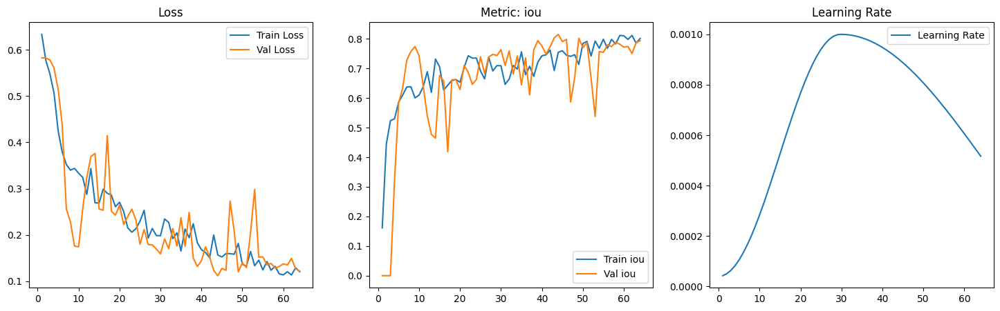

In [278]:
plot_history(history)

In [279]:
preds, targets = test(
    model_class=lambda: UNet(),
    checkpoint_path="best_model.pth",
    test_loader=test_dataloader,
    loss_fn=tversky_loss
)

Test Loss: 0.1264


In [280]:
iou_score(preds.to(device), targets.to(device))

tensor(0.7965, device='cuda:0')

In [281]:
dice_score(preds.to(device), targets.to(device))

tensor(0.4787, device='cuda:0')

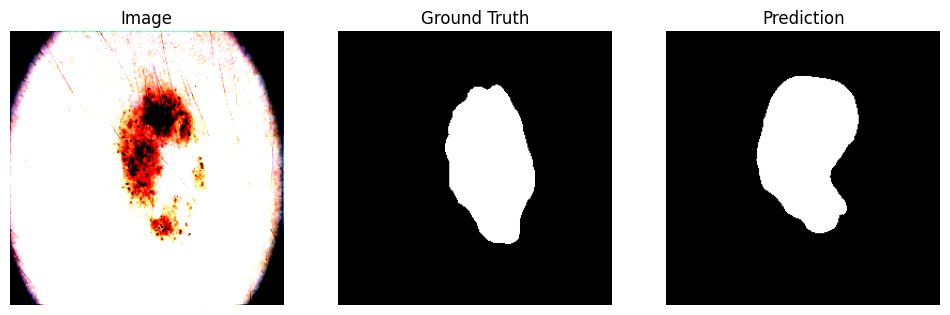

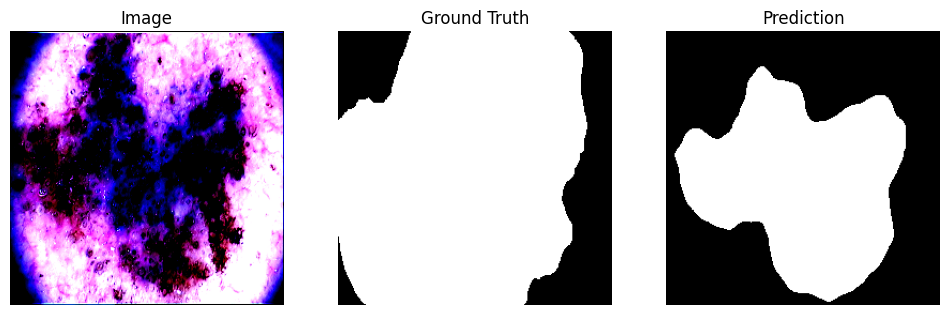

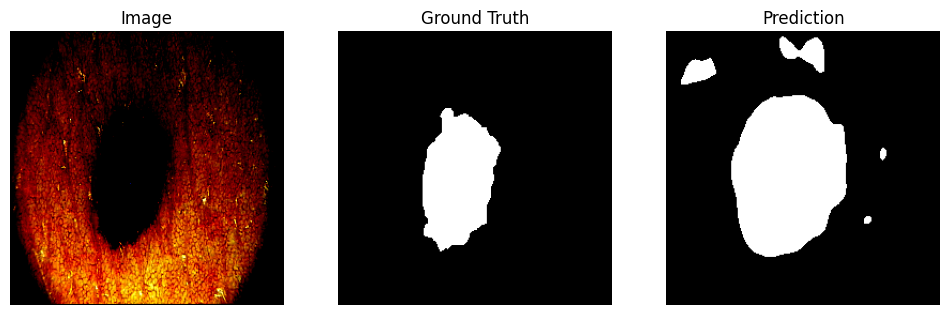

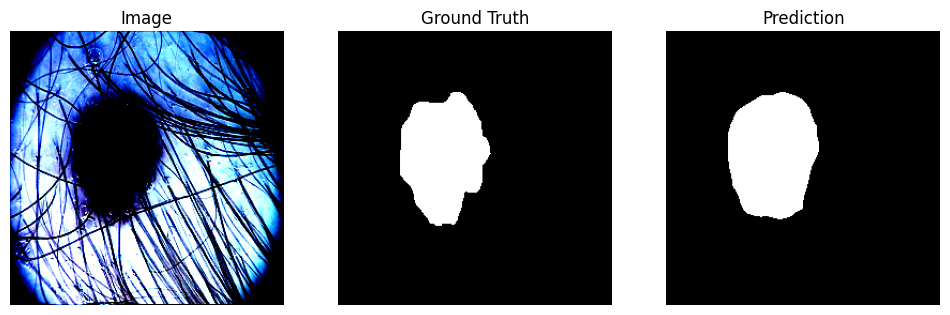

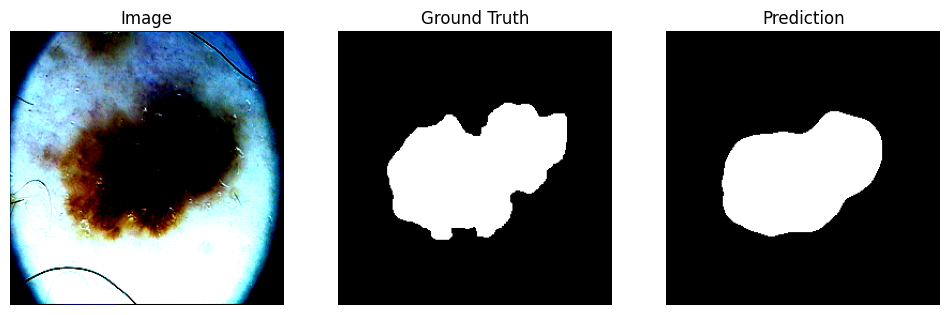

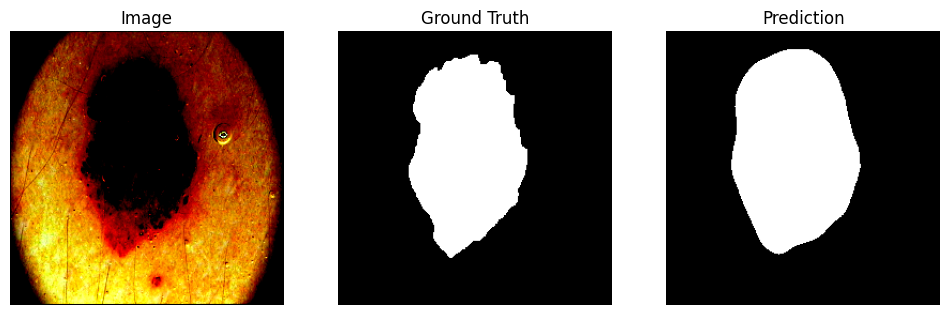

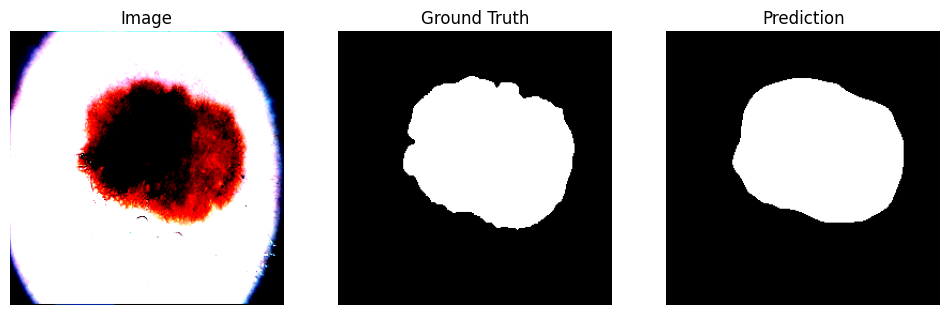

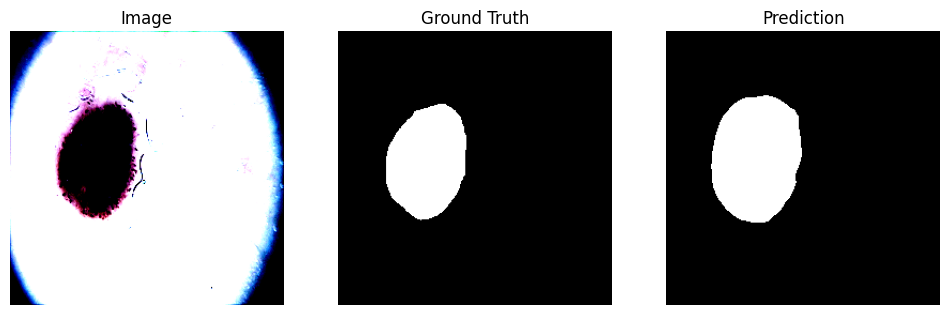

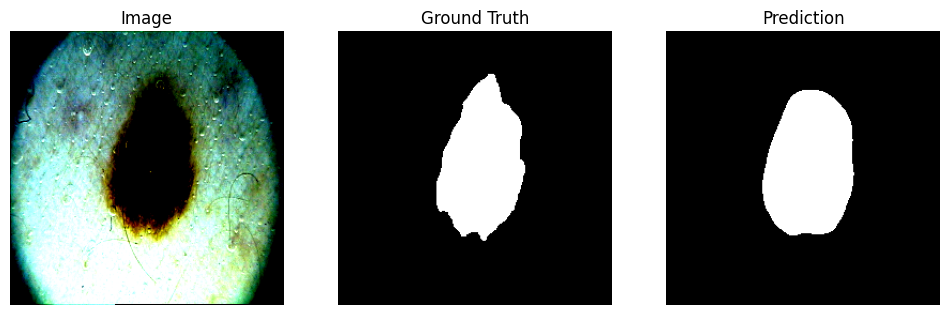

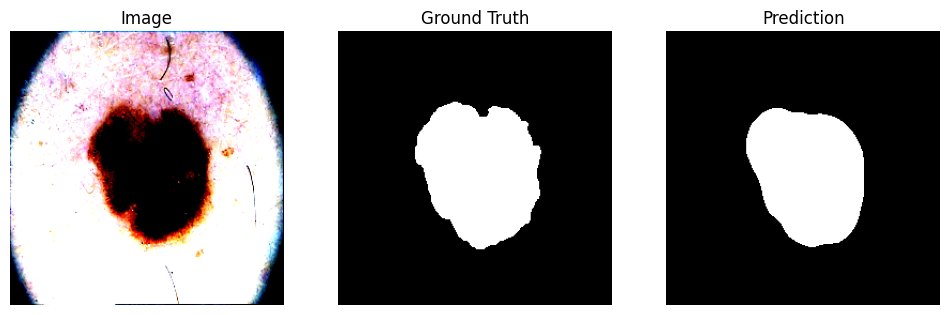

In [284]:
show_predictions(
    model_class=UNet,
    checkpoint_path="best_model.pth",
    dataloader=test_dataloader,
    device='cuda',
    num_batches=2,
    max_items=10
    )

# Focal loss

In [285]:
import torch
import gc

del unet_model
gc.collect()

torch.cuda.empty_cache()

In [286]:
unet_model = UNet().to(device)
unet_model, history = train(
    unet_model, train_dataloader, valid_dataloader, focal_loss,
    metrics={'iou': iou_score, 'dice': dice_score},
    num_epochs=100, lr=1e-3,
    scheduler_type='onecycle',
    patience=20
)

Epoch 1/100 | Train Loss: 0.1921 | Val Loss: 0.1789 | iou: train 0.4022, val 0.0000 | dice: train 0.4365, val 0.4337 | LR: 4.27e-05
  ↳ Saving best model (val loss inf → 0.1789)


Epoch 2/100 | Train Loss: 0.1626 | Val Loss: 0.1728 | iou: train 0.4482, val 0.3757 | dice: train 0.4437, val 0.4375 | LR: 5.07e-05
  ↳ Saving best model (val loss 0.1789 → 0.1728)


Epoch 3/100 | Train Loss: 0.1426 | Val Loss: 0.1651 | iou: train 0.4868, val 0.4495 | dice: train 0.4781, val 0.4467 | LR: 6.39e-05
  ↳ Saving best model (val loss 0.1728 → 0.1651)


Epoch 4/100 | Train Loss: 0.1382 | Val Loss: 0.1536 | iou: train 0.5548, val 0.5544 | dice: train 0.5063, val 0.4628 | LR: 8.22e-05
  ↳ Saving best model (val loss 0.1651 → 0.1536)


Epoch 5/100 | Train Loss: 0.1188 | Val Loss: 0.1386 | iou: train 0.5935, val 0.6424 | dice: train 0.5127, val 0.4864 | LR: 1.05e-04
  ↳ Saving best model (val loss 0.1536 → 0.1386)


Epoch 6/100 | Train Loss: 0.1307 | Val Loss: 0.1193 | iou: train 0.4995, val 0.6688 | dice: train 0.4874, val 0.5417 | LR: 1.33e-04
  ↳ Saving best model (val loss 0.1386 → 0.1193)


Epoch 7/100 | Train Loss: 0.1181 | Val Loss: 0.1296 | iou: train 0.5349, val 0.6034 | dice: train 0.4805, val 0.5125 | LR: 1.65e-04


Epoch 8/100 | Train Loss: 0.1071 | Val Loss: 0.1055 | iou: train 0.6143, val 0.6639 | dice: train 0.5085, val 0.5666 | LR: 2.01e-04
  ↳ Saving best model (val loss 0.1193 → 0.1055)


Epoch 9/100 | Train Loss: 0.1192 | Val Loss: 0.0967 | iou: train 0.5394, val 0.6696 | dice: train 0.5079, val 0.5919 | LR: 2.41e-04
  ↳ Saving best model (val loss 0.1055 → 0.0967)


Epoch 10/100 | Train Loss: 0.1056 | Val Loss: 0.1647 | iou: train 0.5916, val 0.4884 | dice: train 0.5219, val 0.5293 | LR: 2.84e-04


Epoch 11/100 | Train Loss: 0.1067 | Val Loss: 0.1445 | iou: train 0.6303, val 0.6949 | dice: train 0.5180, val 0.6931 | LR: 3.29e-04


Epoch 12/100 | Train Loss: 0.1154 | Val Loss: 0.1314 | iou: train 0.6003, val 0.6452 | dice: train 0.5046, val 0.6073 | LR: 3.77e-04


Epoch 13/100 | Train Loss: 0.0970 | Val Loss: 0.0823 | iou: train 0.6576, val 0.7204 | dice: train 0.5344, val 0.5800 | LR: 4.26e-04
  ↳ Saving best model (val loss 0.0967 → 0.0823)


Epoch 14/100 | Train Loss: 0.0911 | Val Loss: 0.1400 | iou: train 0.6699, val 0.5427 | dice: train 0.5160, val 0.5173 | LR: 4.76e-04


Epoch 15/100 | Train Loss: 0.0820 | Val Loss: 0.1108 | iou: train 0.6755, val 0.5879 | dice: train 0.5422, val 0.5984 | LR: 5.26e-04


Epoch 16/100 | Train Loss: 0.0956 | Val Loss: 0.3898 | iou: train 0.5985, val 0.4959 | dice: train 0.5103, val 0.6096 | LR: 5.77e-04


Epoch 17/100 | Train Loss: 0.0881 | Val Loss: 0.4492 | iou: train 0.6061, val 0.5219 | dice: train 0.5391, val 0.6243 | LR: 6.27e-04


Epoch 18/100 | Train Loss: 0.0804 | Val Loss: 0.1845 | iou: train 0.6237, val 0.5718 | dice: train 0.5375, val 0.6460 | LR: 6.76e-04


Epoch 19/100 | Train Loss: 0.0830 | Val Loss: 0.1962 | iou: train 0.6437, val 0.5206 | dice: train 0.5396, val 0.5961 | LR: 7.23e-04


Epoch 20/100 | Train Loss: 0.0928 | Val Loss: 0.1542 | iou: train 0.6063, val 0.6410 | dice: train 0.5636, val 0.6404 | LR: 7.67e-04


Epoch 21/100 | Train Loss: 0.0831 | Val Loss: 1.5170 | iou: train 0.6290, val 0.4928 | dice: train 0.5466, val 0.6056 | LR: 8.09e-04


Epoch 22/100 | Train Loss: 0.0787 | Val Loss: 1.7218 | iou: train 0.6770, val 0.3702 | dice: train 0.5817, val 0.5268 | LR: 8.48e-04


Epoch 23/100 | Train Loss: 0.0909 | Val Loss: 0.2707 | iou: train 0.6508, val 0.4216 | dice: train 0.5665, val 0.5212 | LR: 8.83e-04


Epoch 24/100 | Train Loss: 0.0700 | Val Loss: 0.5152 | iou: train 0.6832, val 0.3882 | dice: train 0.5622, val 0.4628 | LR: 9.14e-04


Epoch 25/100 | Train Loss: 0.0771 | Val Loss: 0.1932 | iou: train 0.6415, val 0.5657 | dice: train 0.5389, val 0.6155 | LR: 9.41e-04


Epoch 26/100 | Train Loss: 0.0941 | Val Loss: 0.1124 | iou: train 0.5798, val 0.6753 | dice: train 0.5364, val 0.6827 | LR: 9.63e-04


Epoch 27/100 | Train Loss: 0.0905 | Val Loss: 0.0702 | iou: train 0.6285, val 0.7347 | dice: train 0.5184, val 0.6275 | LR: 9.80e-04
  ↳ Saving best model (val loss 0.0823 → 0.0702)


Epoch 28/100 | Train Loss: 0.0927 | Val Loss: 0.1298 | iou: train 0.6247, val 0.5136 | dice: train 0.5152, val 0.5398 | LR: 9.92e-04


Epoch 29/100 | Train Loss: 0.0936 | Val Loss: 0.0863 | iou: train 0.5631, val 0.6910 | dice: train 0.4706, val 0.5843 | LR: 9.98e-04


Epoch 30/100 | Train Loss: 0.0783 | Val Loss: 0.0769 | iou: train 0.6214, val 0.7083 | dice: train 0.5114, val 0.6112 | LR: 1.00e-03


Epoch 31/100 | Train Loss: 0.0748 | Val Loss: 0.1289 | iou: train 0.6195, val 0.6042 | dice: train 0.5491, val 0.6320 | LR: 9.99e-04


Epoch 32/100 | Train Loss: 0.0726 | Val Loss: 0.0694 | iou: train 0.7040, val 0.7424 | dice: train 0.5836, val 0.6772 | LR: 9.97e-04
  ↳ Saving best model (val loss 0.0702 → 0.0694)


Epoch 33/100 | Train Loss: 0.0839 | Val Loss: 0.1013 | iou: train 0.6704, val 0.7058 | dice: train 0.5741, val 0.6927 | LR: 9.95e-04


Epoch 34/100 | Train Loss: 0.0791 | Val Loss: 0.8930 | iou: train 0.6684, val 0.4615 | dice: train 0.5593, val 0.5950 | LR: 9.91e-04


Epoch 35/100 | Train Loss: 0.0901 | Val Loss: 0.0958 | iou: train 0.5795, val 0.6770 | dice: train 0.5403, val 0.6418 | LR: 9.86e-04


Epoch 36/100 | Train Loss: 0.0838 | Val Loss: 0.1045 | iou: train 0.6761, val 0.6217 | dice: train 0.5532, val 0.6168 | LR: 9.80e-04


Epoch 37/100 | Train Loss: 0.0848 | Val Loss: 0.1104 | iou: train 0.6329, val 0.7037 | dice: train 0.5446, val 0.6804 | LR: 9.74e-04


Epoch 38/100 | Train Loss: 0.0825 | Val Loss: 0.1007 | iou: train 0.6646, val 0.6706 | dice: train 0.5506, val 0.6399 | LR: 9.66e-04


Epoch 39/100 | Train Loss: 0.0756 | Val Loss: 0.0808 | iou: train 0.6603, val 0.6769 | dice: train 0.5498, val 0.6252 | LR: 9.58e-04


Epoch 40/100 | Train Loss: 0.0682 | Val Loss: 0.0659 | iou: train 0.6862, val 0.7502 | dice: train 0.5374, val 0.6418 | LR: 9.48e-04
  ↳ Saving best model (val loss 0.0694 → 0.0659)


Epoch 41/100 | Train Loss: 0.0753 | Val Loss: 0.1796 | iou: train 0.6795, val 0.4813 | dice: train 0.5721, val 0.5488 | LR: 9.38e-04


Epoch 42/100 | Train Loss: 0.0700 | Val Loss: 0.0621 | iou: train 0.7206, val 0.7719 | dice: train 0.5934, val 0.7004 | LR: 9.26e-04
  ↳ Saving best model (val loss 0.0659 → 0.0621)


Epoch 43/100 | Train Loss: 0.0684 | Val Loss: 0.0669 | iou: train 0.7074, val 0.7606 | dice: train 0.5757, val 0.6619 | LR: 9.14e-04


Epoch 44/100 | Train Loss: 0.0912 | Val Loss: 0.0631 | iou: train 0.6707, val 0.7453 | dice: train 0.5862, val 0.6427 | LR: 9.01e-04


Epoch 45/100 | Train Loss: 0.0672 | Val Loss: 0.0753 | iou: train 0.6949, val 0.7111 | dice: train 0.5740, val 0.6338 | LR: 8.87e-04


Epoch 46/100 | Train Loss: 0.0765 | Val Loss: 0.0672 | iou: train 0.6440, val 0.7475 | dice: train 0.5204, val 0.6651 | LR: 8.73e-04


Epoch 47/100 | Train Loss: 0.0721 | Val Loss: 0.0612 | iou: train 0.6728, val 0.7548 | dice: train 0.5452, val 0.6234 | LR: 8.57e-04
  ↳ Saving best model (val loss 0.0621 → 0.0612)


Epoch 48/100 | Train Loss: 0.0810 | Val Loss: 0.0734 | iou: train 0.6588, val 0.7257 | dice: train 0.5644, val 0.6048 | LR: 8.41e-04


Epoch 49/100 | Train Loss: 0.0686 | Val Loss: 0.0746 | iou: train 0.6912, val 0.7244 | dice: train 0.5473, val 0.6158 | LR: 8.25e-04


Epoch 50/100 | Train Loss: 0.0716 | Val Loss: 0.0620 | iou: train 0.7025, val 0.7497 | dice: train 0.5837, val 0.6303 | LR: 8.07e-04


Epoch 51/100 | Train Loss: 0.0602 | Val Loss: 0.0577 | iou: train 0.7220, val 0.7752 | dice: train 0.5592, val 0.6679 | LR: 7.89e-04
  ↳ Saving best model (val loss 0.0612 → 0.0577)


Epoch 52/100 | Train Loss: 0.0580 | Val Loss: 0.0582 | iou: train 0.7421, val 0.7699 | dice: train 0.6054, val 0.6677 | LR: 7.71e-04


Epoch 53/100 | Train Loss: 0.0672 | Val Loss: 0.0596 | iou: train 0.7056, val 0.7554 | dice: train 0.5962, val 0.6561 | LR: 7.52e-04


Epoch 54/100 | Train Loss: 0.0710 | Val Loss: 0.0615 | iou: train 0.6945, val 0.7482 | dice: train 0.5921, val 0.6517 | LR: 7.32e-04


Epoch 55/100 | Train Loss: 0.0658 | Val Loss: 0.0641 | iou: train 0.7394, val 0.7641 | dice: train 0.6060, val 0.6506 | LR: 7.12e-04


Epoch 56/100 | Train Loss: 0.0581 | Val Loss: 0.0647 | iou: train 0.7453, val 0.7754 | dice: train 0.5957, val 0.6395 | LR: 6.91e-04


Epoch 57/100 | Train Loss: 0.0561 | Val Loss: 0.0598 | iou: train 0.7658, val 0.7767 | dice: train 0.6105, val 0.6462 | LR: 6.70e-04


Epoch 58/100 | Train Loss: 0.0651 | Val Loss: 0.0566 | iou: train 0.7600, val 0.7762 | dice: train 0.6276, val 0.6586 | LR: 6.49e-04
  ↳ Saving best model (val loss 0.0577 → 0.0566)


Epoch 59/100 | Train Loss: 0.0579 | Val Loss: 0.0556 | iou: train 0.7106, val 0.7901 | dice: train 0.6020, val 0.6865 | LR: 6.28e-04
  ↳ Saving best model (val loss 0.0566 → 0.0556)


Epoch 60/100 | Train Loss: 0.0732 | Val Loss: 0.0608 | iou: train 0.7105, val 0.7824 | dice: train 0.6223, val 0.6994 | LR: 6.06e-04


Epoch 61/100 | Train Loss: 0.0618 | Val Loss: 0.0606 | iou: train 0.7380, val 0.7773 | dice: train 0.6114, val 0.6719 | LR: 5.84e-04


Epoch 62/100 | Train Loss: 0.0572 | Val Loss: 0.0647 | iou: train 0.7586, val 0.7573 | dice: train 0.6168, val 0.6519 | LR: 5.62e-04


Epoch 63/100 | Train Loss: 0.0507 | Val Loss: 0.0547 | iou: train 0.7857, val 0.7894 | dice: train 0.6044, val 0.6713 | LR: 5.39e-04
  ↳ Saving best model (val loss 0.0556 → 0.0547)


Epoch 64/100 | Train Loss: 0.0474 | Val Loss: 0.0534 | iou: train 0.7843, val 0.7927 | dice: train 0.6359, val 0.6695 | LR: 5.17e-04
  ↳ Saving best model (val loss 0.0547 → 0.0534)


Epoch 65/100 | Train Loss: 0.0540 | Val Loss: 0.0538 | iou: train 0.7802, val 0.7924 | dice: train 0.6456, val 0.6700 | LR: 4.94e-04


Epoch 66/100 | Train Loss: 0.0423 | Val Loss: 0.0524 | iou: train 0.8278, val 0.7925 | dice: train 0.6523, val 0.6769 | LR: 4.72e-04
  ↳ Saving best model (val loss 0.0534 → 0.0524)


Epoch 67/100 | Train Loss: 0.0524 | Val Loss: 0.0519 | iou: train 0.7791, val 0.7878 | dice: train 0.6452, val 0.6827 | LR: 4.50e-04
  ↳ Saving best model (val loss 0.0524 → 0.0519)


Epoch 68/100 | Train Loss: 0.0697 | Val Loss: 0.0521 | iou: train 0.7355, val 0.7849 | dice: train 0.6299, val 0.6863 | LR: 4.27e-04


Epoch 69/100 | Train Loss: 0.0600 | Val Loss: 0.0546 | iou: train 0.7925, val 0.7867 | dice: train 0.6581, val 0.6701 | LR: 4.05e-04


Epoch 70/100 | Train Loss: 0.0531 | Val Loss: 0.0571 | iou: train 0.7523, val 0.7720 | dice: train 0.6271, val 0.6626 | LR: 3.83e-04


Epoch 71/100 | Train Loss: 0.0476 | Val Loss: 0.0677 | iou: train 0.7906, val 0.7324 | dice: train 0.6337, val 0.6504 | LR: 3.62e-04


Epoch 72/100 | Train Loss: 0.0534 | Val Loss: 0.0686 | iou: train 0.7572, val 0.7337 | dice: train 0.6073, val 0.6566 | LR: 3.40e-04


Epoch 73/100 | Train Loss: 0.0591 | Val Loss: 0.0568 | iou: train 0.7310, val 0.7797 | dice: train 0.6064, val 0.6834 | LR: 3.19e-04


Epoch 74/100 | Train Loss: 0.0647 | Val Loss: 0.0572 | iou: train 0.7197, val 0.7785 | dice: train 0.6182, val 0.6772 | LR: 2.98e-04


Epoch 75/100 | Train Loss: 0.0504 | Val Loss: 0.0626 | iou: train 0.7550, val 0.7554 | dice: train 0.6007, val 0.6686 | LR: 2.78e-04


Epoch 76/100 | Train Loss: 0.0585 | Val Loss: 0.0599 | iou: train 0.7497, val 0.7673 | dice: train 0.6300, val 0.6782 | LR: 2.58e-04


Epoch 77/100 | Train Loss: 0.0473 | Val Loss: 0.0550 | iou: train 0.7789, val 0.7869 | dice: train 0.6109, val 0.6855 | LR: 2.39e-04


Epoch 78/100 | Train Loss: 0.0473 | Val Loss: 0.0520 | iou: train 0.7712, val 0.8036 | dice: train 0.5925, val 0.6844 | LR: 2.20e-04


Epoch 79/100 | Train Loss: 0.0563 | Val Loss: 0.0530 | iou: train 0.7633, val 0.7940 | dice: train 0.6489, val 0.6796 | LR: 2.02e-04


Epoch 80/100 | Train Loss: 0.0484 | Val Loss: 0.0531 | iou: train 0.7581, val 0.7971 | dice: train 0.6082, val 0.6763 | LR: 1.84e-04


Epoch 81/100 | Train Loss: 0.0409 | Val Loss: 0.0541 | iou: train 0.8157, val 0.7892 | dice: train 0.6426, val 0.6717 | LR: 1.67e-04


Epoch 82/100 | Train Loss: 0.0411 | Val Loss: 0.0539 | iou: train 0.8183, val 0.7902 | dice: train 0.6352, val 0.6718 | LR: 1.50e-04


Epoch 83/100 | Train Loss: 0.0517 | Val Loss: 0.0532 | iou: train 0.7797, val 0.7930 | dice: train 0.6352, val 0.6777 | LR: 1.35e-04


Epoch 84/100 | Train Loss: 0.0608 | Val Loss: 0.0525 | iou: train 0.7569, val 0.7922 | dice: train 0.6464, val 0.6905 | LR: 1.20e-04


Epoch 85/100 | Train Loss: 0.0533 | Val Loss: 0.0509 | iou: train 0.7246, val 0.8048 | dice: train 0.5961, val 0.6994 | LR: 1.06e-04
  ↳ Saving best model (val loss 0.0519 → 0.0509)


Epoch 86/100 | Train Loss: 0.0416 | Val Loss: 0.0512 | iou: train 0.8254, val 0.8061 | dice: train 0.6569, val 0.6960 | LR: 9.22e-05


Epoch 87/100 | Train Loss: 0.0514 | Val Loss: 0.0510 | iou: train 0.7859, val 0.8081 | dice: train 0.6432, val 0.6944 | LR: 7.97e-05


Epoch 88/100 | Train Loss: 0.0476 | Val Loss: 0.0506 | iou: train 0.7593, val 0.8098 | dice: train 0.6006, val 0.6942 | LR: 6.79e-05
  ↳ Saving best model (val loss 0.0509 → 0.0506)


Epoch 89/100 | Train Loss: 0.0418 | Val Loss: 0.0504 | iou: train 0.8144, val 0.8090 | dice: train 0.6516, val 0.6926 | LR: 5.71e-05
  ↳ Saving best model (val loss 0.0506 → 0.0504)


Epoch 90/100 | Train Loss: 0.0386 | Val Loss: 0.0506 | iou: train 0.8362, val 0.8064 | dice: train 0.6588, val 0.6891 | LR: 4.71e-05


Epoch 91/100 | Train Loss: 0.0490 | Val Loss: 0.0514 | iou: train 0.7326, val 0.8010 | dice: train 0.5924, val 0.6887 | LR: 3.81e-05


Epoch 92/100 | Train Loss: 0.0410 | Val Loss: 0.0514 | iou: train 0.8172, val 0.8004 | dice: train 0.6497, val 0.6855 | LR: 2.99e-05


Epoch 93/100 | Train Loss: 0.0445 | Val Loss: 0.0523 | iou: train 0.8059, val 0.7959 | dice: train 0.6562, val 0.6849 | LR: 2.28e-05


Epoch 94/100 | Train Loss: 0.0473 | Val Loss: 0.0517 | iou: train 0.7900, val 0.8008 | dice: train 0.6319, val 0.6874 | LR: 1.66e-05


Epoch 95/100 | Train Loss: 0.0489 | Val Loss: 0.0519 | iou: train 0.7859, val 0.7985 | dice: train 0.6528, val 0.6877 | LR: 1.13e-05


Epoch 96/100 | Train Loss: 0.0462 | Val Loss: 0.0508 | iou: train 0.7596, val 0.8054 | dice: train 0.5882, val 0.6902 | LR: 7.07e-06


Epoch 97/100 | Train Loss: 0.0410 | Val Loss: 0.0506 | iou: train 0.8113, val 0.8048 | dice: train 0.6275, val 0.6905 | LR: 3.81e-06


Epoch 98/100 | Train Loss: 0.0389 | Val Loss: 0.0511 | iou: train 0.8307, val 0.8020 | dice: train 0.6557, val 0.6879 | LR: 1.55e-06


Epoch 99/100 | Train Loss: 0.0434 | Val Loss: 0.0513 | iou: train 0.7980, val 0.7997 | dice: train 0.6299, val 0.6878 | LR: 2.87e-07


Epoch 100/100 | Train Loss: 0.0460 | Val Loss: 0.0522 | iou: train 0.7889, val 0.7964 | dice: train 0.6530, val 0.6875 | LR: 3.55e-08


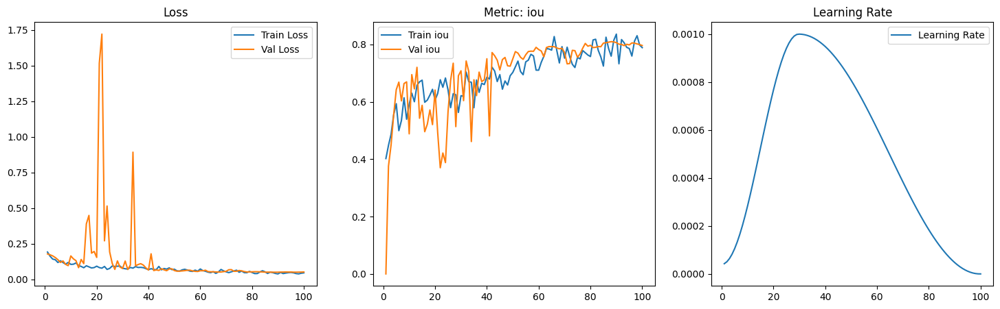

In [287]:
plot_history(history)

In [291]:
preds, targets = test(
    model_class=lambda: UNet(),
    checkpoint_path="best_model.pth",
    test_loader=test_dataloader,
    loss_fn=tversky_loss
)

Test Loss: 0.3313


In [292]:
iou_score(preds.to(device), targets.to(device))

tensor(0.8379, device='cuda:0')

In [293]:
dice_score(preds.to(device), targets.to(device))

tensor(0.4826, device='cuda:0')

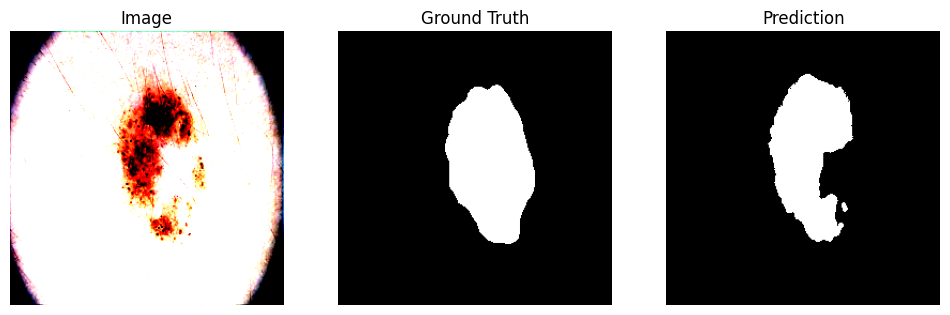

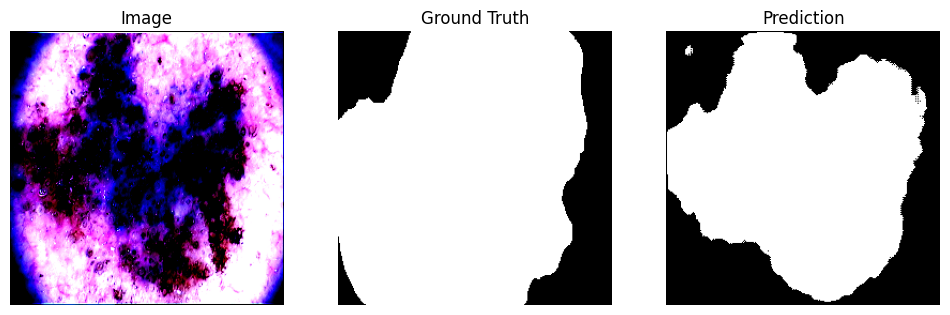

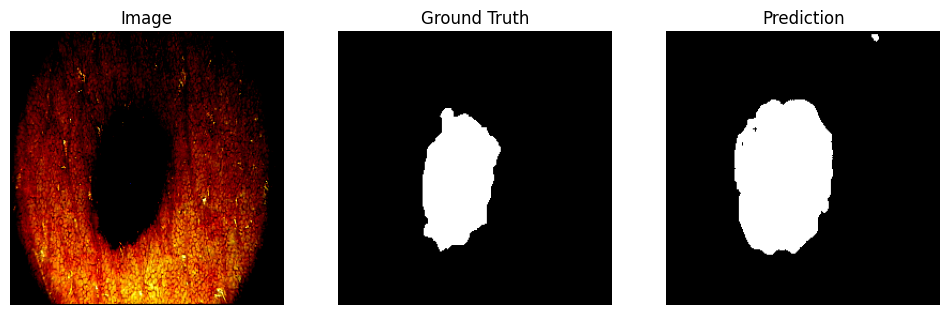

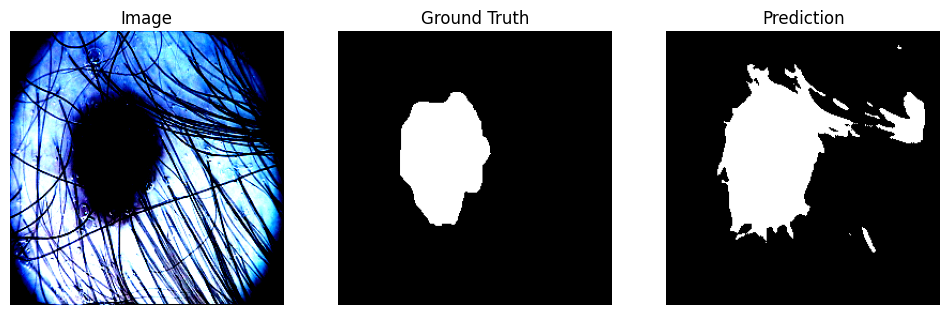

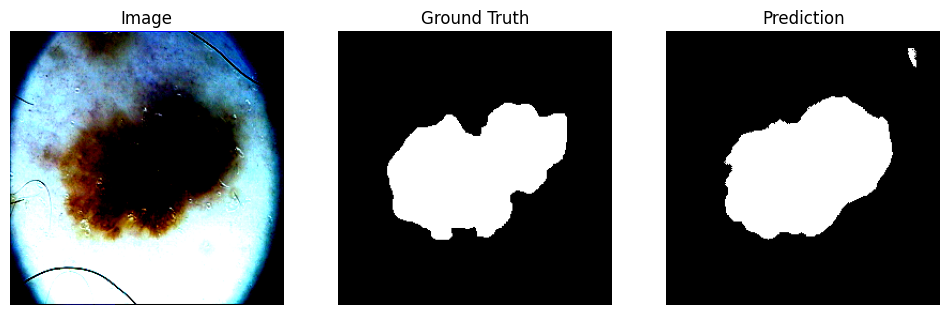

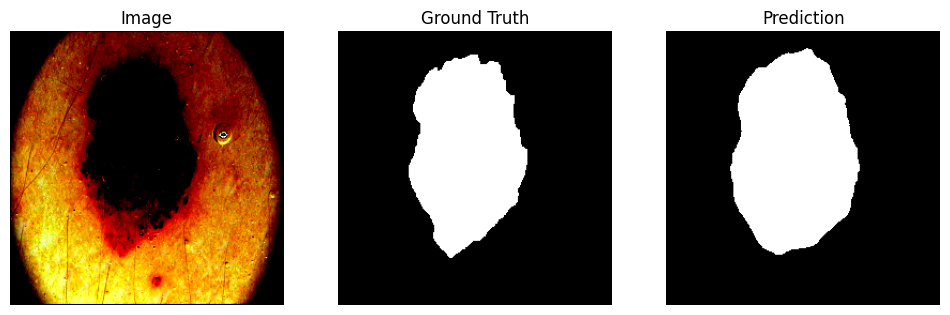

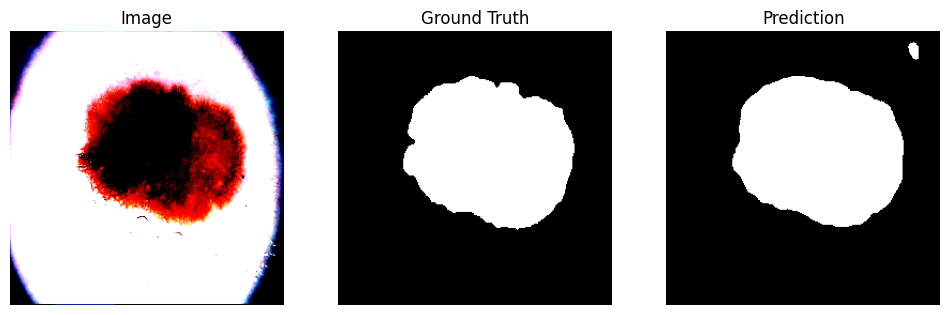

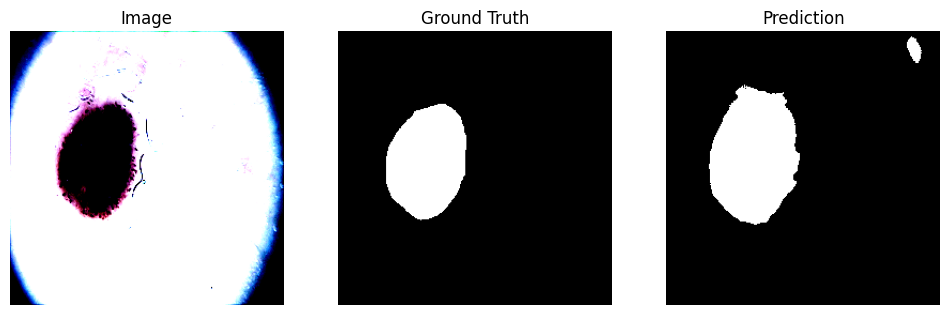

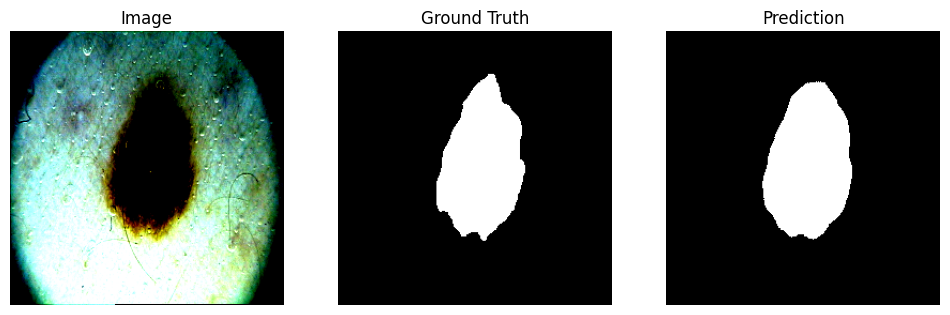

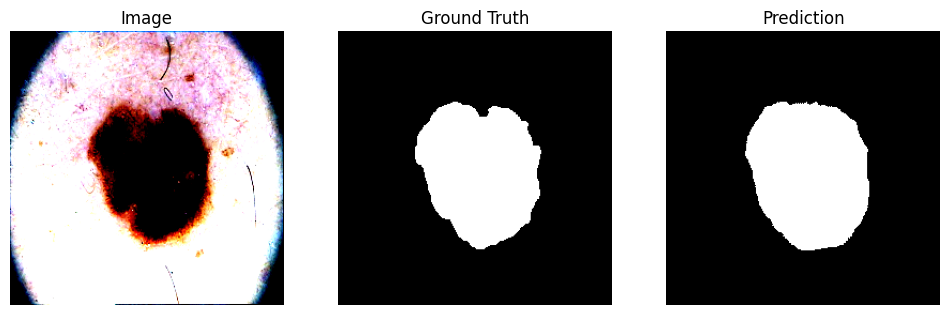

In [294]:
show_predictions(
    model_class=UNet,
    checkpoint_path="best_model.pth",
    dataloader=test_dataloader,
    device='cuda',
    num_batches=2,
    max_items=10
    )

# tversky focal loss

In [305]:
import torch
import gc

del segnet_model
gc.collect()

torch.cuda.empty_cache()

In [307]:
unet_model = UNet().to(device)
unet_model, history = train(
    unet_model, train_dataloader, valid_dataloader, tversky_focal_loss,
    metrics={'iou': iou_score, 'dice': dice_score},
    num_epochs=100, lr=1e-3,
    scheduler_type='onecycle',
    patience=20
)

Epoch 1/100 | Train Loss: 0.6473 | Val Loss: 0.5752 | iou: train 0.2857, val 0.0754 | dice: train 0.3527, val 0.4248 | LR: 4.27e-05
  ↳ Saving best model (val loss inf → 0.5752)


Epoch 2/100 | Train Loss: 0.5544 | Val Loss: 0.5666 | iou: train 0.4080, val 0.5829 | dice: train 0.4456, val 0.4334 | LR: 5.07e-05
  ↳ Saving best model (val loss 0.5752 → 0.5666)


Epoch 3/100 | Train Loss: 0.5380 | Val Loss: 0.5507 | iou: train 0.4244, val 0.5775 | dice: train 0.4620, val 0.4493 | LR: 6.39e-05
  ↳ Saving best model (val loss 0.5666 → 0.5507)


Epoch 4/100 | Train Loss: 0.4948 | Val Loss: 0.5227 | iou: train 0.4372, val 0.6039 | dice: train 0.5052, val 0.4773 | LR: 8.22e-05
  ↳ Saving best model (val loss 0.5507 → 0.5227)


Epoch 5/100 | Train Loss: 0.4185 | Val Loss: 0.4670 | iou: train 0.5633, val 0.6233 | dice: train 0.5815, val 0.5330 | LR: 1.05e-04
  ↳ Saving best model (val loss 0.5227 → 0.4670)


Epoch 6/100 | Train Loss: 0.4480 | Val Loss: 0.3736 | iou: train 0.4925, val 0.6275 | dice: train 0.5520, val 0.6264 | LR: 1.33e-04
  ↳ Saving best model (val loss 0.4670 → 0.3736)


Epoch 7/100 | Train Loss: 0.3862 | Val Loss: 0.3102 | iou: train 0.6090, val 0.6837 | dice: train 0.6138, val 0.6898 | LR: 1.65e-04
  ↳ Saving best model (val loss 0.3736 → 0.3102)


Epoch 8/100 | Train Loss: 0.3817 | Val Loss: 0.2549 | iou: train 0.5858, val 0.7178 | dice: train 0.6183, val 0.7451 | LR: 2.01e-04
  ↳ Saving best model (val loss 0.3102 → 0.2549)


Epoch 9/100 | Train Loss: 0.3959 | Val Loss: 0.3597 | iou: train 0.6075, val 0.4965 | dice: train 0.6041, val 0.6403 | LR: 2.41e-04


Epoch 10/100 | Train Loss: 0.3788 | Val Loss: 0.2380 | iou: train 0.5973, val 0.7125 | dice: train 0.6212, val 0.7620 | LR: 2.84e-04
  ↳ Saving best model (val loss 0.2549 → 0.2380)


Epoch 11/100 | Train Loss: 0.3573 | Val Loss: 0.2402 | iou: train 0.6316, val 0.7120 | dice: train 0.6427, val 0.7598 | LR: 3.29e-04


Epoch 12/100 | Train Loss: 0.2977 | Val Loss: 0.2388 | iou: train 0.7173, val 0.7090 | dice: train 0.7023, val 0.7612 | LR: 3.77e-04


Epoch 13/100 | Train Loss: 0.3682 | Val Loss: 0.2363 | iou: train 0.5737, val 0.7102 | dice: train 0.6318, val 0.7637 | LR: 4.26e-04
  ↳ Saving best model (val loss 0.2380 → 0.2363)


Epoch 14/100 | Train Loss: 0.3320 | Val Loss: 0.2699 | iou: train 0.6369, val 0.6606 | dice: train 0.6680, val 0.7301 | LR: 4.76e-04


Epoch 15/100 | Train Loss: 0.3716 | Val Loss: 0.2396 | iou: train 0.5864, val 0.7269 | dice: train 0.6284, val 0.7604 | LR: 5.26e-04


Epoch 16/100 | Train Loss: 0.3060 | Val Loss: 0.2576 | iou: train 0.7041, val 0.7096 | dice: train 0.6940, val 0.7424 | LR: 5.77e-04


Epoch 17/100 | Train Loss: 0.3433 | Val Loss: 0.2385 | iou: train 0.5929, val 0.7123 | dice: train 0.6567, val 0.7615 | LR: 6.27e-04


Epoch 18/100 | Train Loss: 0.3356 | Val Loss: 0.2068 | iou: train 0.5787, val 0.7335 | dice: train 0.6644, val 0.7932 | LR: 6.76e-04
  ↳ Saving best model (val loss 0.2363 → 0.2068)


Epoch 19/100 | Train Loss: 0.3499 | Val Loss: 0.3253 | iou: train 0.5596, val 0.5459 | dice: train 0.6501, val 0.6747 | LR: 7.23e-04


Epoch 20/100 | Train Loss: 0.3209 | Val Loss: 0.3647 | iou: train 0.6236, val 0.4845 | dice: train 0.6791, val 0.6353 | LR: 7.67e-04


Epoch 21/100 | Train Loss: 0.2688 | Val Loss: 0.3976 | iou: train 0.7043, val 0.4425 | dice: train 0.7312, val 0.6024 | LR: 8.09e-04


Epoch 22/100 | Train Loss: 0.2613 | Val Loss: 0.2087 | iou: train 0.6900, val 0.7457 | dice: train 0.7387, val 0.7913 | LR: 8.48e-04


Epoch 23/100 | Train Loss: 0.2796 | Val Loss: 0.2545 | iou: train 0.6679, val 0.6492 | dice: train 0.7204, val 0.7455 | LR: 8.83e-04


Epoch 24/100 | Train Loss: 0.2714 | Val Loss: 0.2448 | iou: train 0.6749, val 0.6691 | dice: train 0.7286, val 0.7552 | LR: 9.14e-04


Epoch 25/100 | Train Loss: 0.3012 | Val Loss: 0.2345 | iou: train 0.6431, val 0.7129 | dice: train 0.6988, val 0.7655 | LR: 9.41e-04


Epoch 26/100 | Train Loss: 0.2483 | Val Loss: 0.1971 | iou: train 0.6956, val 0.7609 | dice: train 0.7517, val 0.8029 | LR: 9.63e-04
  ↳ Saving best model (val loss 0.2068 → 0.1971)


Epoch 27/100 | Train Loss: 0.2308 | Val Loss: 0.2153 | iou: train 0.6965, val 0.7491 | dice: train 0.7692, val 0.7847 | LR: 9.80e-04


Epoch 28/100 | Train Loss: 0.2532 | Val Loss: 0.3193 | iou: train 0.6722, val 0.5725 | dice: train 0.7468, val 0.6807 | LR: 9.92e-04


Epoch 29/100 | Train Loss: 0.2598 | Val Loss: 0.2828 | iou: train 0.6737, val 0.6109 | dice: train 0.7402, val 0.7172 | LR: 9.98e-04


Epoch 30/100 | Train Loss: 0.2257 | Val Loss: 0.2133 | iou: train 0.6996, val 0.6943 | dice: train 0.7743, val 0.7867 | LR: 1.00e-03


Epoch 31/100 | Train Loss: 0.2564 | Val Loss: 0.2241 | iou: train 0.6358, val 0.6767 | dice: train 0.7436, val 0.7759 | LR: 9.99e-04


Epoch 32/100 | Train Loss: 0.2077 | Val Loss: 0.2655 | iou: train 0.7228, val 0.6212 | dice: train 0.7922, val 0.7345 | LR: 9.97e-04


Epoch 33/100 | Train Loss: 0.2412 | Val Loss: 0.2227 | iou: train 0.6641, val 0.6782 | dice: train 0.7588, val 0.7773 | LR: 9.95e-04


Epoch 34/100 | Train Loss: 0.2873 | Val Loss: 0.2566 | iou: train 0.6087, val 0.6222 | dice: train 0.7127, val 0.7434 | LR: 9.91e-04


Epoch 35/100 | Train Loss: 0.2159 | Val Loss: 0.1880 | iou: train 0.7058, val 0.7362 | dice: train 0.7841, val 0.8120 | LR: 9.86e-04
  ↳ Saving best model (val loss 0.1971 → 0.1880)


Epoch 36/100 | Train Loss: 0.2095 | Val Loss: 0.1797 | iou: train 0.7132, val 0.7516 | dice: train 0.7905, val 0.8203 | LR: 9.80e-04
  ↳ Saving best model (val loss 0.1880 → 0.1797)


Epoch 37/100 | Train Loss: 0.2333 | Val Loss: 0.1583 | iou: train 0.6704, val 0.7758 | dice: train 0.7667, val 0.8417 | LR: 9.74e-04
  ↳ Saving best model (val loss 0.1797 → 0.1583)


Epoch 38/100 | Train Loss: 0.2469 | Val Loss: 0.2259 | iou: train 0.6492, val 0.6619 | dice: train 0.7531, val 0.7741 | LR: 9.66e-04


Epoch 39/100 | Train Loss: 0.2016 | Val Loss: 0.1621 | iou: train 0.7060, val 0.7530 | dice: train 0.7984, val 0.8379 | LR: 9.58e-04


Epoch 40/100 | Train Loss: 0.2811 | Val Loss: 0.1529 | iou: train 0.6058, val 0.7670 | dice: train 0.7189, val 0.8471 | LR: 9.48e-04
  ↳ Saving best model (val loss 0.1583 → 0.1529)


Epoch 41/100 | Train Loss: 0.2294 | Val Loss: 0.2410 | iou: train 0.6776, val 0.6338 | dice: train 0.7706, val 0.7590 | LR: 9.38e-04


Epoch 42/100 | Train Loss: 0.2429 | Val Loss: 0.2083 | iou: train 0.6729, val 0.6854 | dice: train 0.7571, val 0.7917 | LR: 9.26e-04


Epoch 43/100 | Train Loss: 0.1746 | Val Loss: 0.3072 | iou: train 0.7433, val 0.5392 | dice: train 0.8254, val 0.6928 | LR: 9.14e-04


Epoch 44/100 | Train Loss: 0.1577 | Val Loss: 0.1687 | iou: train 0.7633, val 0.7383 | dice: train 0.8423, val 0.8312 | LR: 9.01e-04


Epoch 45/100 | Train Loss: 0.1622 | Val Loss: 0.1263 | iou: train 0.7528, val 0.8037 | dice: train 0.8378, val 0.8737 | LR: 8.87e-04
  ↳ Saving best model (val loss 0.1529 → 0.1263)


Epoch 46/100 | Train Loss: 0.1661 | Val Loss: 0.1308 | iou: train 0.7442, val 0.7963 | dice: train 0.8339, val 0.8692 | LR: 8.73e-04


Epoch 47/100 | Train Loss: 0.1816 | Val Loss: 0.1386 | iou: train 0.7180, val 0.7828 | dice: train 0.8184, val 0.8614 | LR: 8.57e-04


Epoch 48/100 | Train Loss: 0.1789 | Val Loss: 0.1383 | iou: train 0.7319, val 0.7831 | dice: train 0.8211, val 0.8617 | LR: 8.41e-04


Epoch 49/100 | Train Loss: 0.1890 | Val Loss: 0.1569 | iou: train 0.7090, val 0.7517 | dice: train 0.8110, val 0.8431 | LR: 8.25e-04


Epoch 50/100 | Train Loss: 0.2242 | Val Loss: 0.1642 | iou: train 0.6705, val 0.7391 | dice: train 0.7758, val 0.8357 | LR: 8.07e-04


Epoch 51/100 | Train Loss: 0.1954 | Val Loss: 0.1439 | iou: train 0.7034, val 0.7761 | dice: train 0.8046, val 0.8561 | LR: 7.89e-04


Epoch 52/100 | Train Loss: 0.1575 | Val Loss: 0.1355 | iou: train 0.7521, val 0.7904 | dice: train 0.8425, val 0.8645 | LR: 7.71e-04


Epoch 53/100 | Train Loss: 0.1924 | Val Loss: 0.1376 | iou: train 0.7143, val 0.7856 | dice: train 0.8076, val 0.8624 | LR: 7.52e-04


Epoch 54/100 | Train Loss: 0.1364 | Val Loss: 0.1338 | iou: train 0.7988, val 0.7907 | dice: train 0.8636, val 0.8662 | LR: 7.32e-04


Epoch 55/100 | Train Loss: 0.1621 | Val Loss: 0.1475 | iou: train 0.7443, val 0.7639 | dice: train 0.8379, val 0.8525 | LR: 7.12e-04


Epoch 56/100 | Train Loss: 0.1223 | Val Loss: 0.1384 | iou: train 0.8050, val 0.7768 | dice: train 0.8777, val 0.8616 | LR: 6.91e-04


Epoch 57/100 | Train Loss: 0.1402 | Val Loss: 0.1314 | iou: train 0.7716, val 0.7868 | dice: train 0.8598, val 0.8686 | LR: 6.70e-04


Epoch 58/100 | Train Loss: 0.1372 | Val Loss: 0.1300 | iou: train 0.7813, val 0.7860 | dice: train 0.8628, val 0.8700 | LR: 6.49e-04


Epoch 59/100 | Train Loss: 0.1184 | Val Loss: 0.2078 | iou: train 0.8089, val 0.6670 | dice: train 0.8816, val 0.7922 | LR: 6.28e-04


Epoch 60/100 | Train Loss: 0.1682 | Val Loss: 0.1374 | iou: train 0.7398, val 0.7734 | dice: train 0.8318, val 0.8626 | LR: 6.06e-04


Epoch 61/100 | Train Loss: 0.1543 | Val Loss: 0.1230 | iou: train 0.7508, val 0.7968 | dice: train 0.8457, val 0.8770 | LR: 5.84e-04
  ↳ Saving best model (val loss 0.1263 → 0.1230)


Epoch 62/100 | Train Loss: 0.1583 | Val Loss: 0.1274 | iou: train 0.7519, val 0.7893 | dice: train 0.8417, val 0.8726 | LR: 5.62e-04


Epoch 63/100 | Train Loss: 0.1321 | Val Loss: 0.1455 | iou: train 0.7867, val 0.7589 | dice: train 0.8679, val 0.8545 | LR: 5.39e-04


Epoch 64/100 | Train Loss: 0.1118 | Val Loss: 0.1657 | iou: train 0.8198, val 0.7268 | dice: train 0.8882, val 0.8343 | LR: 5.17e-04


Epoch 65/100 | Train Loss: 0.1309 | Val Loss: 0.1248 | iou: train 0.7835, val 0.7901 | dice: train 0.8691, val 0.8752 | LR: 4.94e-04


Epoch 66/100 | Train Loss: 0.1181 | Val Loss: 0.1120 | iou: train 0.8069, val 0.8114 | dice: train 0.8819, val 0.8880 | LR: 4.72e-04
  ↳ Saving best model (val loss 0.1230 → 0.1120)


Epoch 67/100 | Train Loss: 0.1218 | Val Loss: 0.1172 | iou: train 0.8004, val 0.8034 | dice: train 0.8782, val 0.8828 | LR: 4.50e-04


Epoch 68/100 | Train Loss: 0.1476 | Val Loss: 0.1139 | iou: train 0.7636, val 0.8089 | dice: train 0.8524, val 0.8861 | LR: 4.27e-04


Epoch 69/100 | Train Loss: 0.1422 | Val Loss: 0.1346 | iou: train 0.7718, val 0.7758 | dice: train 0.8578, val 0.8654 | LR: 4.05e-04


Epoch 70/100 | Train Loss: 0.1299 | Val Loss: 0.1113 | iou: train 0.7890, val 0.8151 | dice: train 0.8701, val 0.8887 | LR: 3.83e-04
  ↳ Saving best model (val loss 0.1120 → 0.1113)


Epoch 71/100 | Train Loss: 0.1104 | Val Loss: 0.1105 | iou: train 0.8194, val 0.8168 | dice: train 0.8896, val 0.8895 | LR: 3.62e-04
  ↳ Saving best model (val loss 0.1113 → 0.1105)


Epoch 72/100 | Train Loss: 0.1328 | Val Loss: 0.1029 | iou: train 0.7850, val 0.8291 | dice: train 0.8672, val 0.8971 | LR: 3.40e-04
  ↳ Saving best model (val loss 0.1105 → 0.1029)


Epoch 73/100 | Train Loss: 0.1111 | Val Loss: 0.1077 | iou: train 0.8211, val 0.8208 | dice: train 0.8889, val 0.8923 | LR: 3.19e-04


Epoch 74/100 | Train Loss: 0.1141 | Val Loss: 0.1147 | iou: train 0.8132, val 0.8087 | dice: train 0.8859, val 0.8853 | LR: 2.98e-04


Epoch 75/100 | Train Loss: 0.1348 | Val Loss: 0.1104 | iou: train 0.7871, val 0.8159 | dice: train 0.8652, val 0.8896 | LR: 2.78e-04


Epoch 76/100 | Train Loss: 0.1087 | Val Loss: 0.1071 | iou: train 0.8239, val 0.8215 | dice: train 0.8913, val 0.8929 | LR: 2.58e-04


Epoch 77/100 | Train Loss: 0.1349 | Val Loss: 0.1060 | iou: train 0.7796, val 0.8231 | dice: train 0.8651, val 0.8940 | LR: 2.39e-04


Epoch 78/100 | Train Loss: 0.1407 | Val Loss: 0.1051 | iou: train 0.7694, val 0.8238 | dice: train 0.8593, val 0.8949 | LR: 2.20e-04


Epoch 79/100 | Train Loss: 0.1137 | Val Loss: 0.1051 | iou: train 0.8121, val 0.8234 | dice: train 0.8863, val 0.8949 | LR: 2.02e-04


Epoch 80/100 | Train Loss: 0.1372 | Val Loss: 0.1053 | iou: train 0.7810, val 0.8230 | dice: train 0.8628, val 0.8947 | LR: 1.84e-04


Epoch 81/100 | Train Loss: 0.1179 | Val Loss: 0.1072 | iou: train 0.8051, val 0.8201 | dice: train 0.8821, val 0.8928 | LR: 1.67e-04


Epoch 82/100 | Train Loss: 0.1017 | Val Loss: 0.1126 | iou: train 0.8312, val 0.8105 | dice: train 0.8983, val 0.8874 | LR: 1.50e-04


Epoch 83/100 | Train Loss: 0.1279 | Val Loss: 0.1112 | iou: train 0.7938, val 0.8128 | dice: train 0.8721, val 0.8888 | LR: 1.35e-04


Epoch 84/100 | Train Loss: 0.1229 | Val Loss: 0.1130 | iou: train 0.7964, val 0.8094 | dice: train 0.8771, val 0.8870 | LR: 1.20e-04


Epoch 85/100 | Train Loss: 0.1879 | Val Loss: 0.1056 | iou: train 0.7108, val 0.8219 | dice: train 0.8121, val 0.8944 | LR: 1.06e-04


Epoch 86/100 | Train Loss: 0.1814 | Val Loss: 0.1034 | iou: train 0.7200, val 0.8255 | dice: train 0.8186, val 0.8966 | LR: 9.22e-05


Epoch 87/100 | Train Loss: 0.1284 | Val Loss: 0.1050 | iou: train 0.7921, val 0.8231 | dice: train 0.8716, val 0.8950 | LR: 7.97e-05


Epoch 88/100 | Train Loss: 0.1103 | Val Loss: 0.1080 | iou: train 0.8156, val 0.8171 | dice: train 0.8897, val 0.8920 | LR: 6.79e-05


Epoch 89/100 | Train Loss: 0.1172 | Val Loss: 0.1103 | iou: train 0.8084, val 0.8136 | dice: train 0.8828, val 0.8897 | LR: 5.71e-05


Epoch 90/100 | Train Loss: 0.1240 | Val Loss: 0.1154 | iou: train 0.7944, val 0.8049 | dice: train 0.8760, val 0.8846 | LR: 4.71e-05


Epoch 91/100 | Train Loss: 0.1398 | Val Loss: 0.1189 | iou: train 0.7744, val 0.7991 | dice: train 0.8602, val 0.8811 | LR: 3.81e-05


Epoch 92/100 | Train Loss: 0.1200 | Val Loss: 0.1159 | iou: train 0.8014, val 0.8042 | dice: train 0.8800, val 0.8841 | LR: 2.99e-05
  ↳ Early stopping triggered at epoch 92


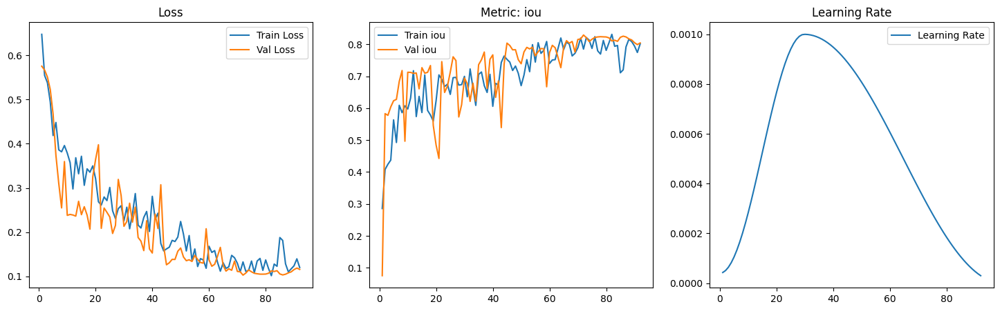

In [308]:
plot_history(history)

In [309]:
preds, targets = test(
    model_class=lambda: UNet(),
    checkpoint_path="best_model.pth",
    test_loader=test_dataloader,
    loss_fn=tversky_focal_loss
)

Test Loss: 0.1006


In [310]:
iou_score(preds.to(device), targets.to(device))

tensor(0.8384, device='cuda:0')

In [311]:
dice_score(preds.to(device), targets.to(device))

tensor(0.4826, device='cuda:0')

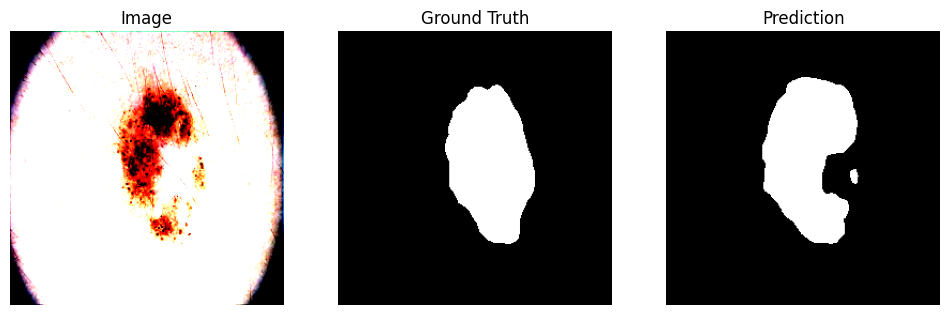

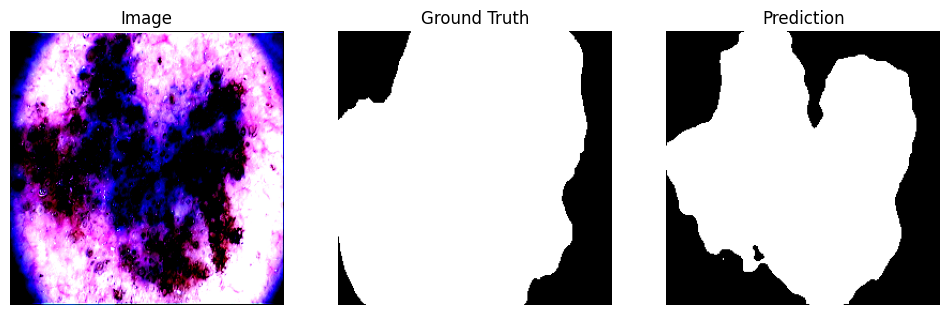

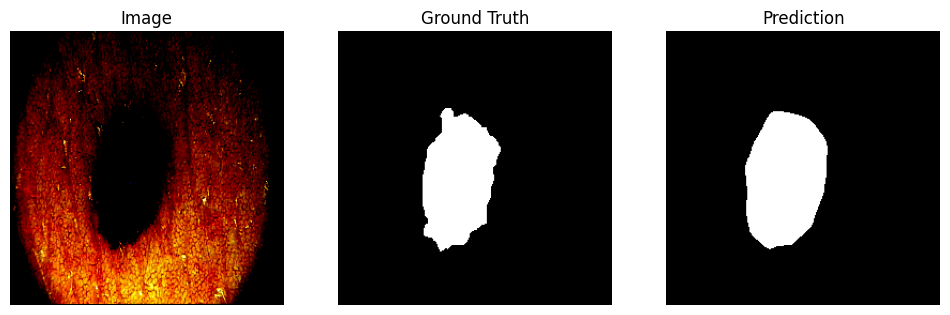

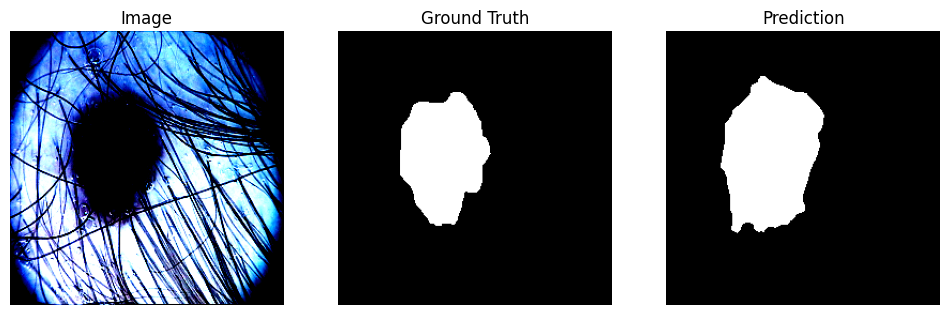

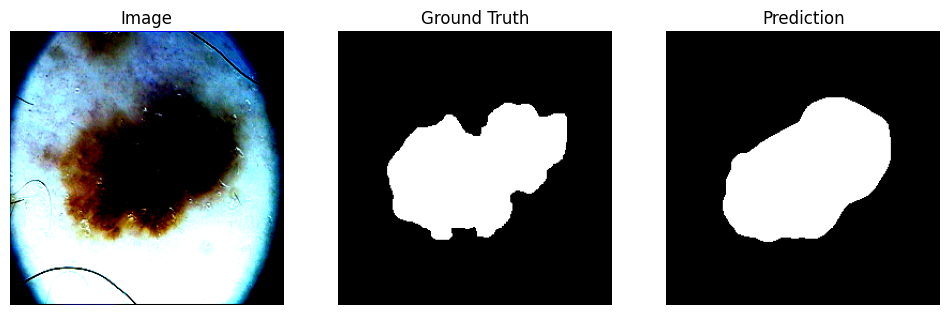

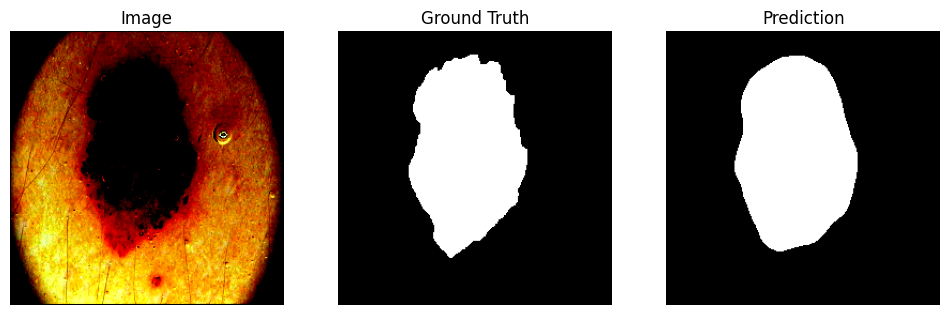

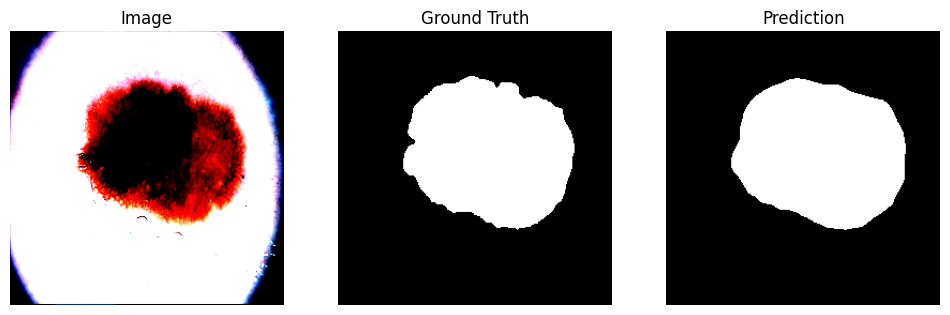

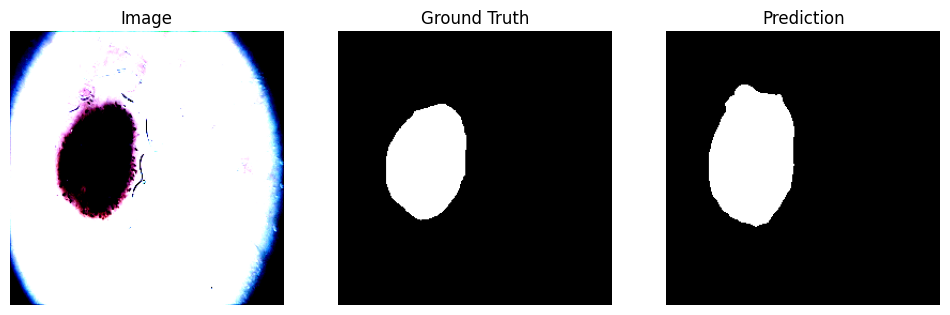

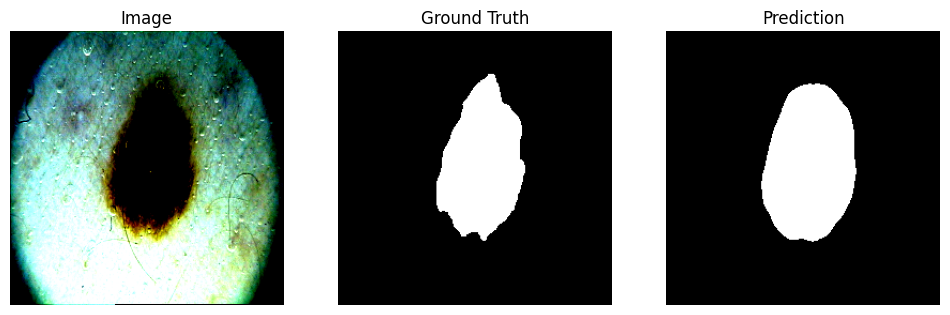

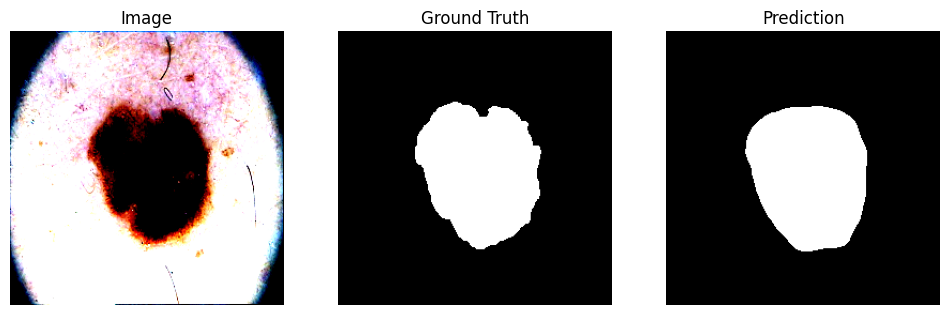

In [312]:
show_predictions(
    model_class=UNet,
    checkpoint_path="best_model.pth",
    dataloader=test_dataloader,
    device='cuda',
    num_batches=2,
    max_items=10
    )

# Отчет:

